In [1]:
# Final set of unified functions for all ipynbs:
## - Pull in the model function
import sys
import os
from class_based_implementation.train_model import objective, MODEL_CLASSES, LOSS_FUNCTIONS # Import mappings too

# Move these somewhere else eventually
def load_model(model_name, model_path):
    model_class = MODEL_CLASSES[model_name]
    model = model_class.load_from_checkpoint(model_path, strict=False)
    return model

def return_weights(model):
    weights = {}
    weights["w1_param"] = model.w1.data
    weights["w2_param"] = model.w2.data
    weights["v1_param"] = model.v1.data
    if model.gamma is not None:
        weights["gamma_param"] = model.gamma.data
    else:
        weights["gamma_param"] = None
    return weights

/scratch/nar8991/snn/.venv/lib64/python3.9/site-packages/networkx/utils/backends.py:135: RuntimeWarning: networkx backend defined more than once: nx-loopback
  backends.update(_get_backends("networkx.backends"))


Seed: 1


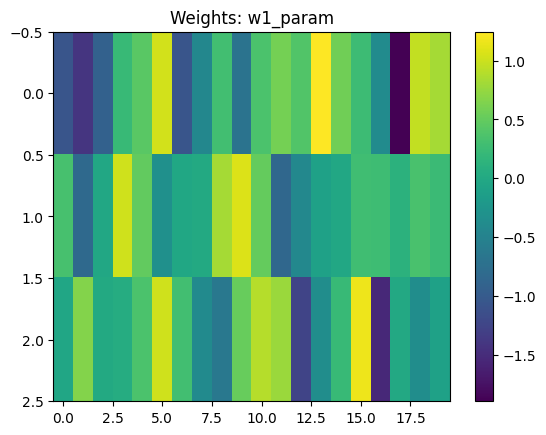

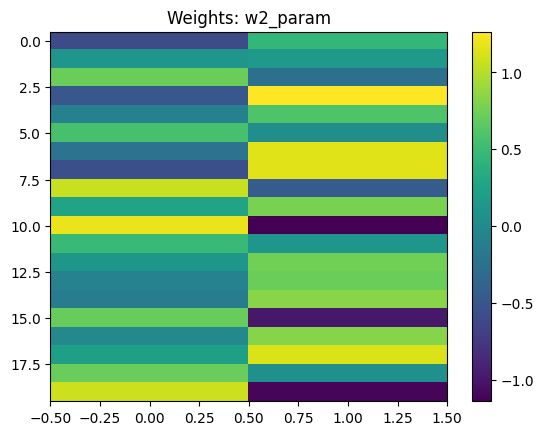

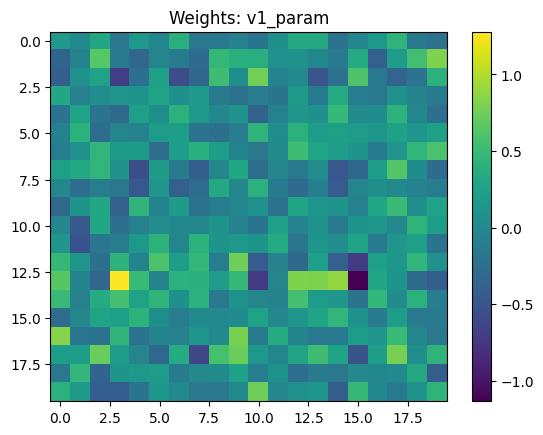

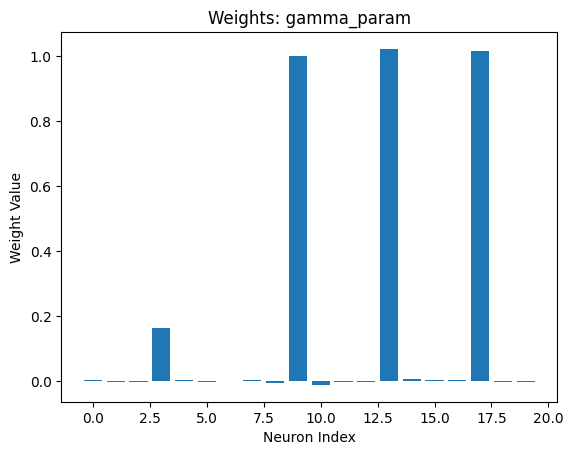

Seed: 2


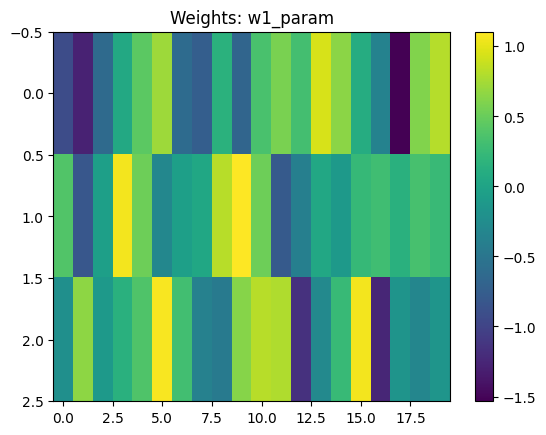

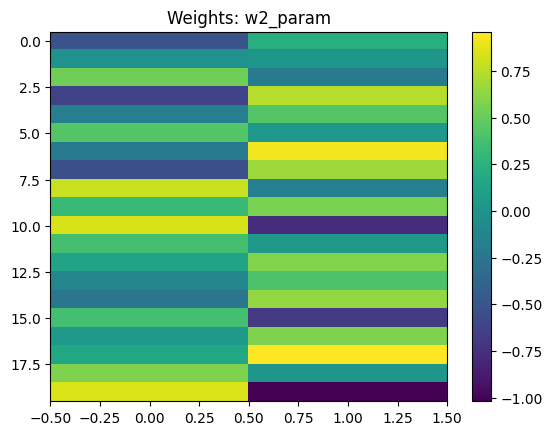

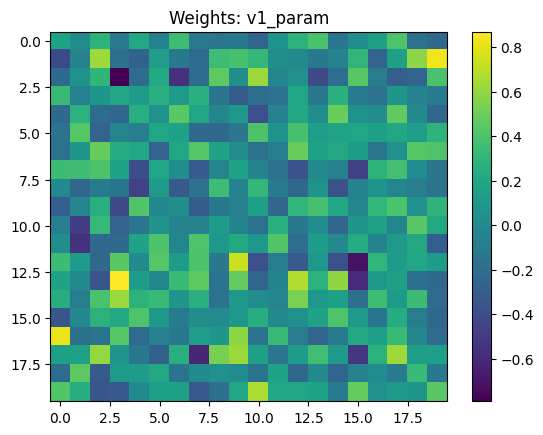

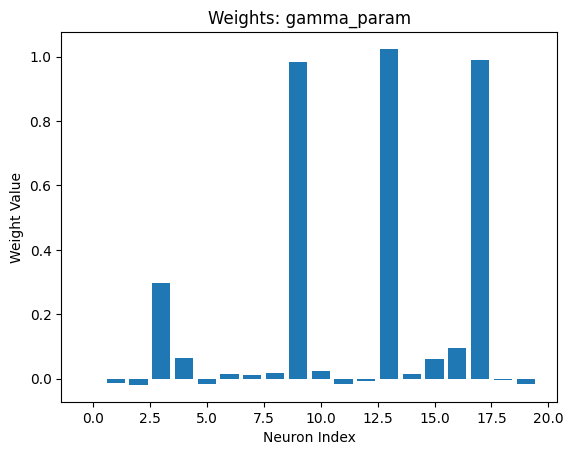

Seed: 3


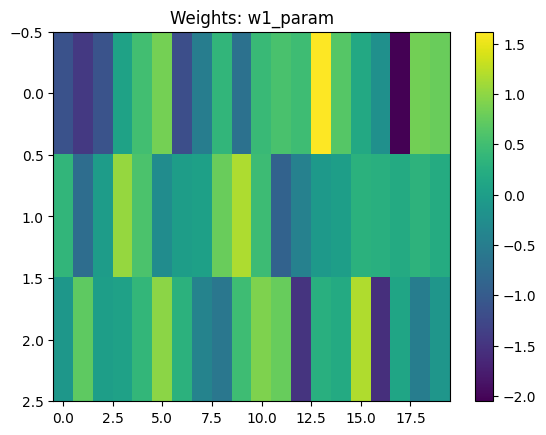

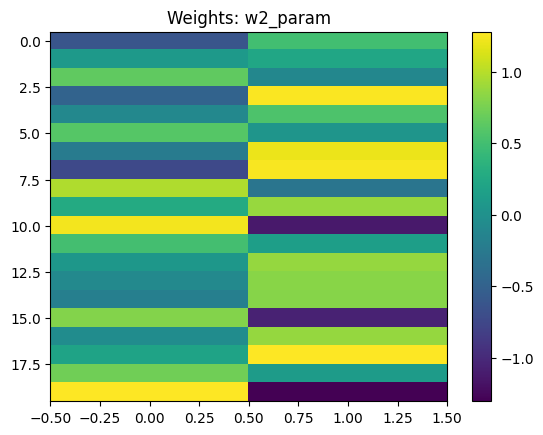

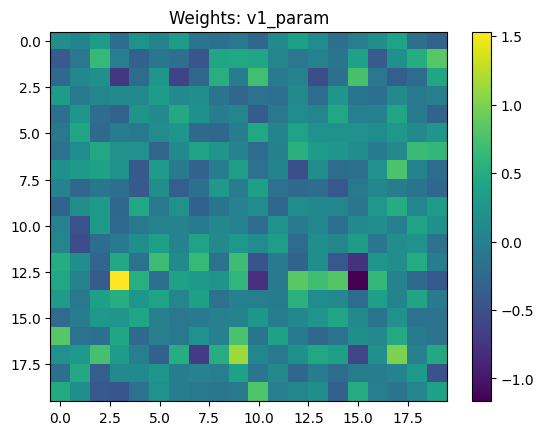

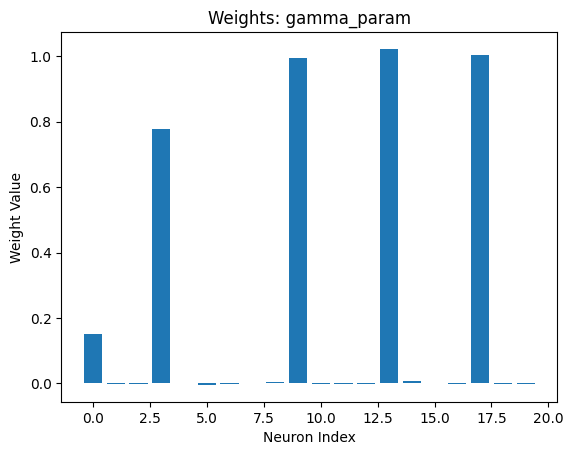

Seed: 4


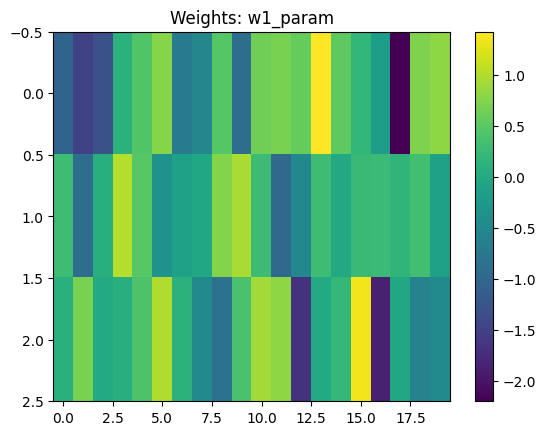

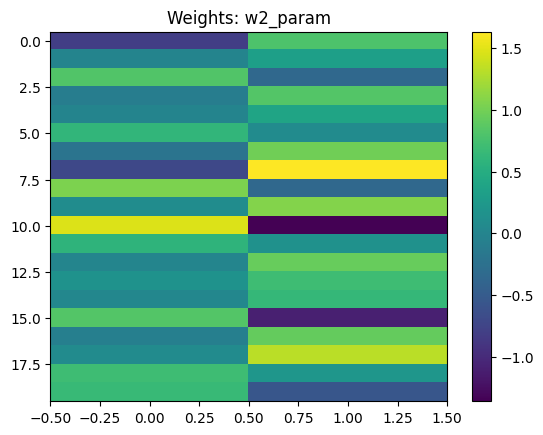

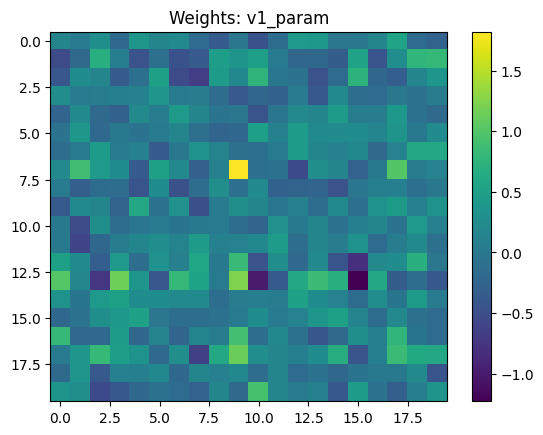

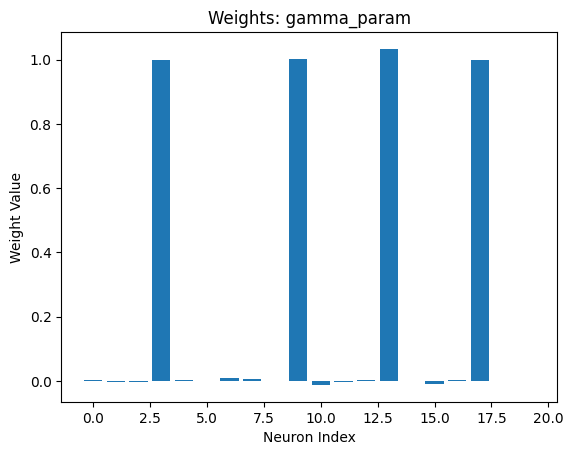

Seed: 5


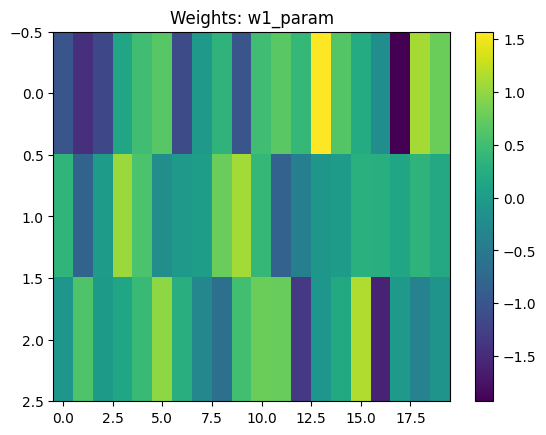

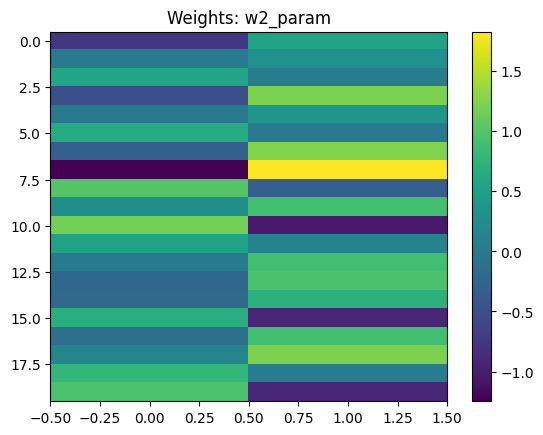

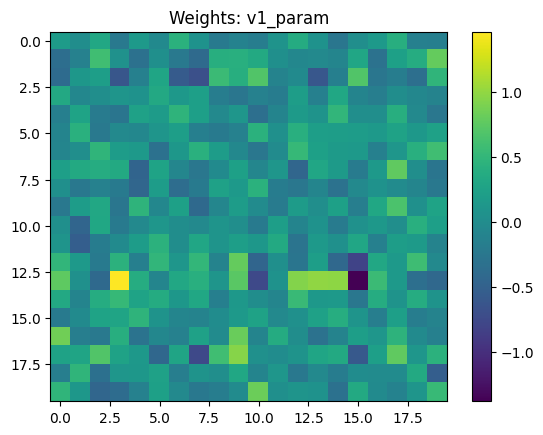

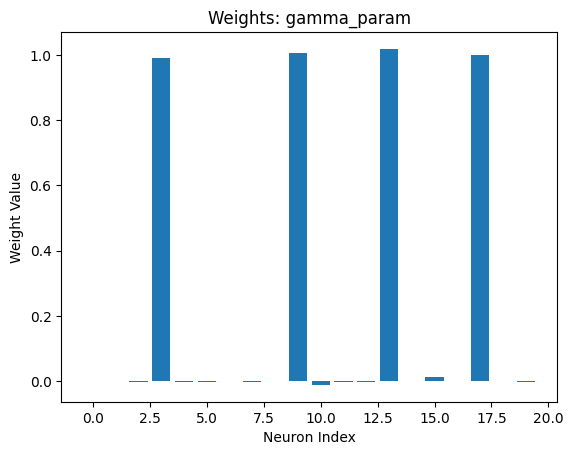

In [2]:
# Visualize all the weights
import matplotlib.pyplot as plt
def visualize_weights(weights):
    for key, value in weights.items():
        if value is not None:
            # If 2-D, plot as heatmap
            if len(value.shape) == 2:
                plt.figure()
                plt.title(f"Weights: {key}")
                plt.imshow(value.cpu().numpy(), aspect='auto', cmap='viridis')
                plt.colorbar()
                plt.show()
            elif len(value.shape) == 1:
                plt.figure()
                plt.title(f"Weights: {key}")
                plt.bar(range(len(value.cpu().numpy())), value.cpu().numpy())
                plt.xlabel("Neuron Index")
                plt.ylabel("Weight Value")
                plt.show()
        # If 1-D, plot as line

sampler_type = "tpe"

# Do this for all of the flexible spiking models (print seed and then show)
for seed in range(1,6):
    print(f"Seed: {seed}")
    path = f"/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/20_hidden/1.0_pct_data/None_percent_snn/rand_gamma_init/gamma_fixed_False/reset_nsn_False/best_model_of_study.ckpt"
    model = load_model("Hybrid_NSN_SNN_V1_Flexible_Spiking", path)
    weights = return_weights(model)
    visualize_weights(weights)

In [3]:
# Now let's visualize the membrane potentials on the test set
from test_visualizations.utils import get_randman_test_data
import torch
from tqdm import tqdm
test_loader = get_randman_test_data()
# Now let's track the membrane potentials for each model
def get_membrane_potentials(model, test_loader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.test_accuracy.reset()
    model.to(device)
    model.zero_grad()
    # membrane_potentials = []
    # synaptic_currents = []
    for inputs, targets in tqdm(test_loader, desc="Testing"):
        inputs, targets = inputs.to(device), targets.to(device)
        _, auxiliary_outputs, _, hidden_out_t = model(inputs)
        # print(auxiliary_outputs['synaptic_currents'].shape)
        return auxiliary_outputs, hidden_out_t
    #     membrane_potentials.append(auxiliary_outputs['membrane_potentials'].cpu().numpy())
    #     synaptic_currents.append(auxiliary_outputs['synaptic_currents'].cpu().numpy())

    # return membrane_potentials, synaptic_currents

# Graph a single example of membrane potentials and synaptic currents
def graph_membrane_potentials_and_synaptic_currents(membrane_potentials, synaptic_currents, example_idx=0):
    # Shape -> 50 in batch, 400 time steps, 20 hidden
    # We want to graph the membrane potentials and synaptic currents for all 20 hidden neurons
    # for a single example in the batch (e.g., example_idx=0)
    plt.figure(figsize=(12, 6))
    plt.subplot(2, 1, 1)
    plt.title("Membrane Potentials Over Time")
    plt.imshow(membrane_potentials[example_idx].T, aspect='auto', cmap='viridis')
    plt.colorbar(label='Membrane Potential')
    plt.ylabel('Neuron Index')

    plt.subplot(2, 1, 2)
    plt.title("Synaptic Currents Over Time")
    plt.imshow(synaptic_currents[example_idx].T, aspect='auto', cmap='plasma')
    plt.colorbar(label='Synaptic Current')
    plt.xlabel('Time Step')
    plt.ylabel('Neuron Index')

    plt.tight_layout()
    plt.show()

def single_mem_and_syn_potential(membrane_potentials, synaptic_currents, hidden_out_t, neuron_idx=0, example_idx=0):
    # Shape -> 50 in batch, 400 time steps, 20 hidden
    # We want to graph the membrane potentials and synaptic currents for a single neuron
    # (e.g., neuron_idx=0) for a single example in the batch (e.g., example_idx=0)
    plt.figure(figsize=(10, 4))
    plt.plot(membrane_potentials[example_idx, :, neuron_idx], label='Membrane Potential', color='blue')
    plt.plot(synaptic_currents[example_idx, :, neuron_idx], label='Synaptic Current', color='orange')
    plt.plot(hidden_out_t[example_idx, :, neuron_idx], label='Neuron Output', color='green', linestyle='--')
    plt.title(f"Neuron {neuron_idx} Membrane Potential and Synaptic Current Over Time")
    plt.xlabel('Time Step')
    plt.ylabel('Value')
    plt.legend()
    plt.grid()
    plt.show()
# Now let's plot a single neuron membrane potential and synaptic current over time
# for the first example in the batch
# for seed in range(1,6):
#     print(f"Seed: {seed}")
#     path = f"/vast/nar8991/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_S


Seed: 1


Testing:   0%|          | 0/1 [00:01<?, ?it/s]


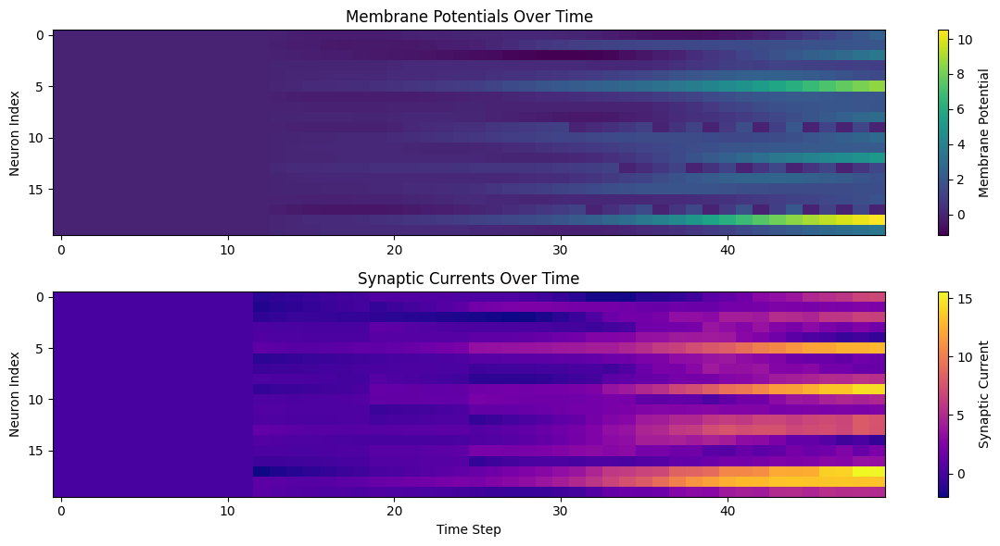

Neuron 0 is non-spiking.
Gamma value: 0.0041105556301772594


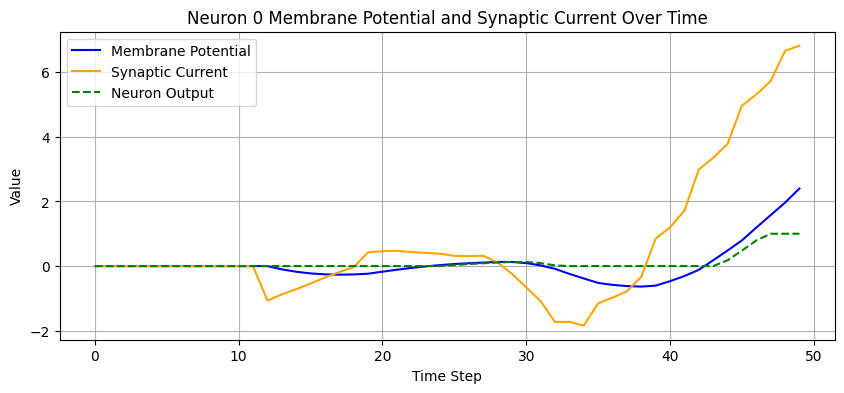

Neuron 1 is non-spiking.
Gamma value: -0.0017578063998371363


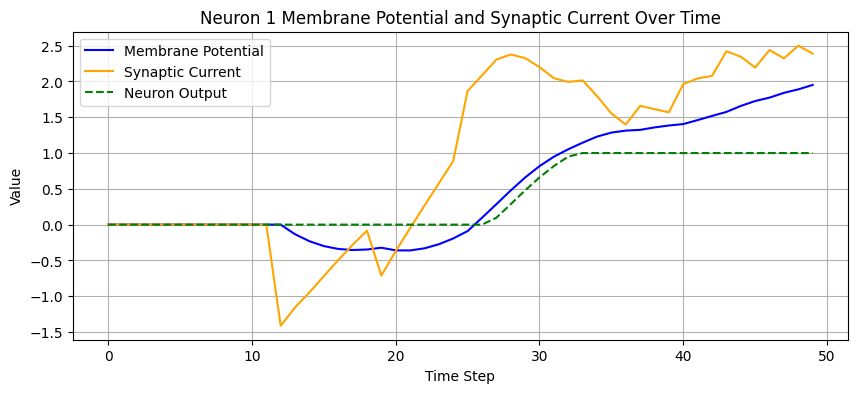

Neuron 2 is non-spiking.
Gamma value: -0.002568822354078293


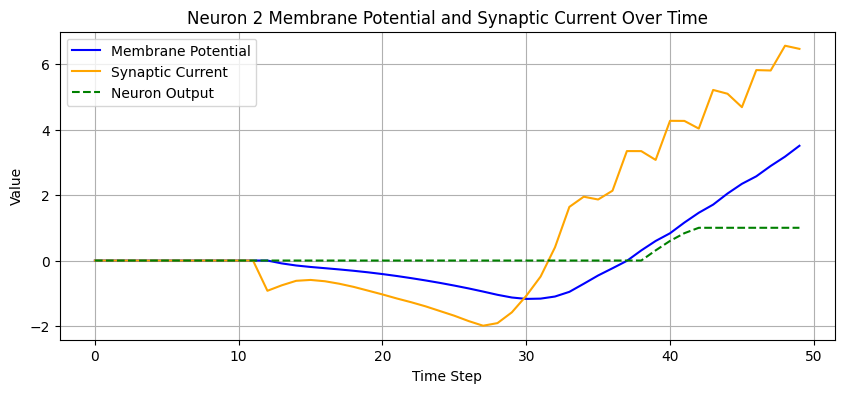

Neuron 3 is non-spiking.
Gamma value: 0.1648920774459839


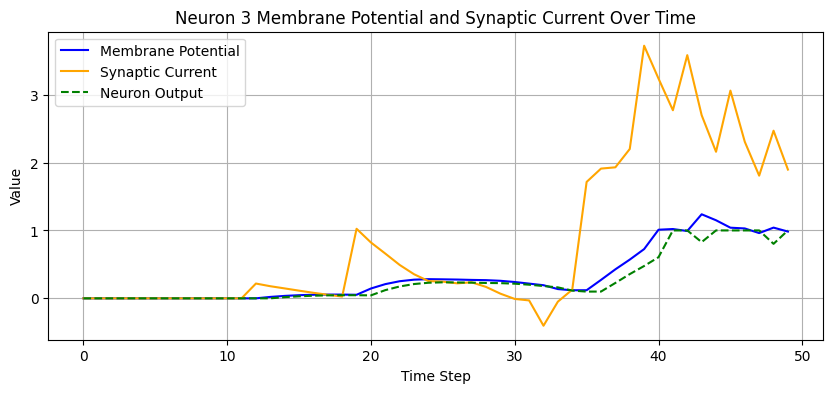

Neuron 4 is non-spiking.
Gamma value: 0.004835091531276703


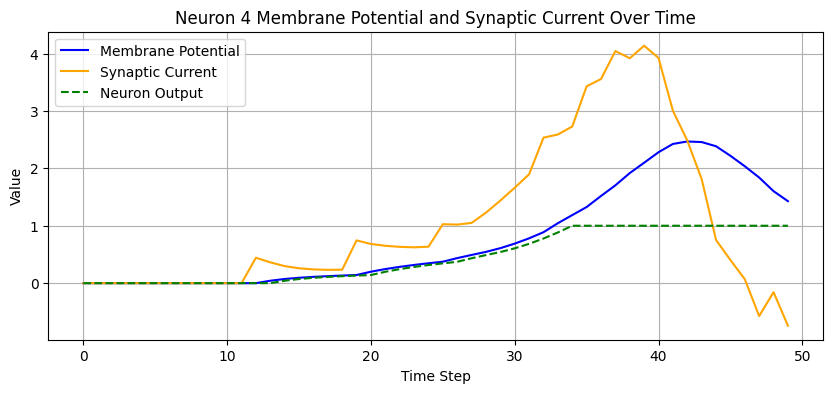

Neuron 5 is non-spiking.
Gamma value: -0.0027815101202577353


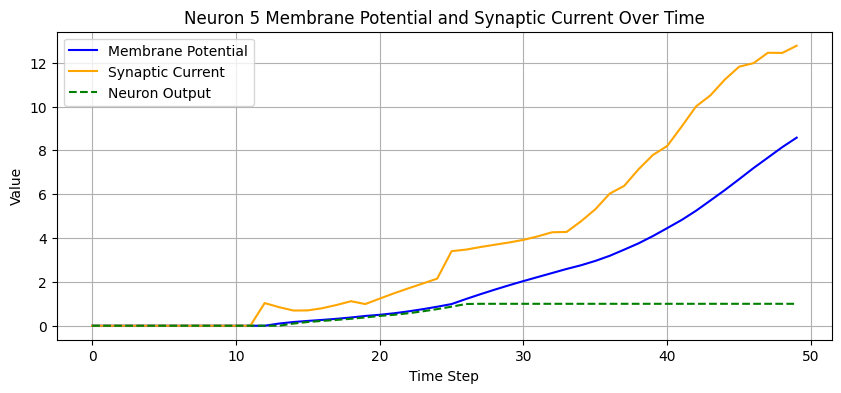

Neuron 6 is non-spiking.
Gamma value: 0.00040880386950448155


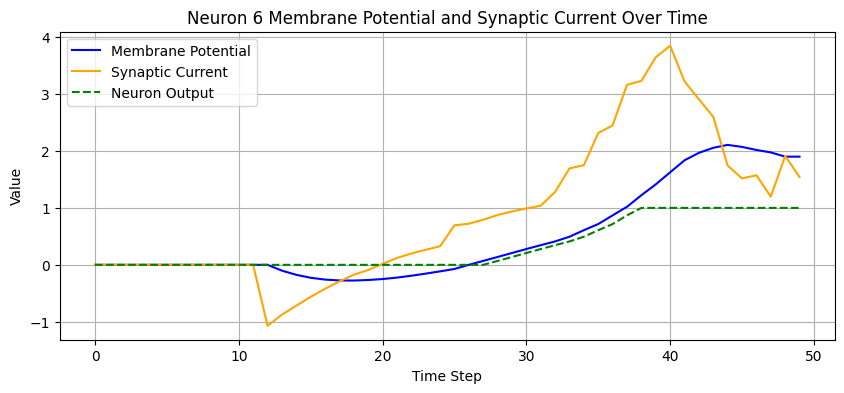

Neuron 7 is non-spiking.
Gamma value: 0.005104956217110157


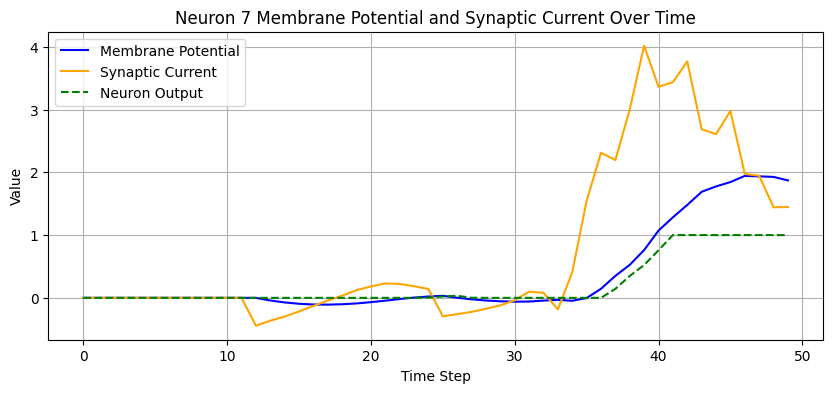

Neuron 8 is non-spiking.
Gamma value: -0.004936658777296543


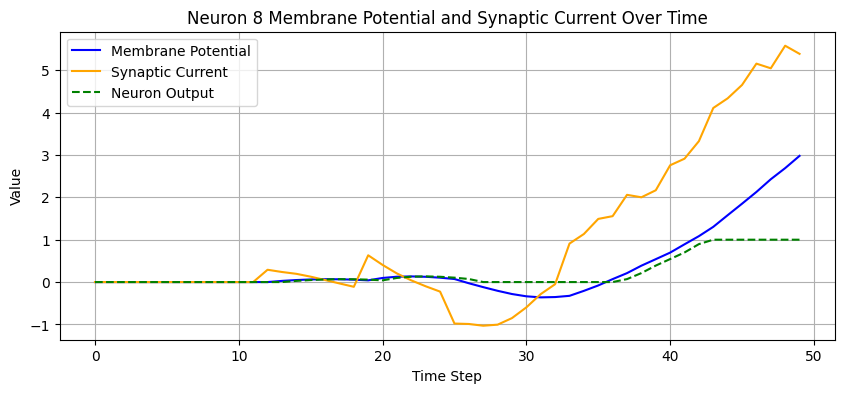

Neuron 9 is spiking.
Gamma value: 1.000684142112732


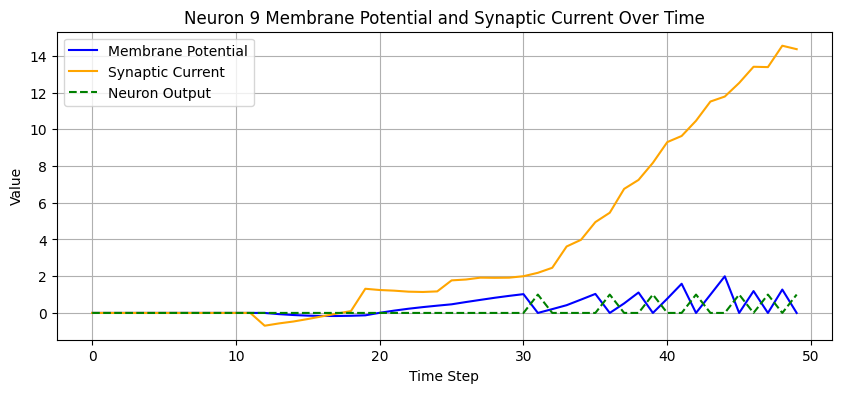

Neuron 10 is non-spiking.
Gamma value: -0.010700068436563015


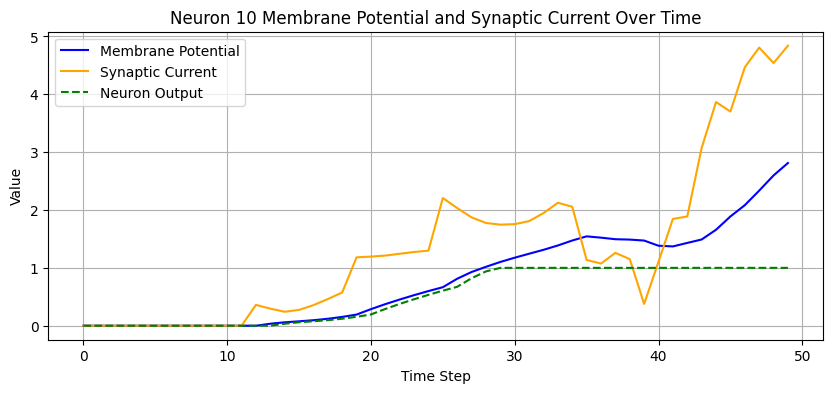

Neuron 11 is non-spiking.
Gamma value: -0.002978067845106125


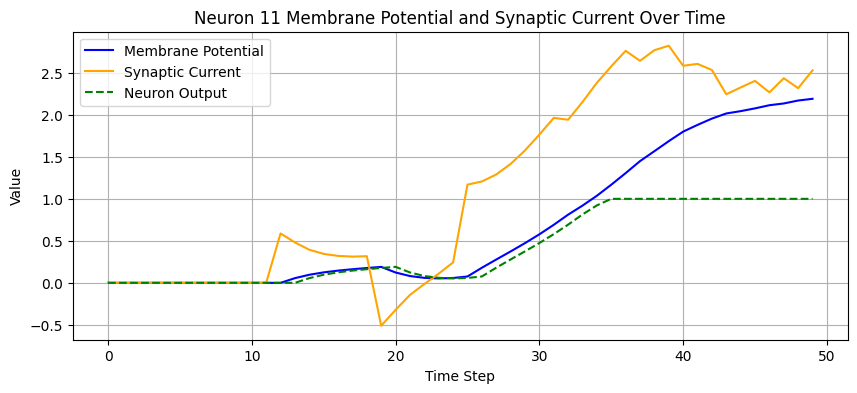

Neuron 12 is non-spiking.
Gamma value: -0.0007295861141756177


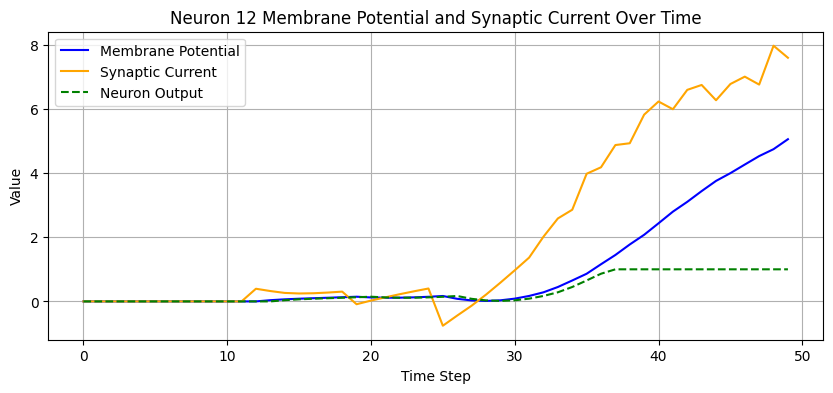

Neuron 13 is spiking.
Gamma value: 1.0218567848205566


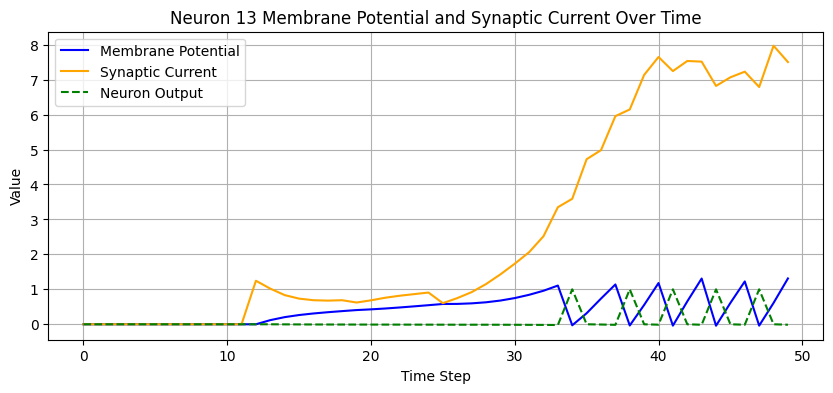

Neuron 14 is non-spiking.
Gamma value: 0.009017246775329113


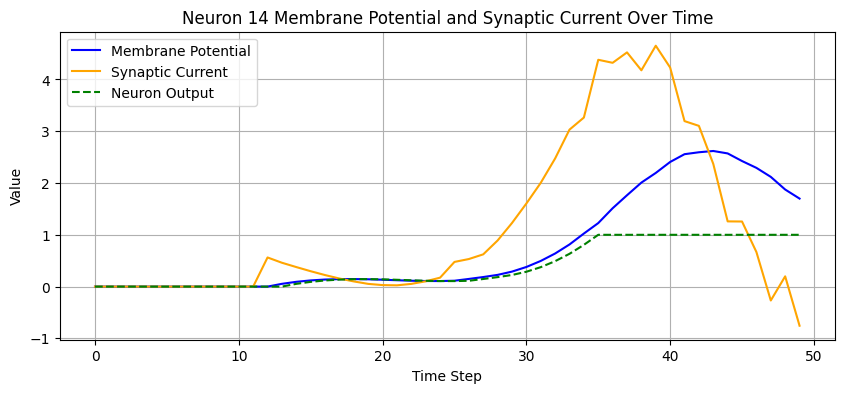

Neuron 15 is non-spiking.
Gamma value: 0.0033896875102072954


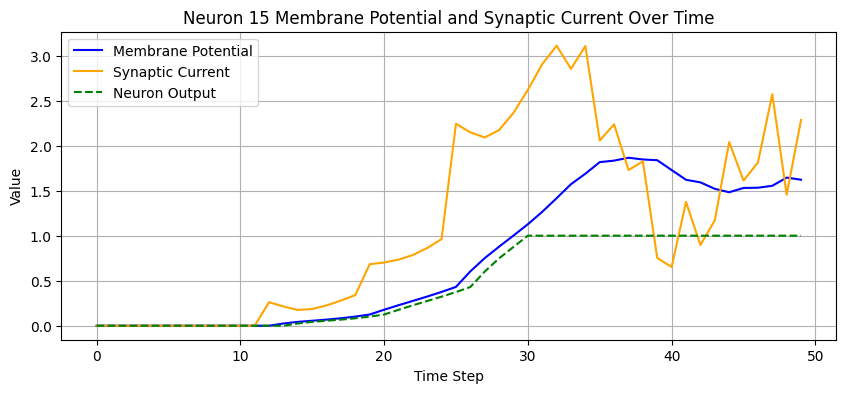

Neuron 16 is non-spiking.
Gamma value: 0.003794775577262044


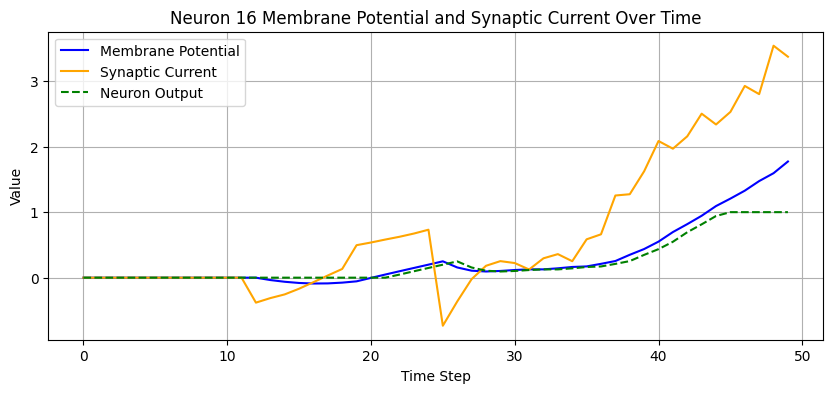

Neuron 17 is spiking.
Gamma value: 1.015761375427246


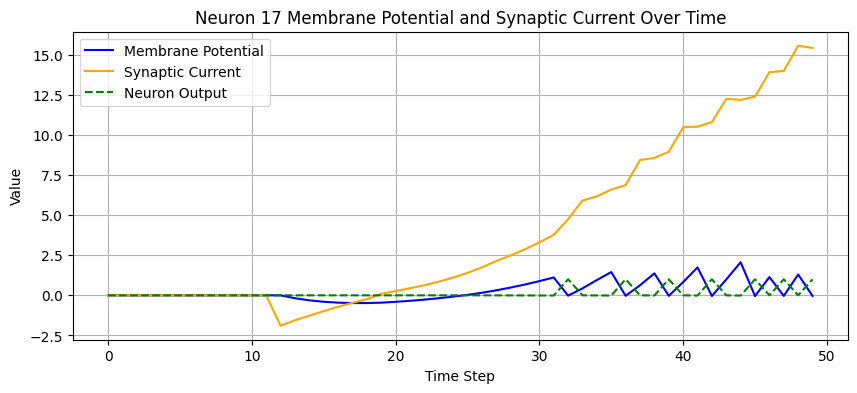

Neuron 18 is non-spiking.
Gamma value: -0.0023146490566432476


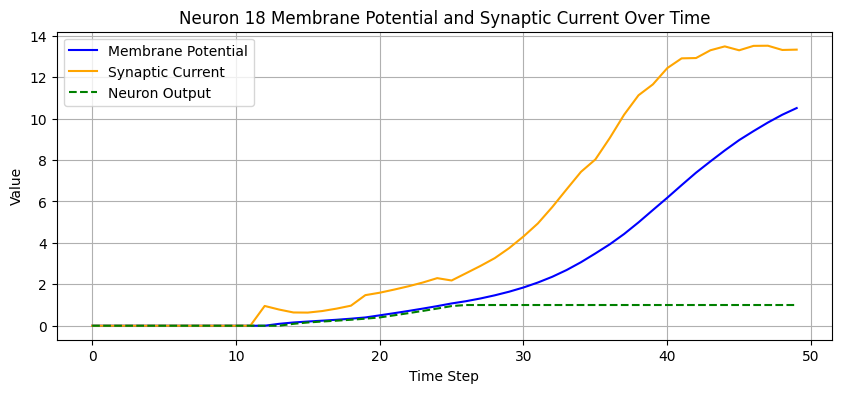

Neuron 19 is non-spiking.
Gamma value: -0.0017847702838480473


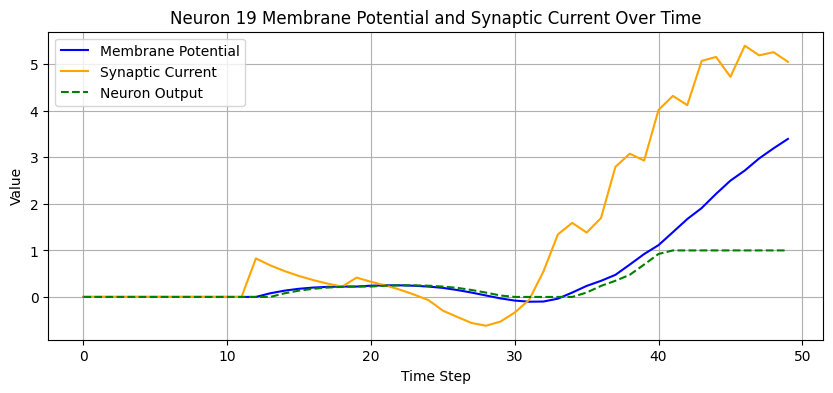

Seed: 2


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


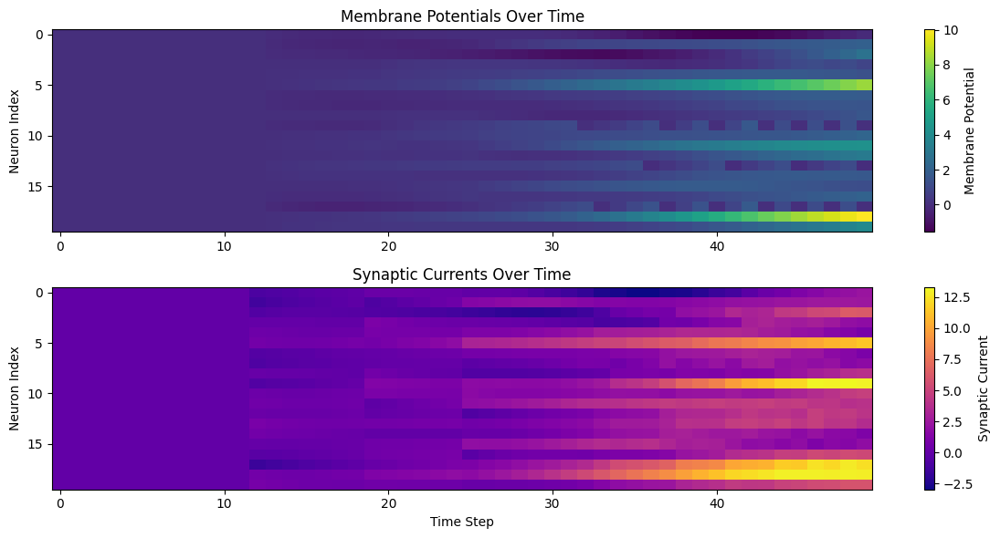

Neuron 0 is non-spiking.
Gamma value: -0.000583408575039357


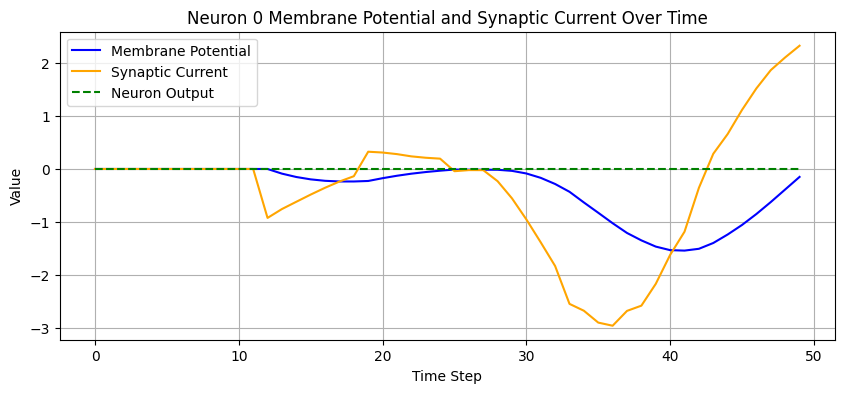

Neuron 1 is non-spiking.
Gamma value: -0.01325893122702837


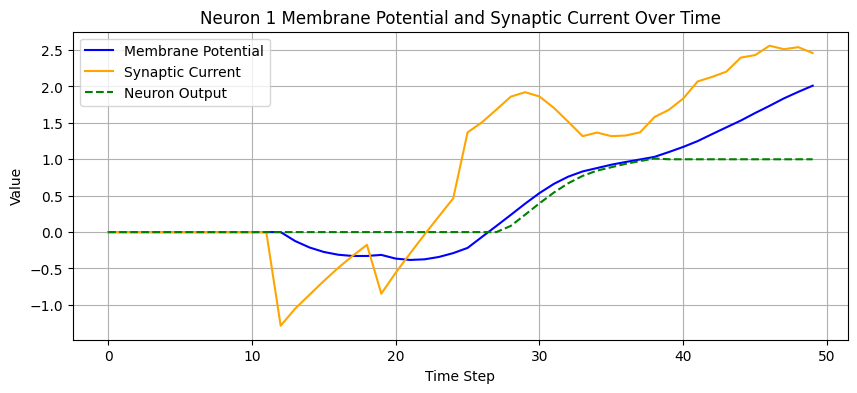

Neuron 2 is non-spiking.
Gamma value: -0.01907200552523136


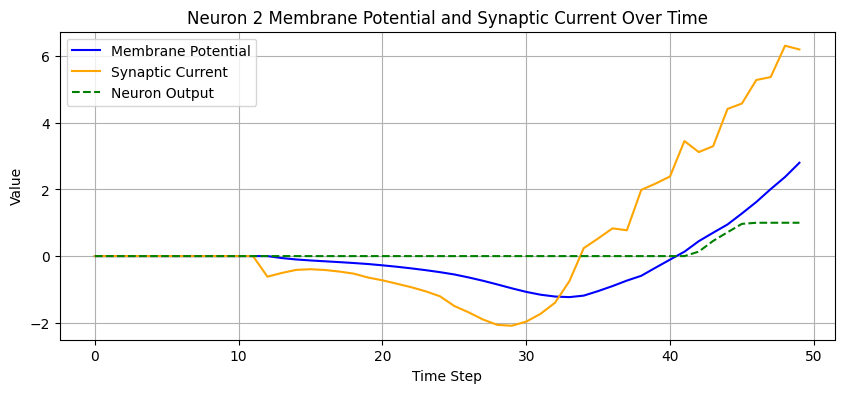

Neuron 3 is non-spiking.
Gamma value: 0.2973906397819519


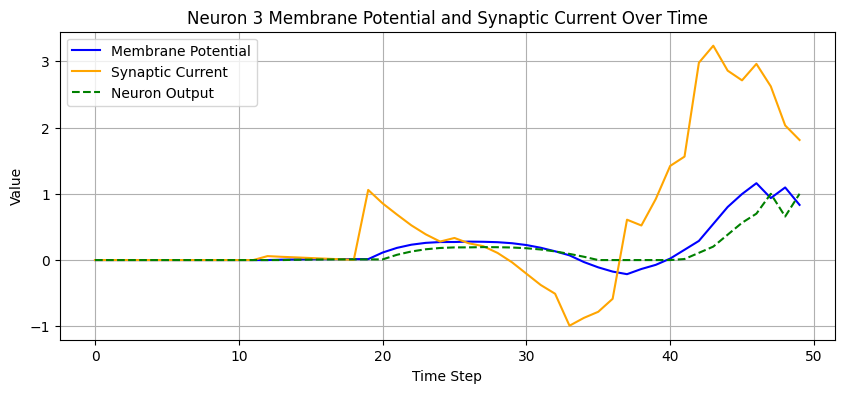

Neuron 4 is non-spiking.
Gamma value: 0.0645892471075058


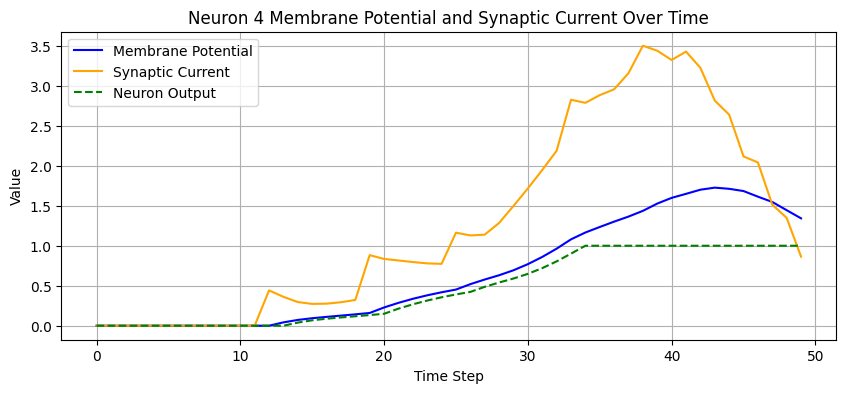

Neuron 5 is non-spiking.
Gamma value: -0.016603980213403702


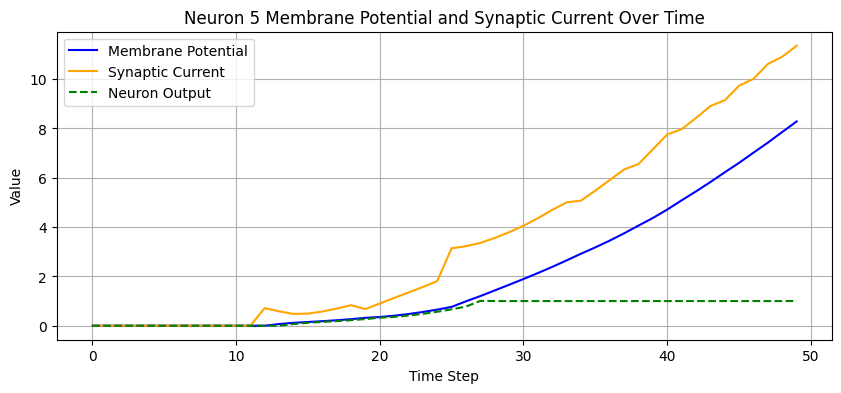

Neuron 6 is non-spiking.
Gamma value: 0.013528499752283096


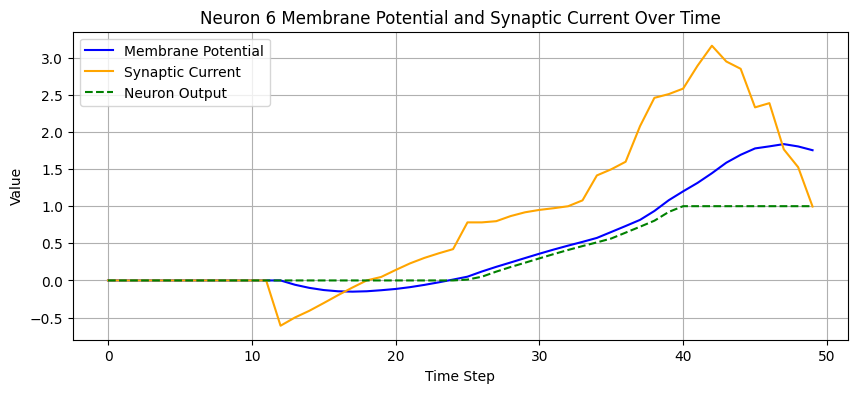

Neuron 7 is non-spiking.
Gamma value: 0.011309829540550709


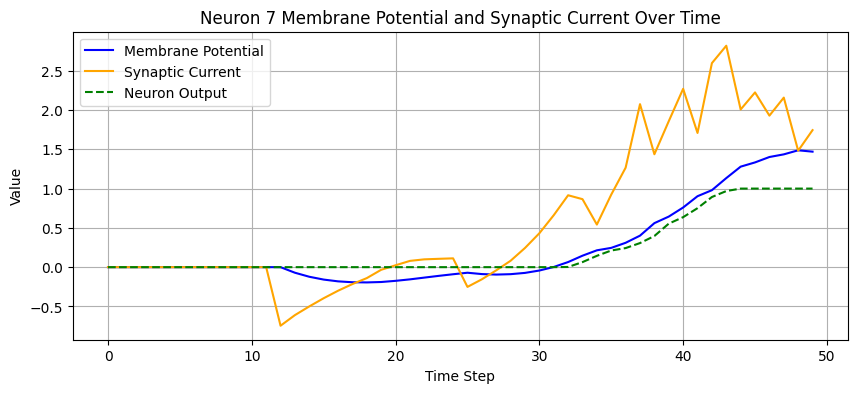

Neuron 8 is non-spiking.
Gamma value: 0.017720341682434082


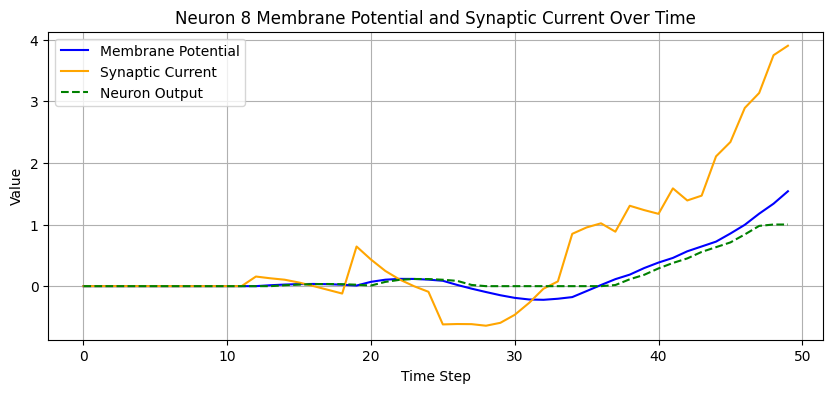

Neuron 9 is spiking.
Gamma value: 0.9828501343727112


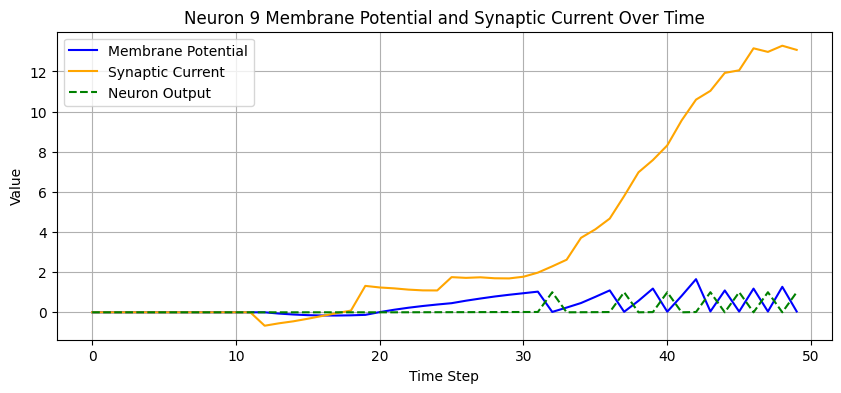

Neuron 10 is non-spiking.
Gamma value: 0.025074787437915802


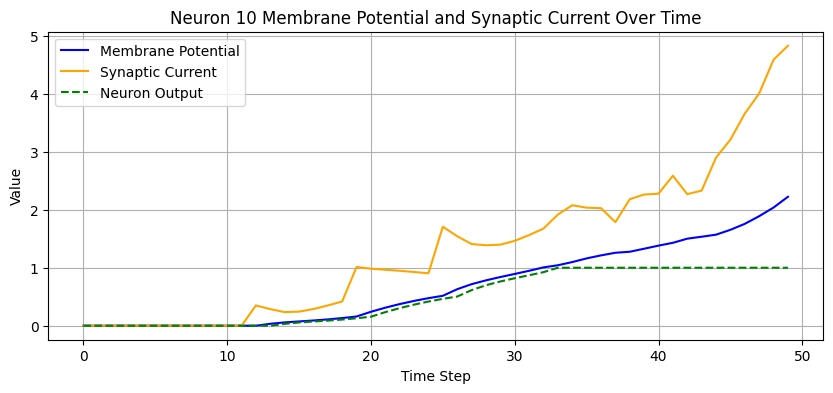

Neuron 11 is non-spiking.
Gamma value: -0.015411780215799809


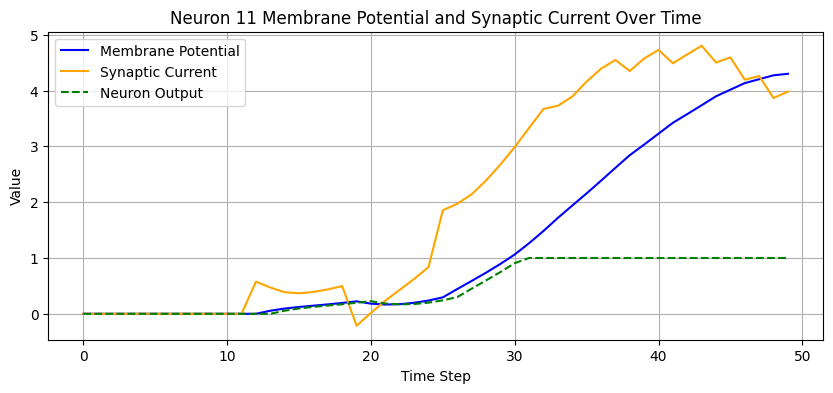

Neuron 12 is non-spiking.
Gamma value: -0.006413889583200216


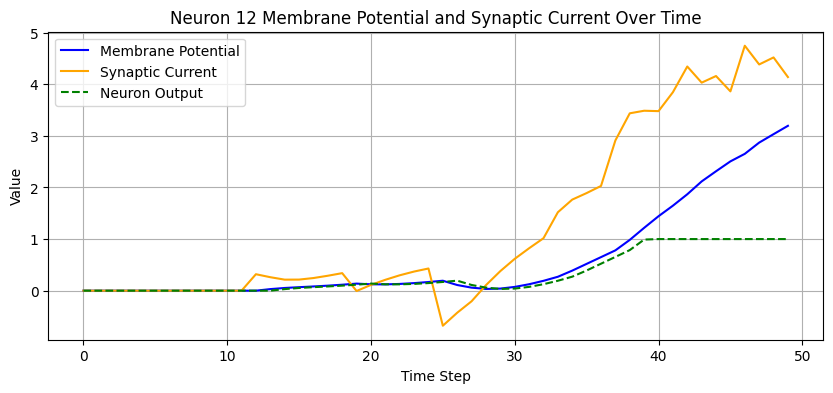

Neuron 13 is spiking.
Gamma value: 1.0239454507827759


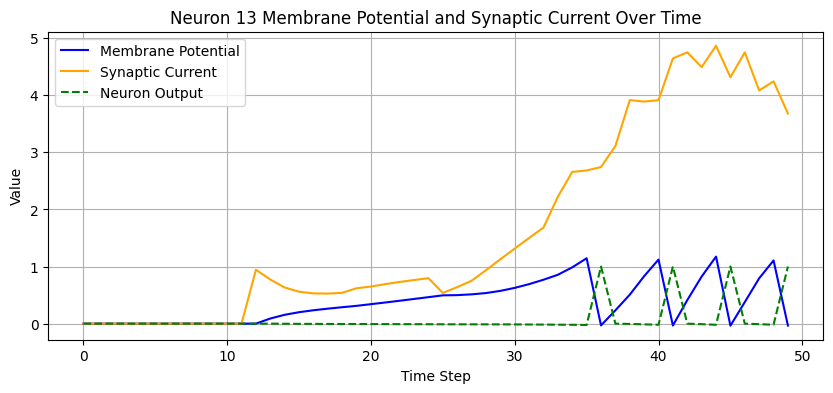

Neuron 14 is non-spiking.
Gamma value: 0.016348566859960556


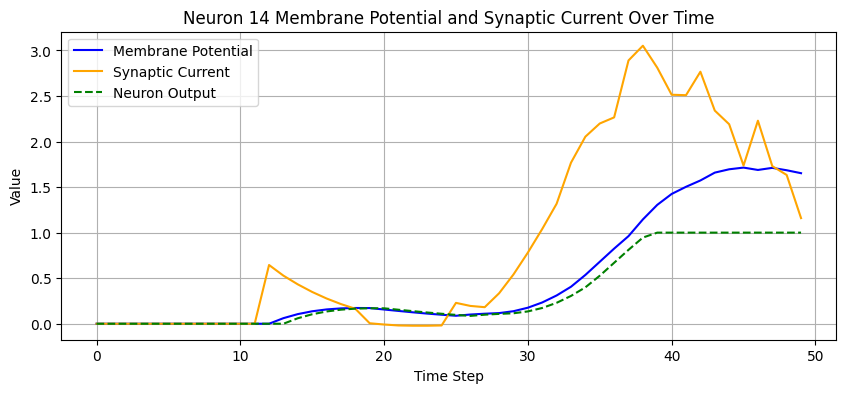

Neuron 15 is non-spiking.
Gamma value: 0.061762113124132156


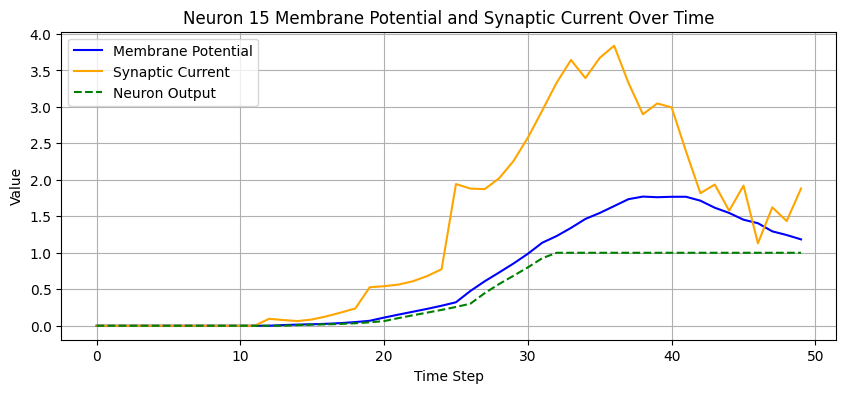

Neuron 16 is non-spiking.
Gamma value: 0.09527694433927536


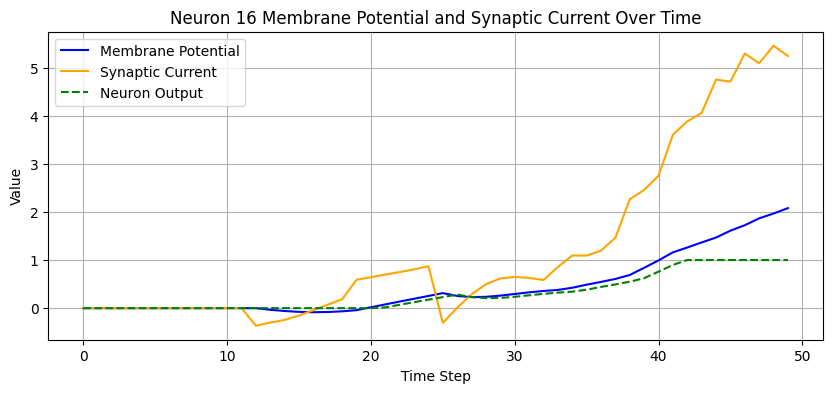

Neuron 17 is spiking.
Gamma value: 0.9883825778961182


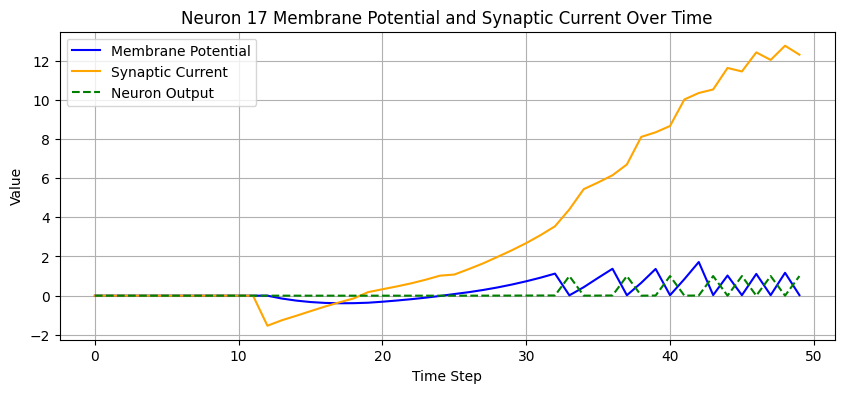

Neuron 18 is non-spiking.
Gamma value: -0.004534462932497263


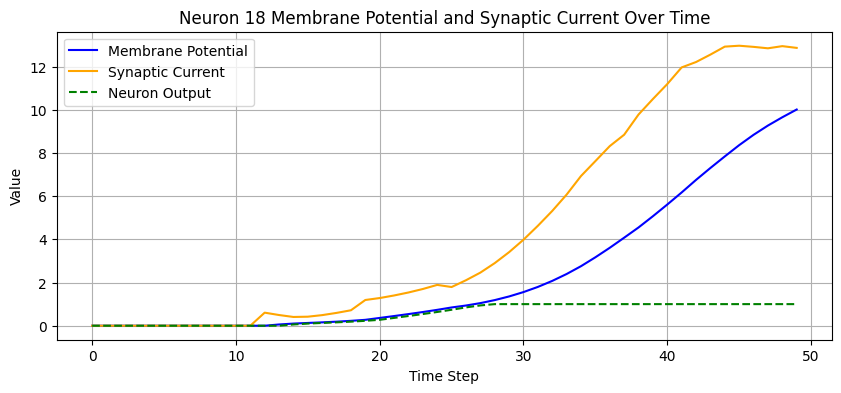

Neuron 19 is non-spiking.
Gamma value: -0.016161169856786728


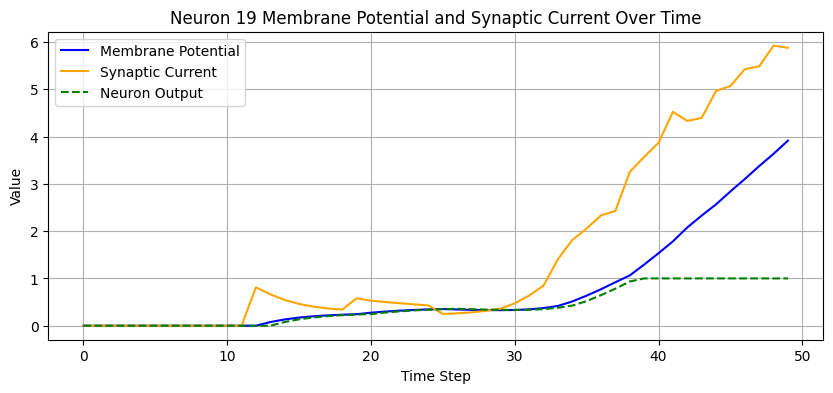

Seed: 3


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


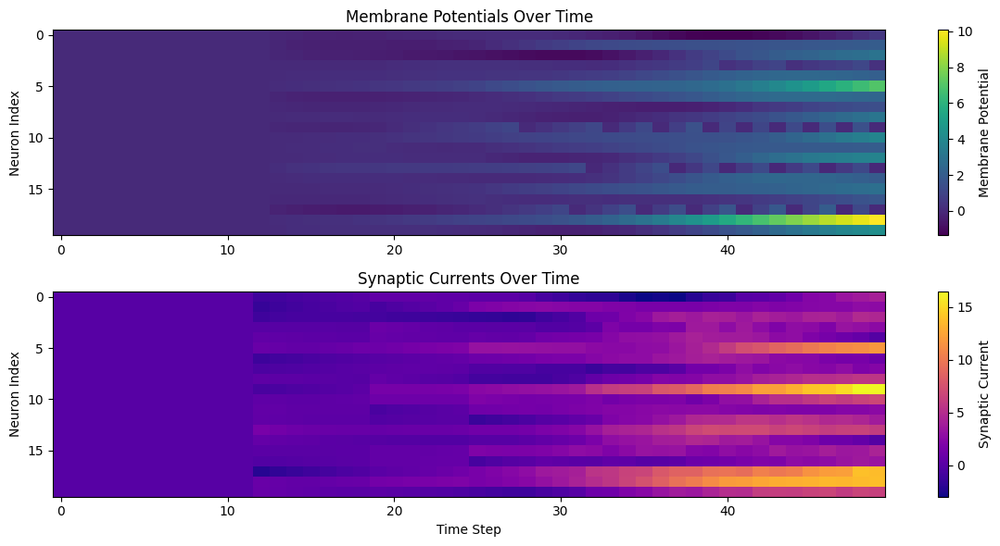

Neuron 0 is non-spiking.
Gamma value: 0.15123899281024933


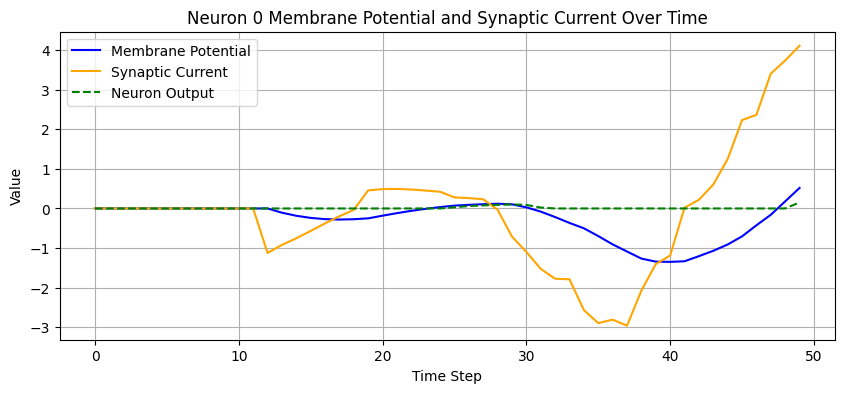

Neuron 1 is non-spiking.
Gamma value: -0.001362268696539104


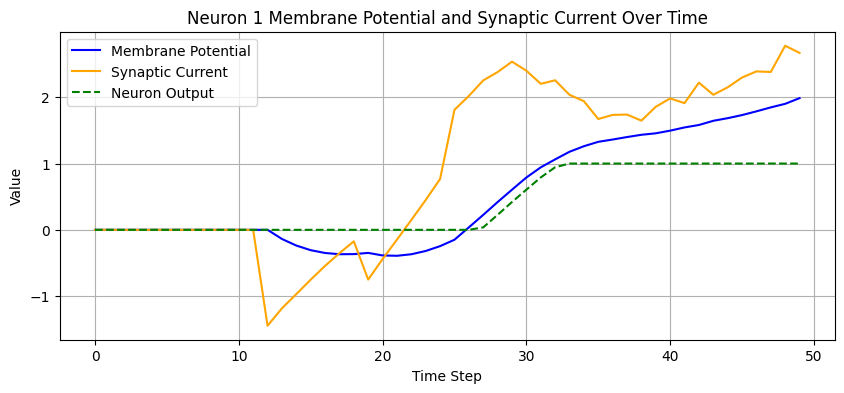

Neuron 2 is non-spiking.
Gamma value: -0.002904936671257019


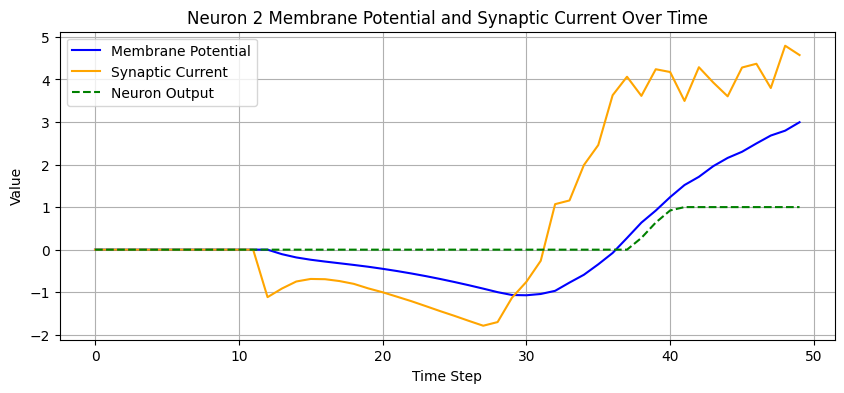

Neuron 3 is spiking.
Gamma value: 0.7769435048103333


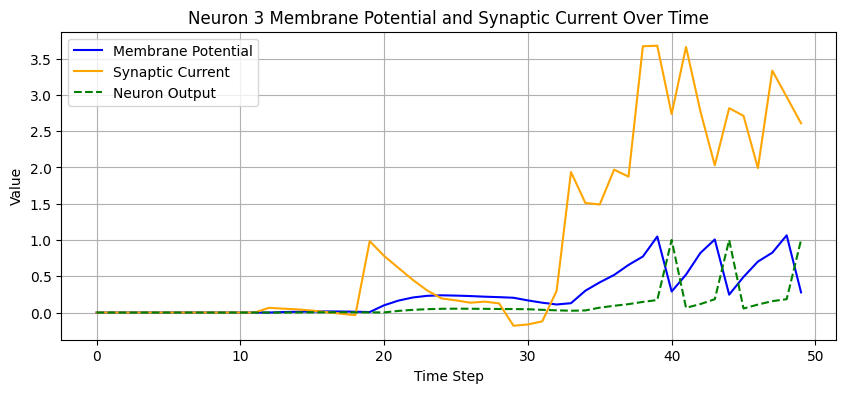

Neuron 4 is non-spiking.
Gamma value: 0.0024678604677319527


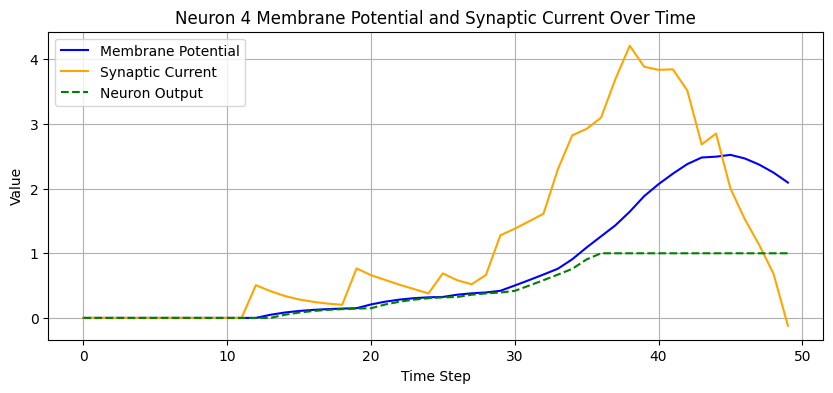

Neuron 5 is non-spiking.
Gamma value: -0.004609873052686453


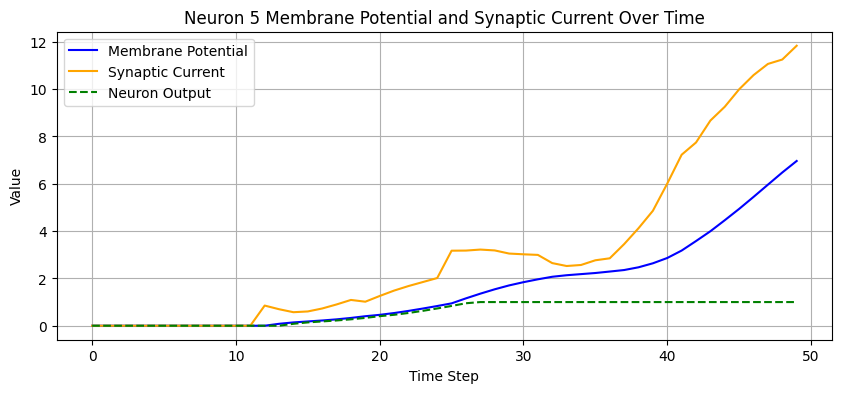

Neuron 6 is non-spiking.
Gamma value: -0.0028627377469092607


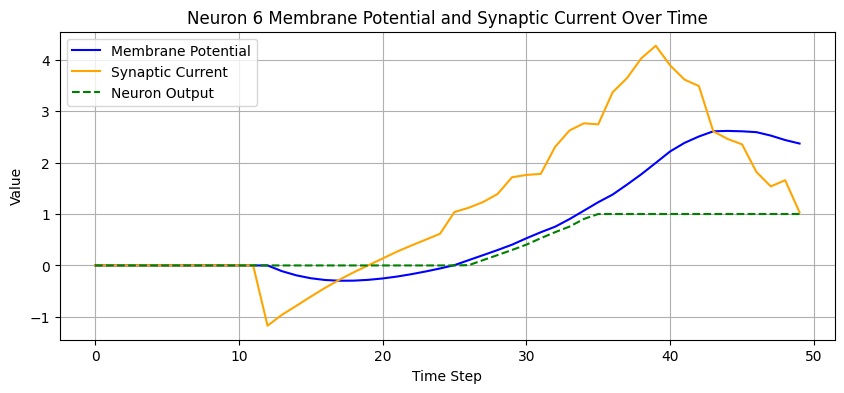

Neuron 7 is non-spiking.
Gamma value: 0.001227999571710825


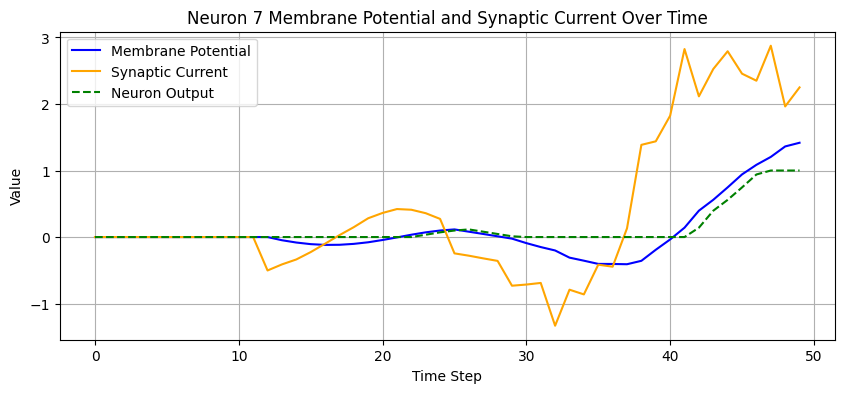

Neuron 8 is non-spiking.
Gamma value: 0.0044693611562252045


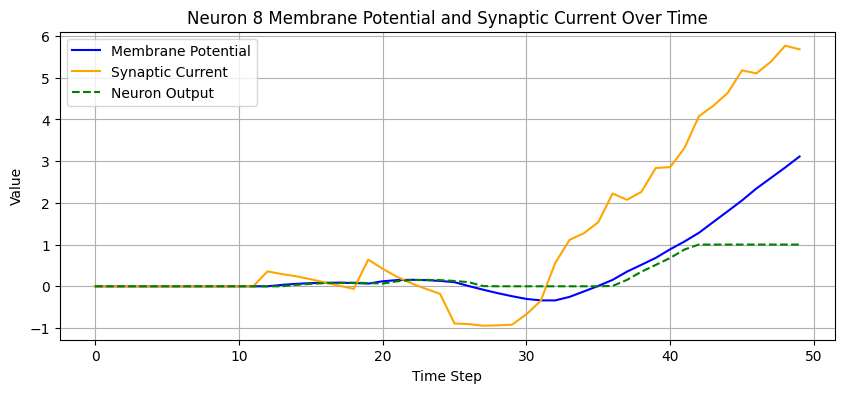

Neuron 9 is spiking.
Gamma value: 0.9934525489807129


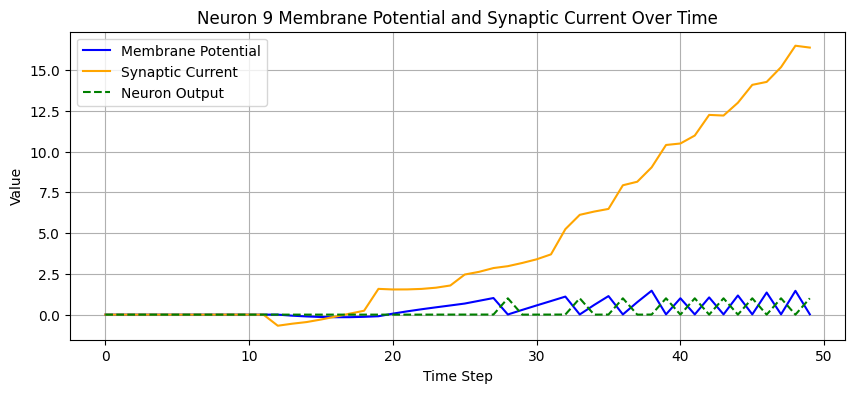

Neuron 10 is non-spiking.
Gamma value: -0.0031442821491509676


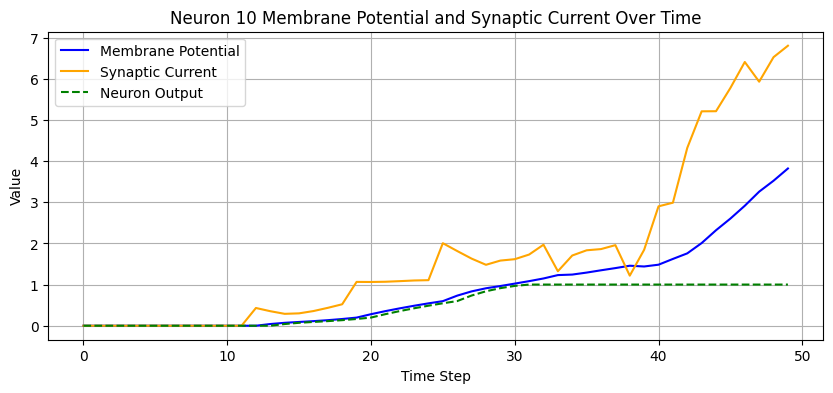

Neuron 11 is non-spiking.
Gamma value: -0.0021552257239818573


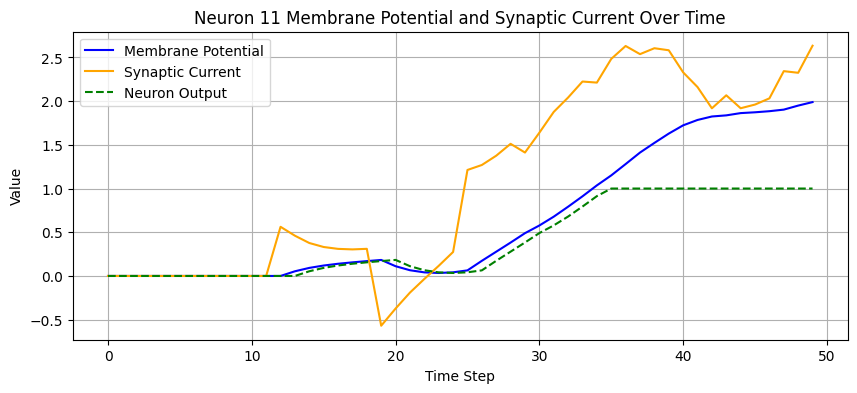

Neuron 12 is non-spiking.
Gamma value: -0.0006527178338728845


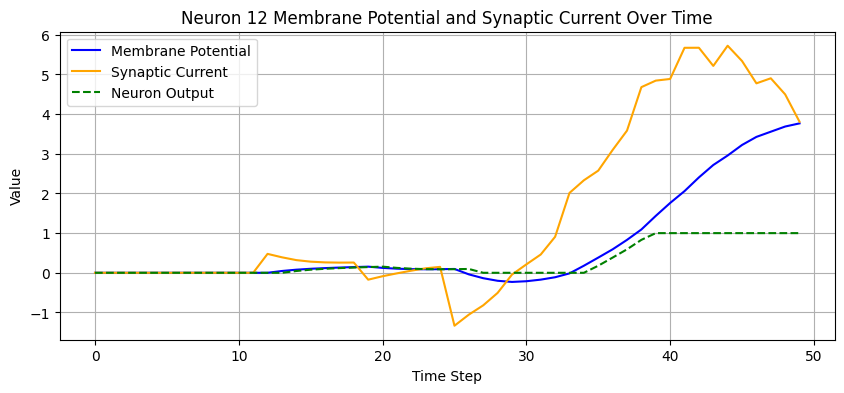

Neuron 13 is spiking.
Gamma value: 1.0223723649978638


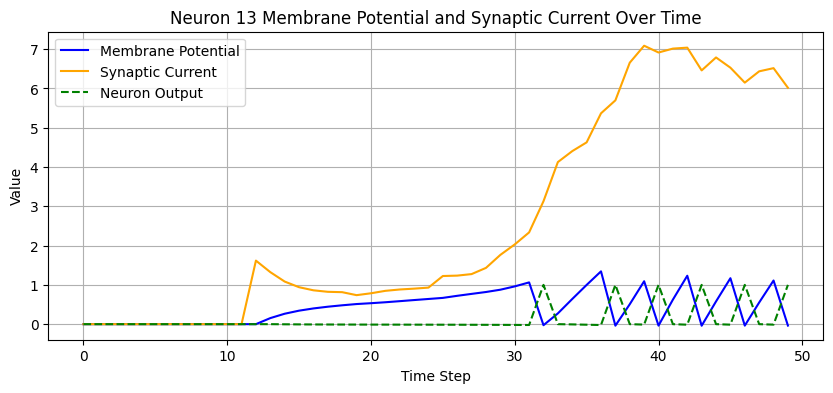

Neuron 14 is non-spiking.
Gamma value: 0.00651520537212491


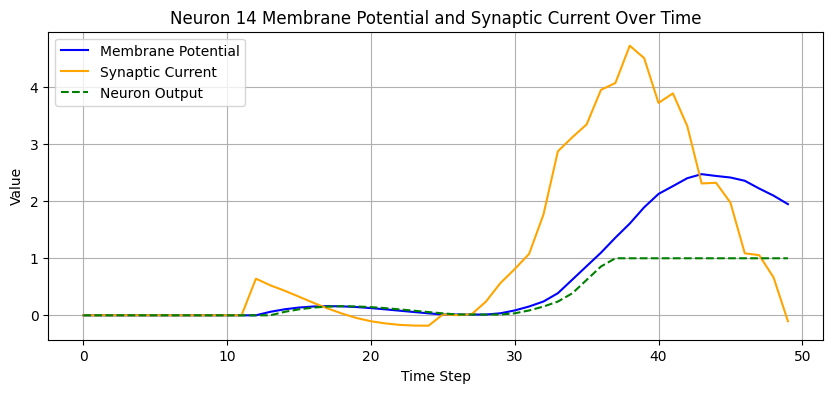

Neuron 15 is non-spiking.
Gamma value: 0.00022876582806929946


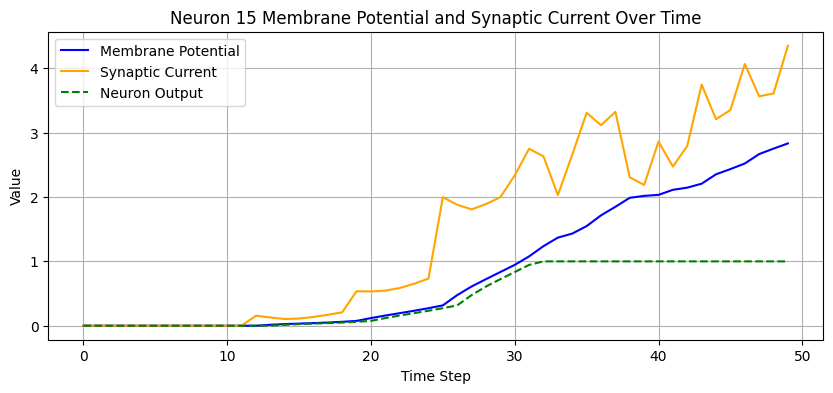

Neuron 16 is non-spiking.
Gamma value: -0.0002780890208669007


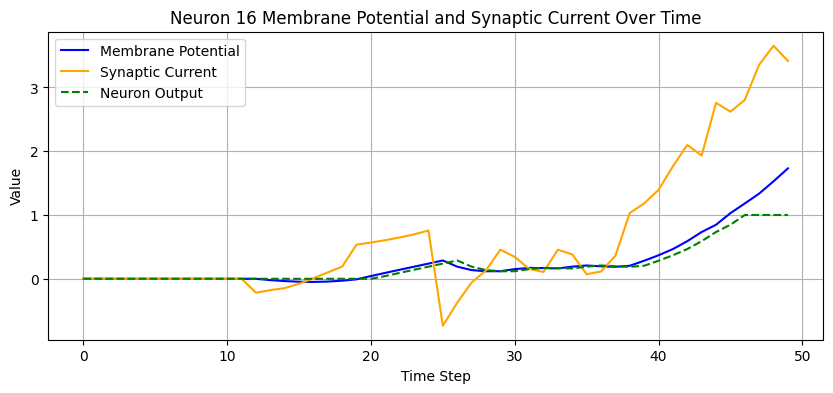

Neuron 17 is spiking.
Gamma value: 1.00388765335083


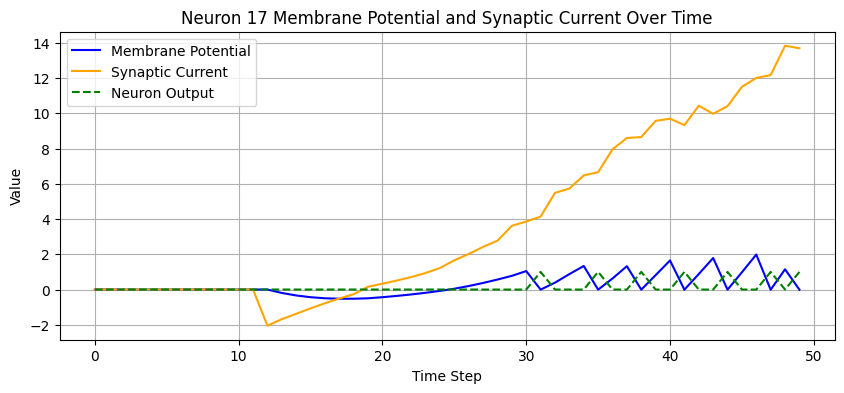

Neuron 18 is non-spiking.
Gamma value: -0.0012511627282947302


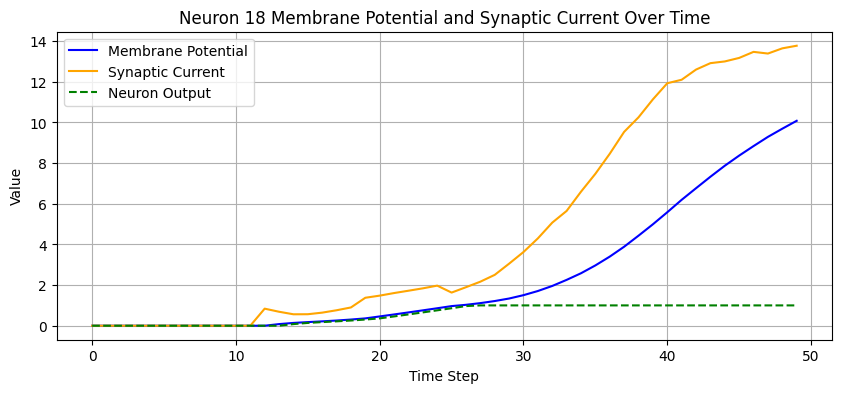

Neuron 19 is non-spiking.
Gamma value: -0.001916130306199193


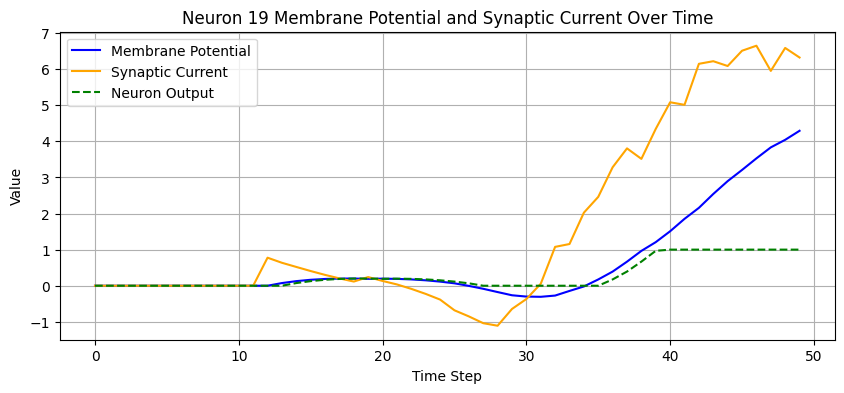

Seed: 4


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


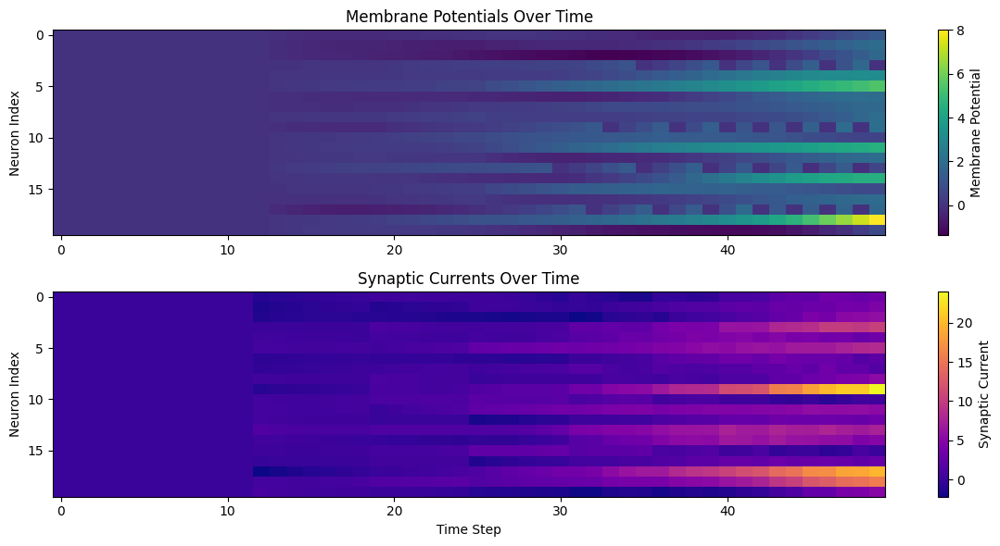

Neuron 0 is non-spiking.
Gamma value: 0.0020751224365085363


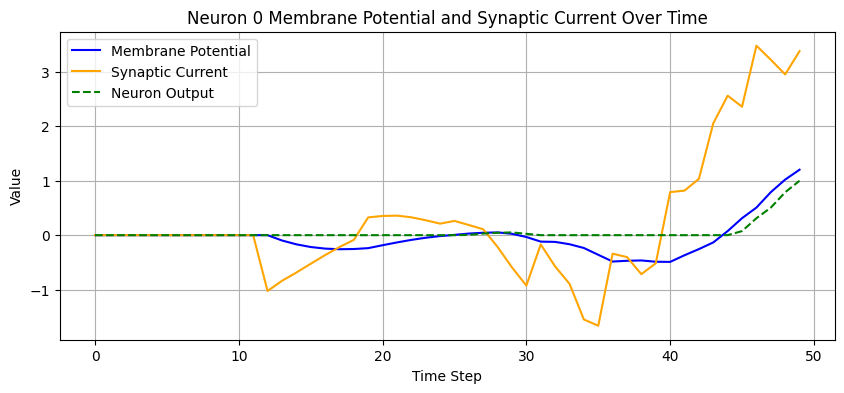

Neuron 1 is non-spiking.
Gamma value: -0.0032618562690913677


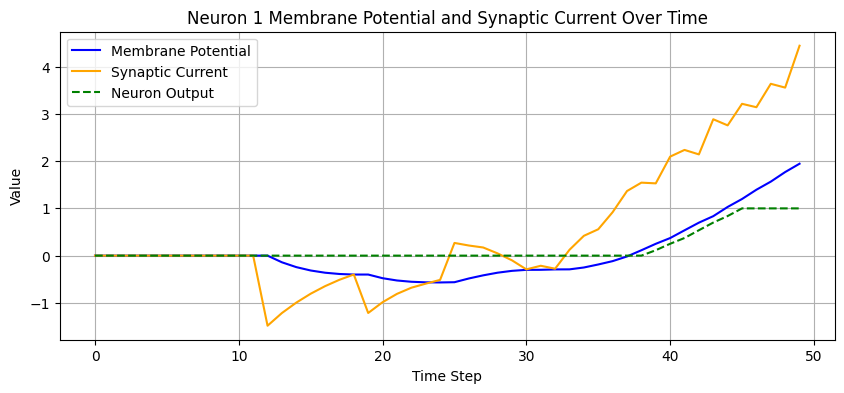

Neuron 2 is non-spiking.
Gamma value: -0.0038524167612195015


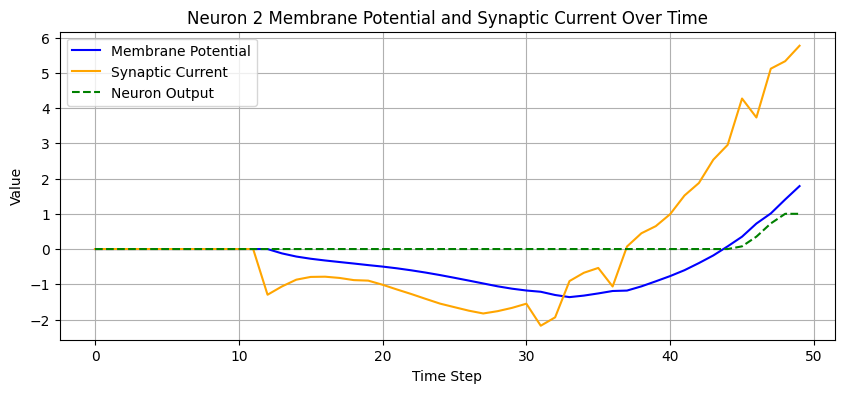

Neuron 3 is spiking.
Gamma value: 0.9997891783714294


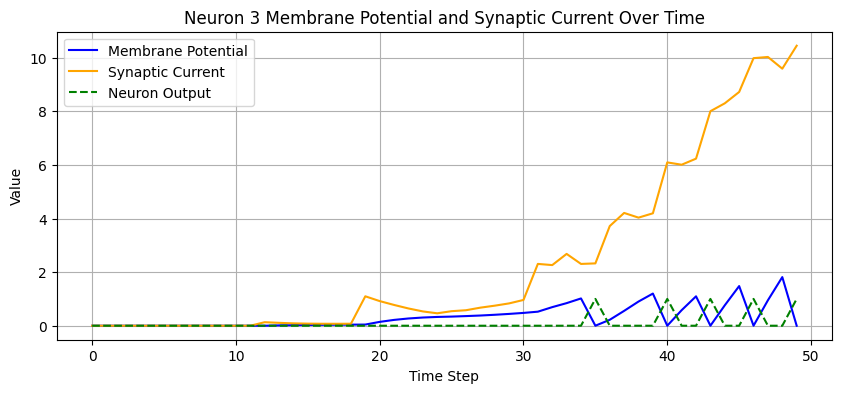

Neuron 4 is non-spiking.
Gamma value: 0.0023137719836086035


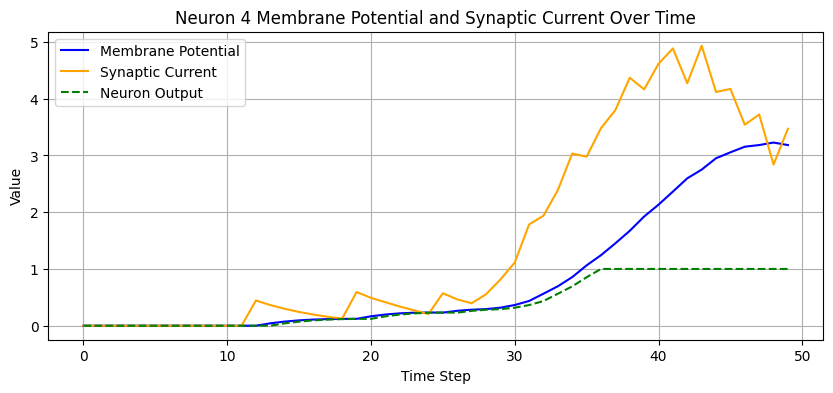

Neuron 5 is non-spiking.
Gamma value: -0.0012584495125338435


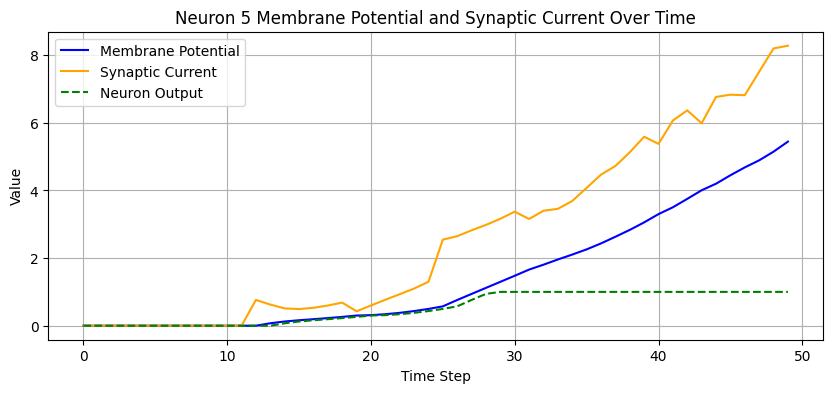

Neuron 6 is non-spiking.
Gamma value: 0.009420812129974365


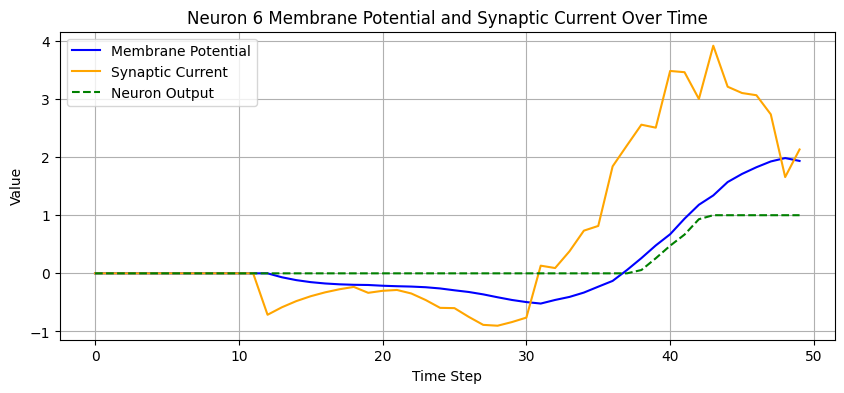

Neuron 7 is non-spiking.
Gamma value: 0.007472652476280928


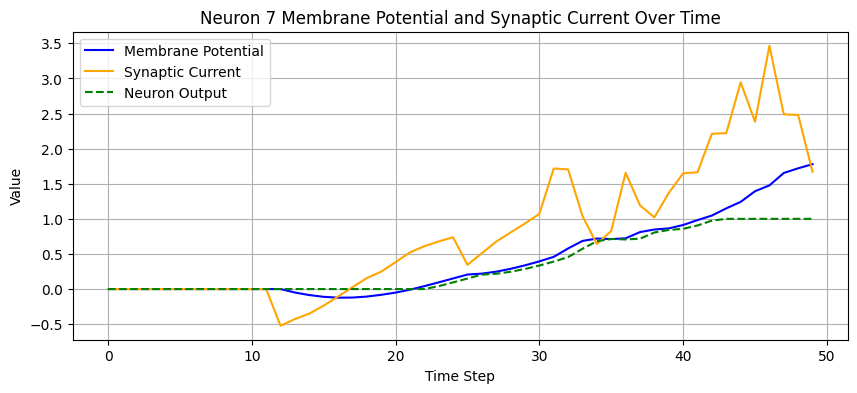

Neuron 8 is non-spiking.
Gamma value: -0.00012421044812072068


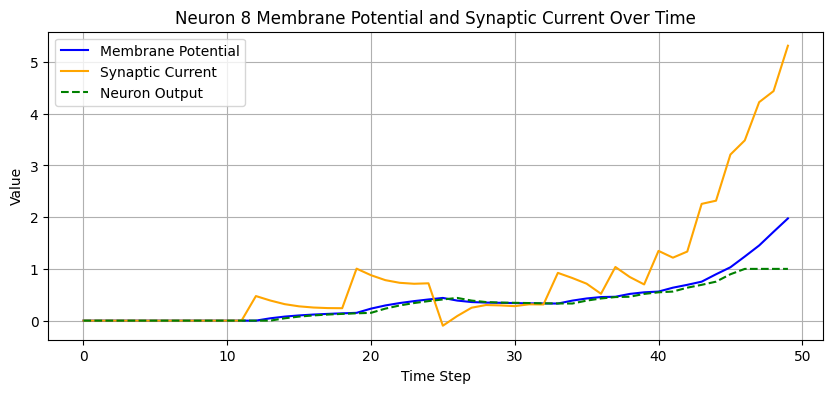

Neuron 9 is spiking.
Gamma value: 1.0010011196136475


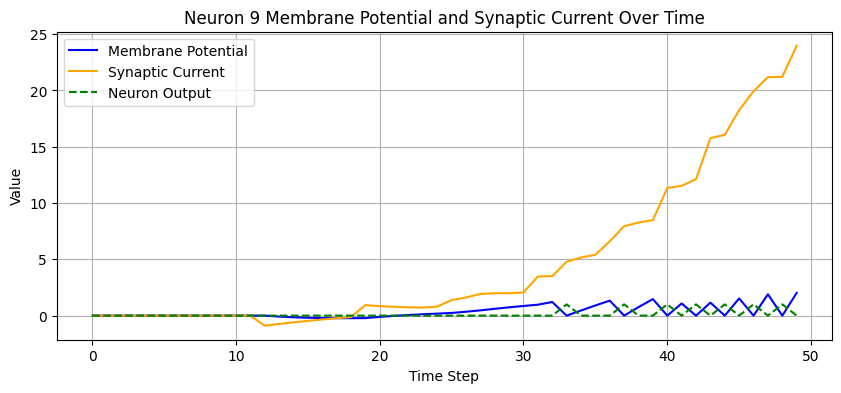

Neuron 10 is non-spiking.
Gamma value: -0.011974379420280457


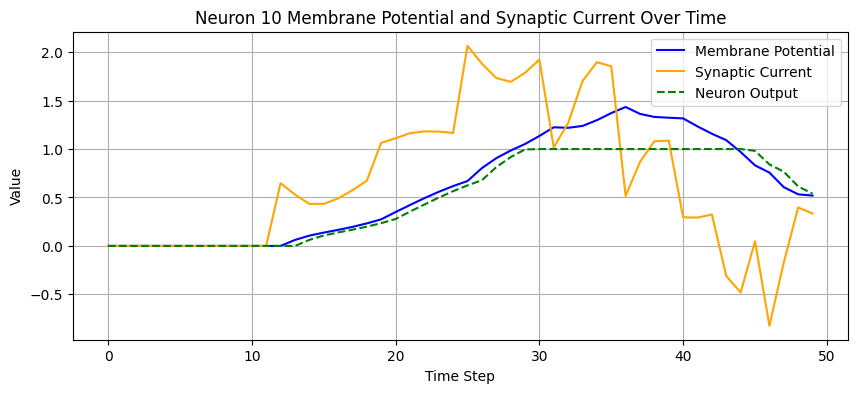

Neuron 11 is non-spiking.
Gamma value: -0.004117465578019619


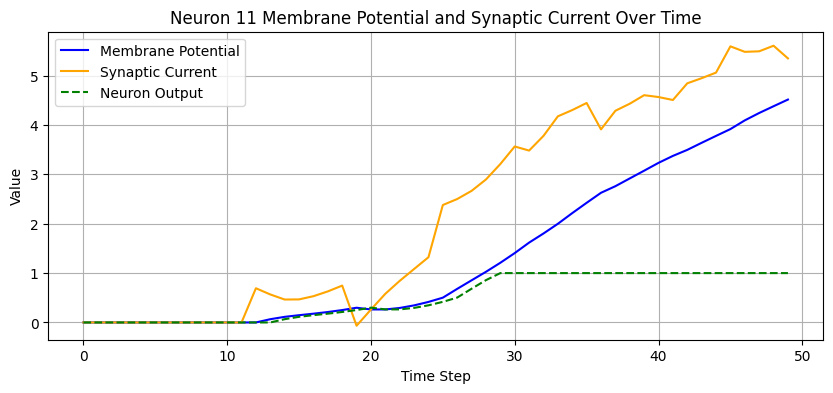

Neuron 12 is non-spiking.
Gamma value: 0.0037593941669911146


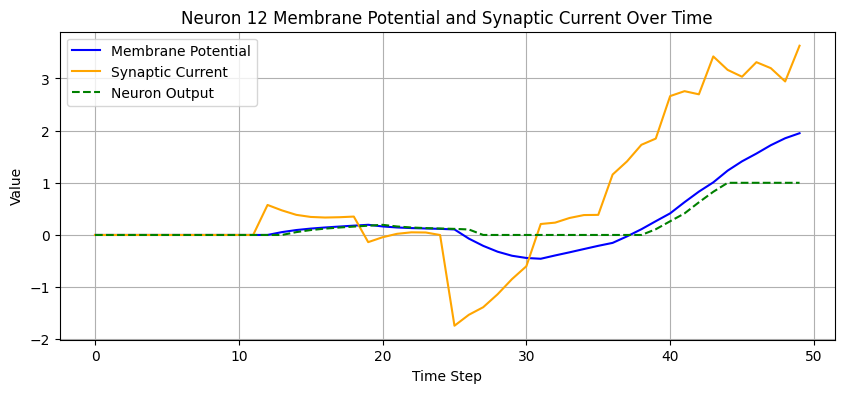

Neuron 13 is spiking.
Gamma value: 1.0329020023345947


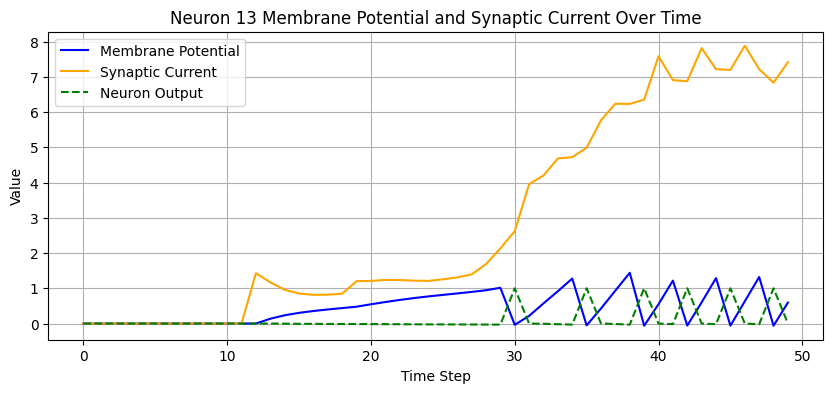

Neuron 14 is non-spiking.
Gamma value: -0.0010474694427102804


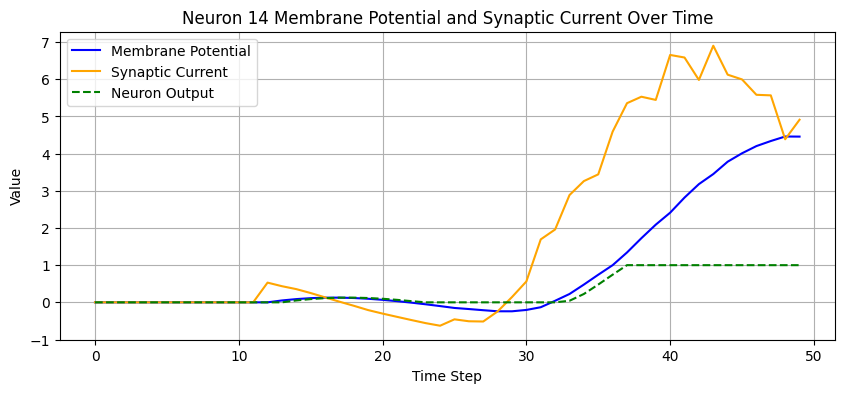

Neuron 15 is non-spiking.
Gamma value: -0.010187903419137001


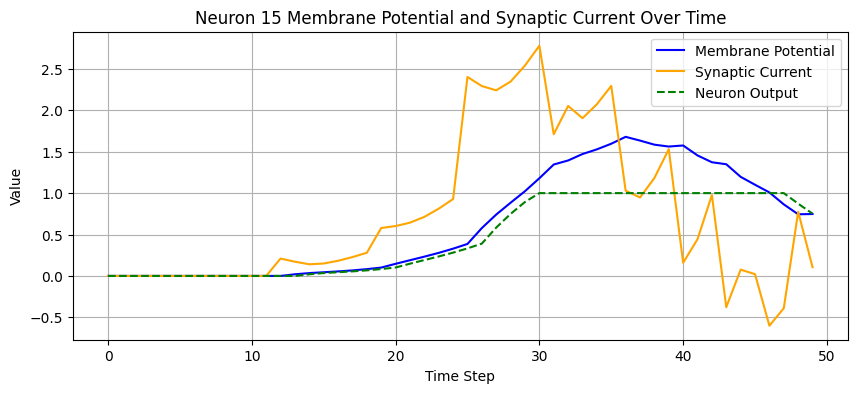

Neuron 16 is non-spiking.
Gamma value: 0.0037156755570322275


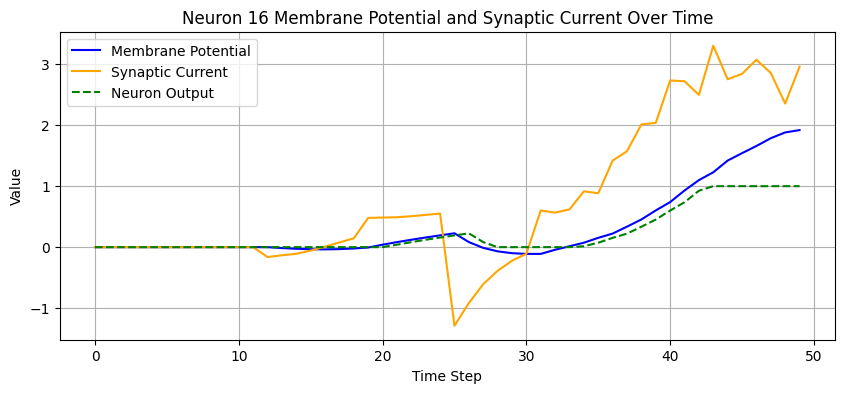

Neuron 17 is spiking.
Gamma value: 0.9972892999649048


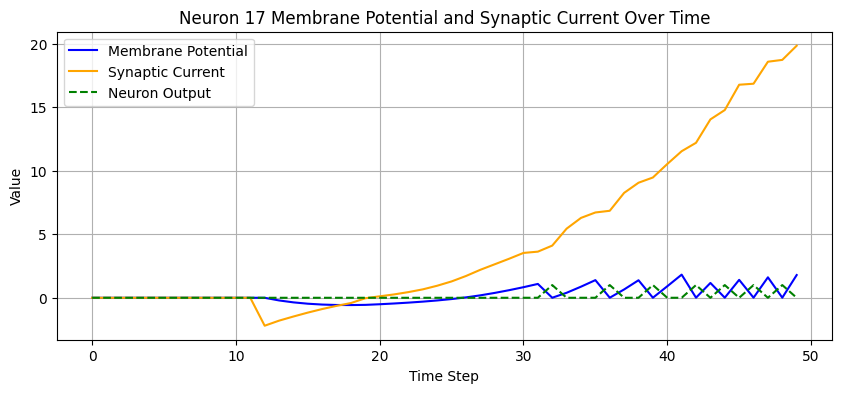

Neuron 18 is non-spiking.
Gamma value: -0.0001392840495100245


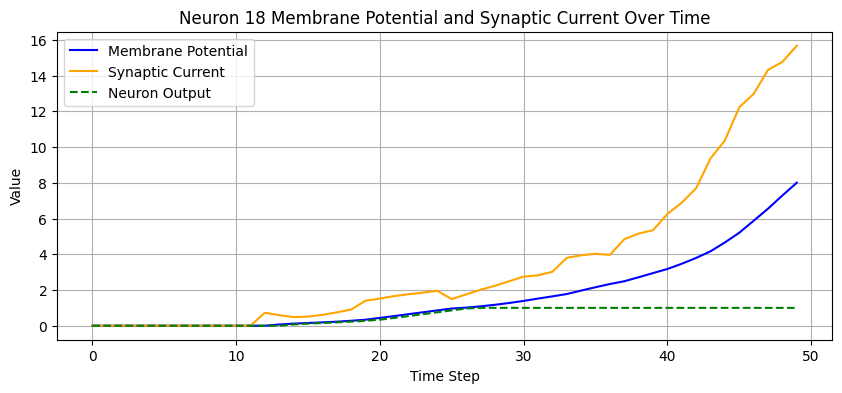

Neuron 19 is non-spiking.
Gamma value: 0.0010306260082870722


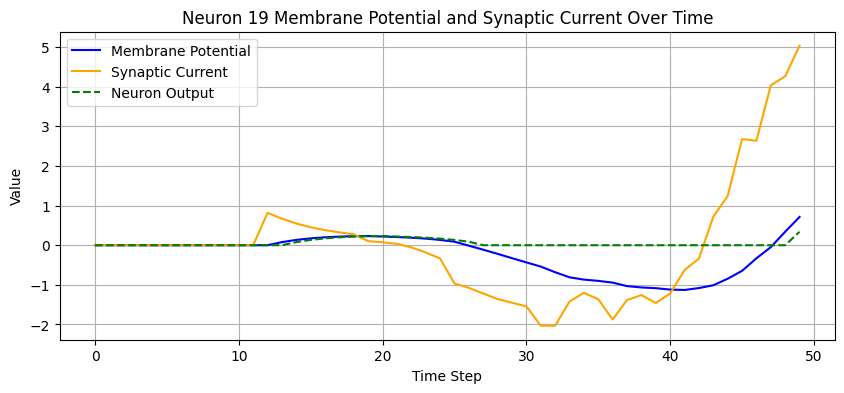

Seed: 5


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


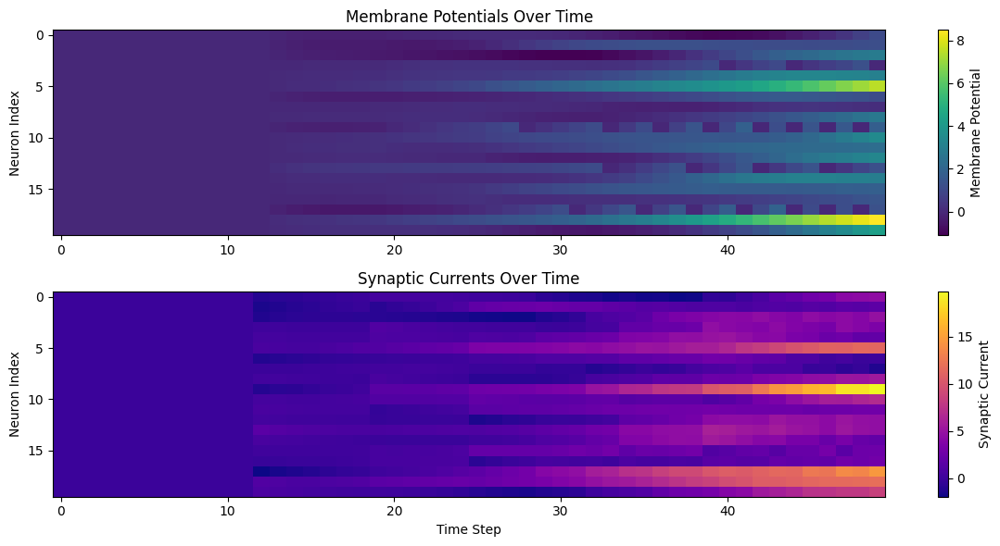

Neuron 0 is non-spiking.
Gamma value: 0.0010258083930239081


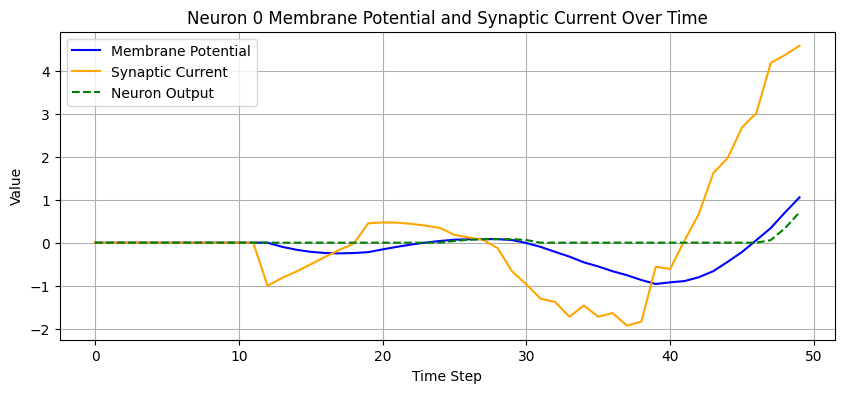

Neuron 1 is non-spiking.
Gamma value: -0.0007741572335362434


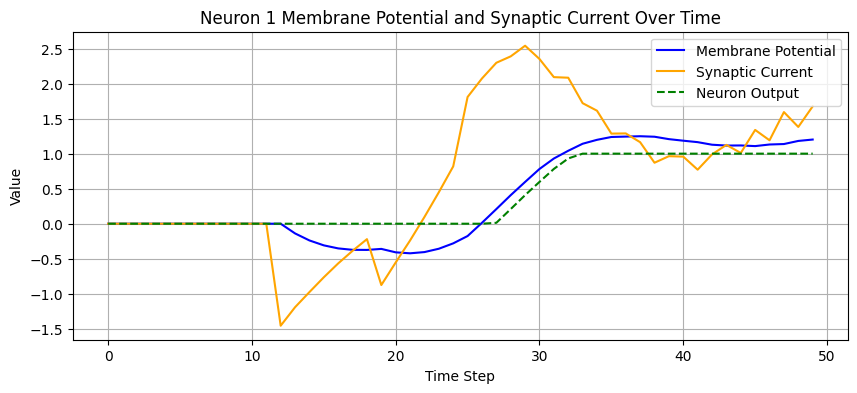

Neuron 2 is non-spiking.
Gamma value: -0.0033769002184271812


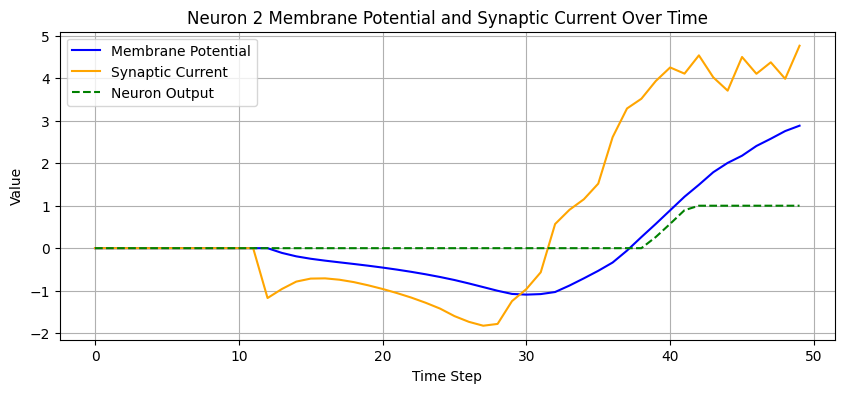

Neuron 3 is spiking.
Gamma value: 0.9899737238883972


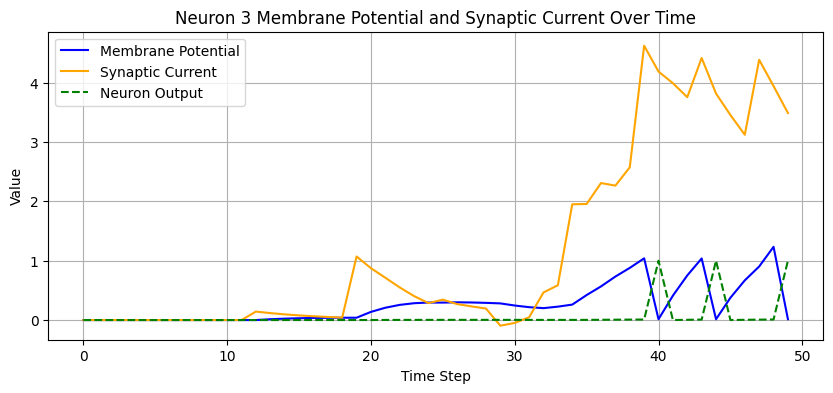

Neuron 4 is non-spiking.
Gamma value: -0.0033493232913315296


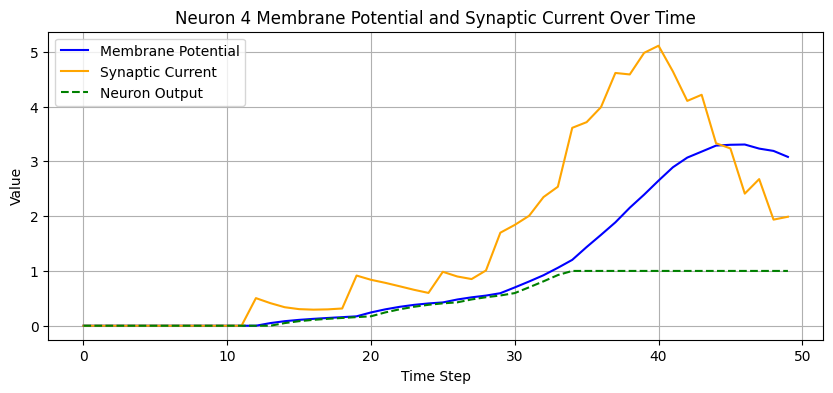

Neuron 5 is non-spiking.
Gamma value: -0.0016906679375097156


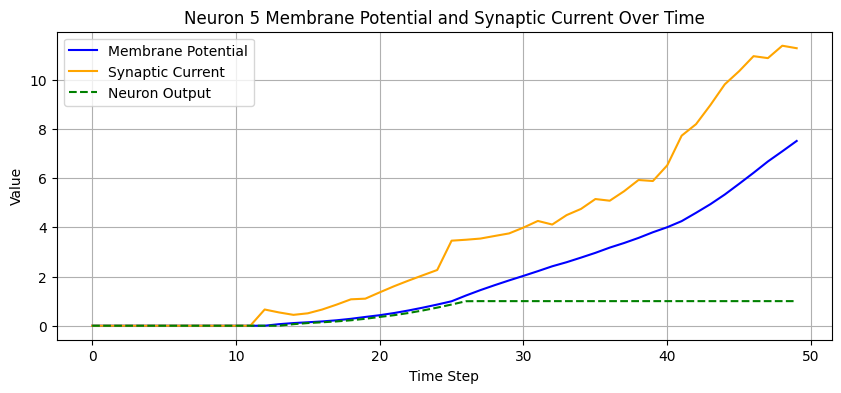

Neuron 6 is non-spiking.
Gamma value: -0.0006165018421597779


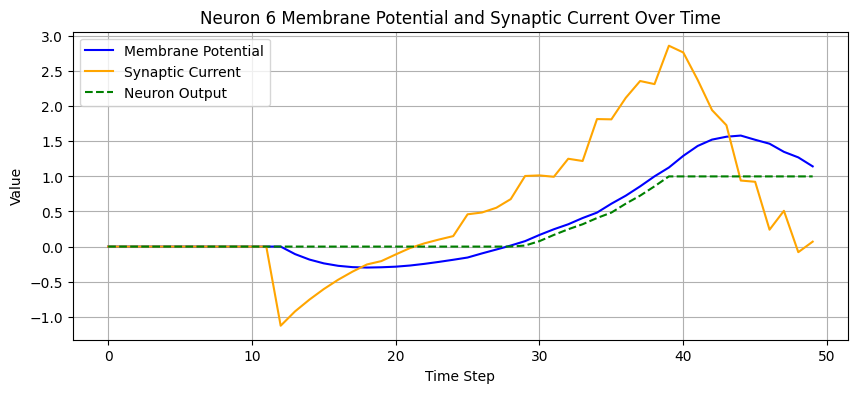

Neuron 7 is non-spiking.
Gamma value: -0.0010327072814106941


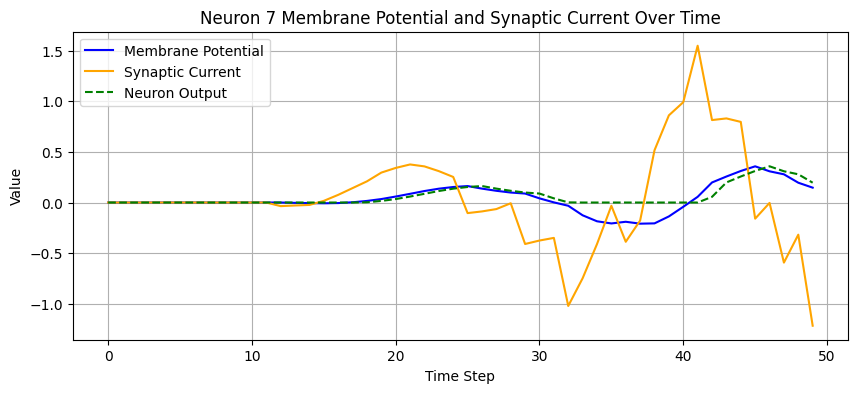

Neuron 8 is non-spiking.
Gamma value: 0.0012574848951771855


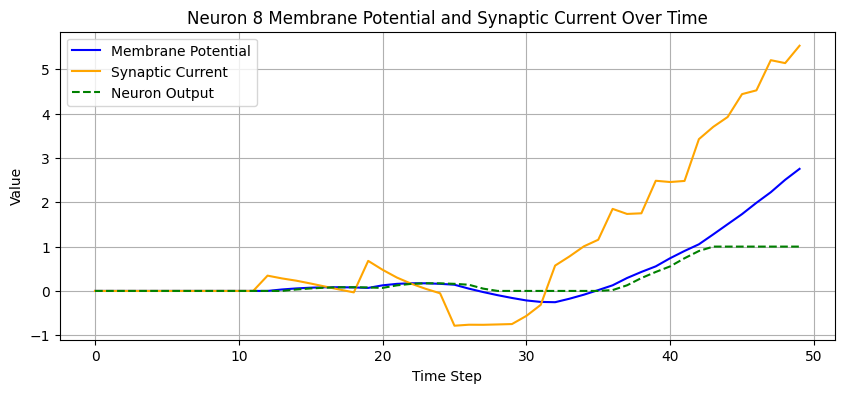

Neuron 9 is spiking.
Gamma value: 1.0061990022659302


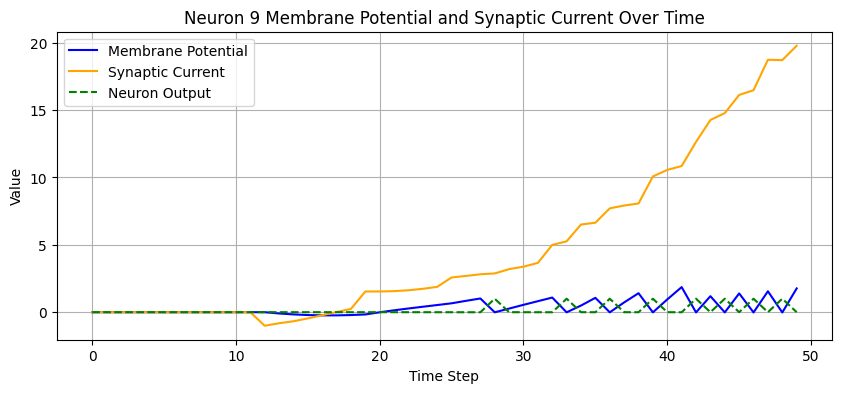

Neuron 10 is non-spiking.
Gamma value: -0.01151374913752079


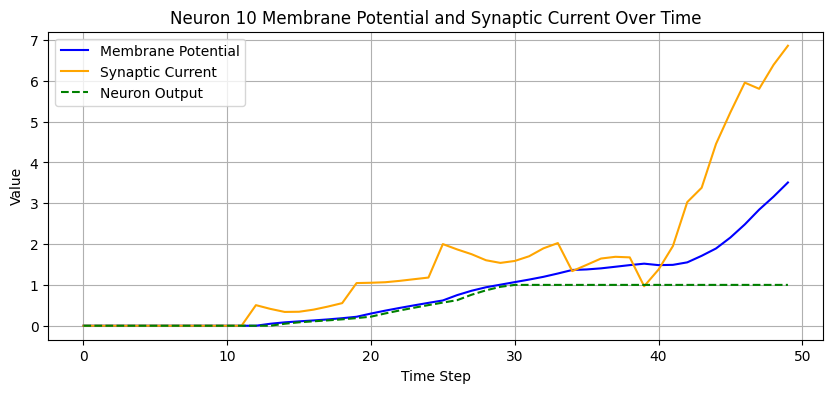

Neuron 11 is non-spiking.
Gamma value: -0.0017967830644920468


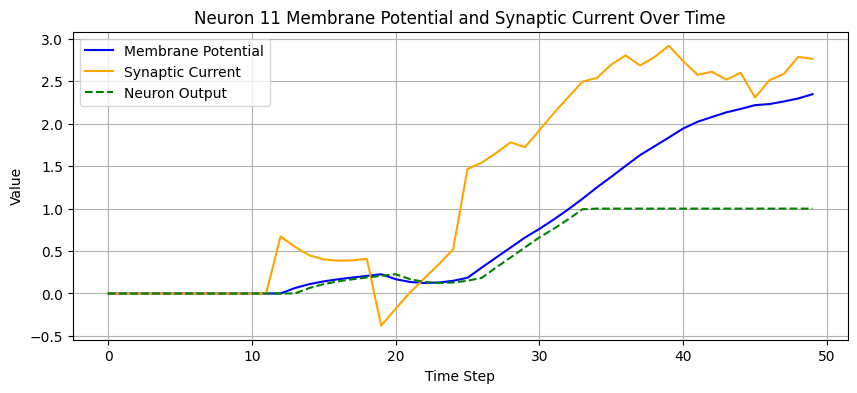

Neuron 12 is non-spiking.
Gamma value: -0.0017512582708150148


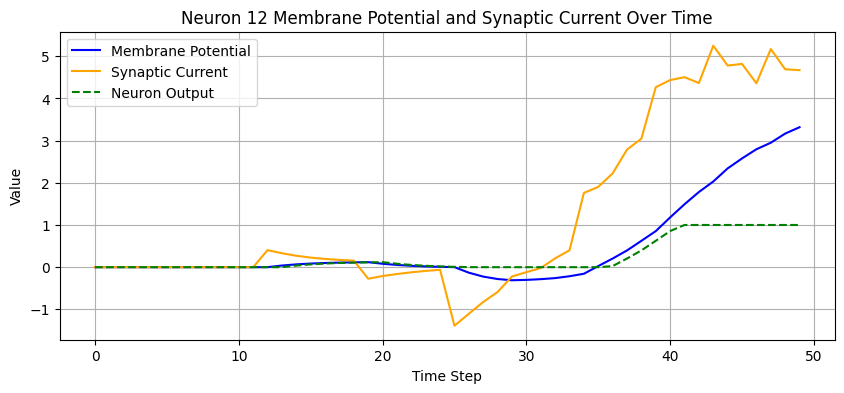

Neuron 13 is spiking.
Gamma value: 1.0186344385147095


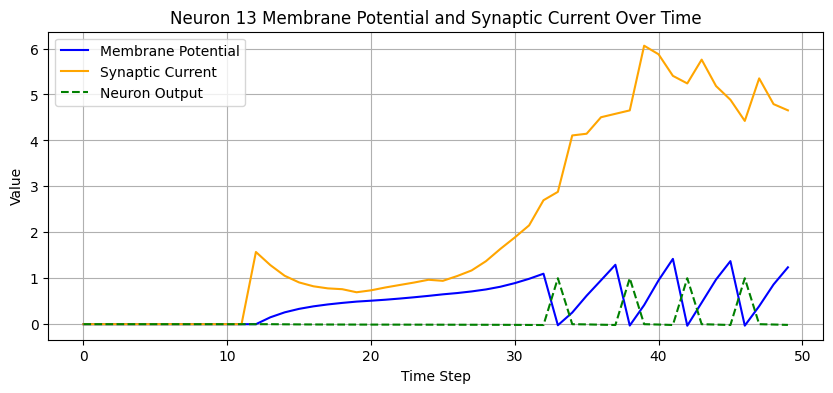

Neuron 14 is non-spiking.
Gamma value: 0.00038438619230873883


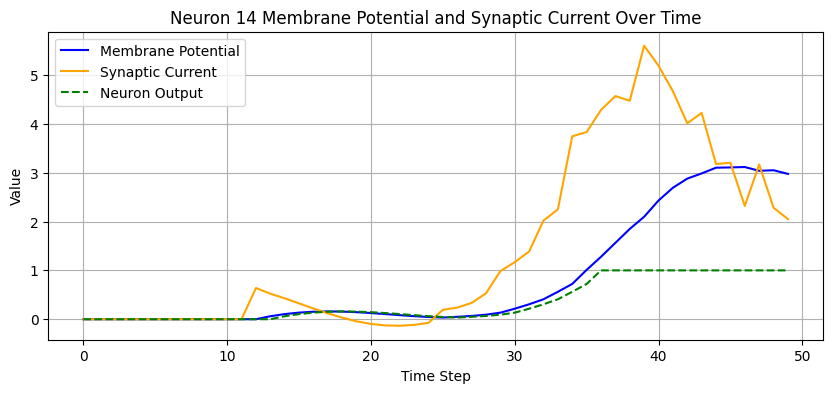

Neuron 15 is non-spiking.
Gamma value: 0.012519190087914467


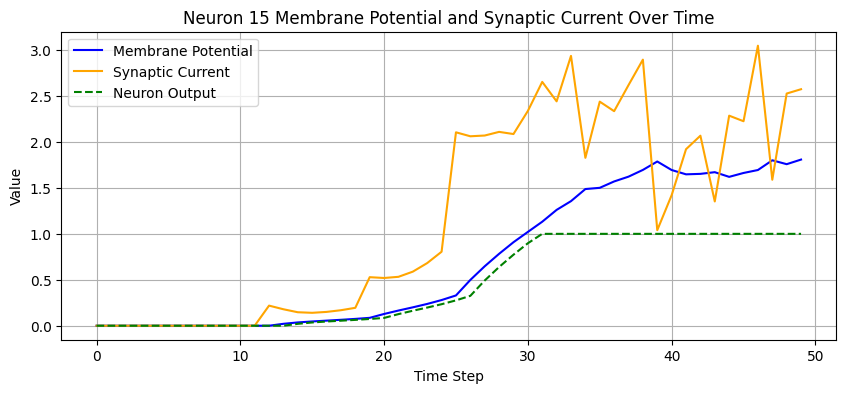

Neuron 16 is non-spiking.
Gamma value: 0.0007680867565795779


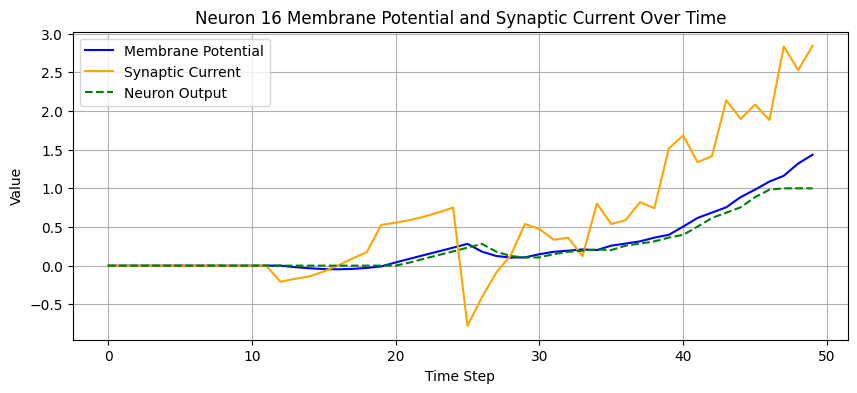

Neuron 17 is spiking.
Gamma value: 1.0007654428482056


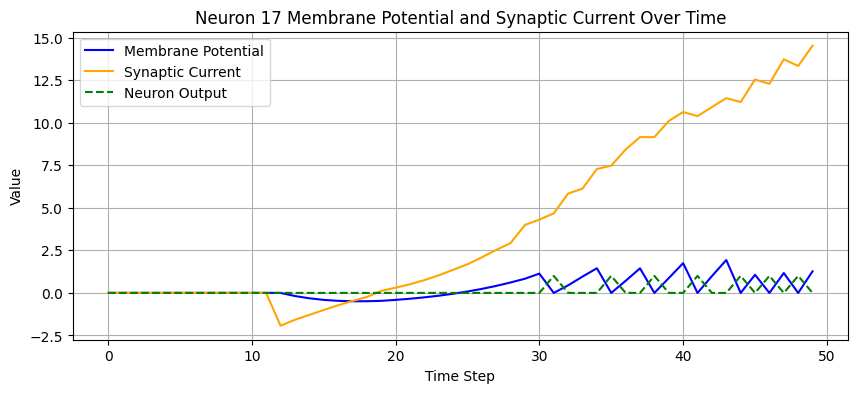

Neuron 18 is non-spiking.
Gamma value: -0.0003430914075579494


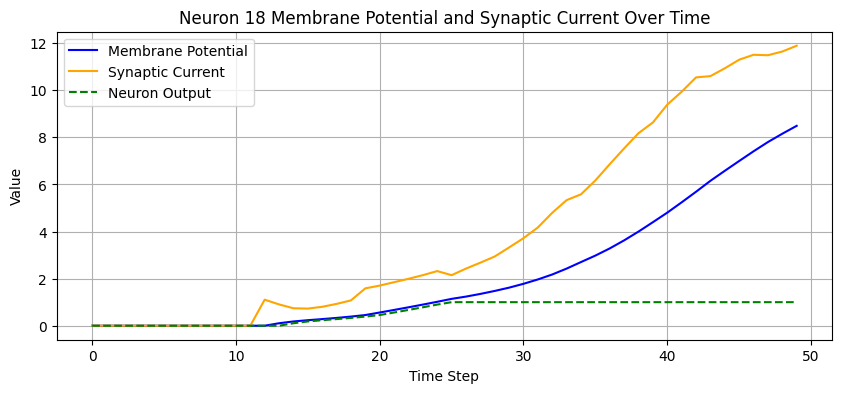

Neuron 19 is non-spiking.
Gamma value: -0.003375635016709566


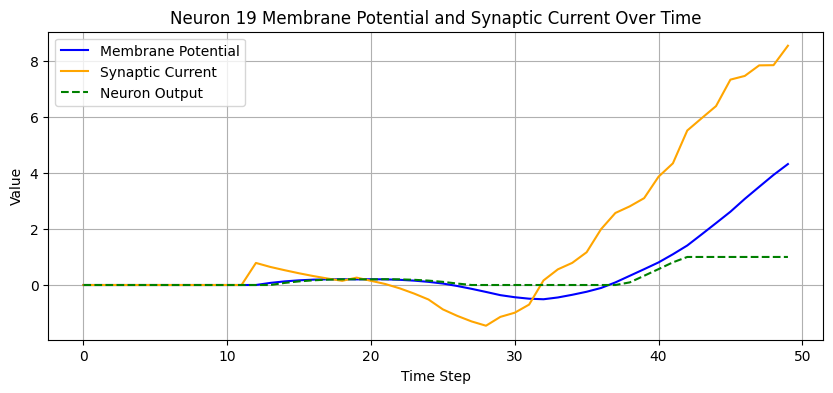

In [4]:
for seed in range(1,6):
    print(f"Seed: {seed}")
    path = f"/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/20_hidden/1.0_pct_data/None_percent_snn/rand_gamma_init/gamma_fixed_False/reset_nsn_False/best_model_of_study.ckpt"
    model = load_model("Hybrid_NSN_SNN_V1_Flexible_Spiking", path)
    weights = return_weights(model)
    gamma_param = weights["gamma_param"]
    auxiliary_outputs, hidden_out_t = get_membrane_potentials(model, test_loader)
    membrane_potentials = auxiliary_outputs['membrane_potentials']
    synaptic_currents = auxiliary_outputs['synaptic_currents']
    graph_membrane_potentials_and_synaptic_currents(membrane_potentials.cpu().detach().numpy(), synaptic_currents.cpu().detach().numpy(), example_idx=0)
    neuron_idx = 0
    for neuron_idx in range(membrane_potentials.shape[2]):
        if gamma_param[neuron_idx] > 0.5:
            print(f"Neuron {neuron_idx} is spiking.")
        else:
            print(f"Neuron {neuron_idx} is non-spiking.")
        print(f"Gamma value: {gamma_param[neuron_idx].item()}")
        single_mem_and_syn_potential(membrane_potentials.cpu().detach().numpy(), synaptic_currents.cpu().detach().numpy(), hidden_out_t.cpu().detach().numpy(), neuron_idx, example_idx=0)
    # Identify if the neuron is spiking or nonspiking using gamma


Seed: 1


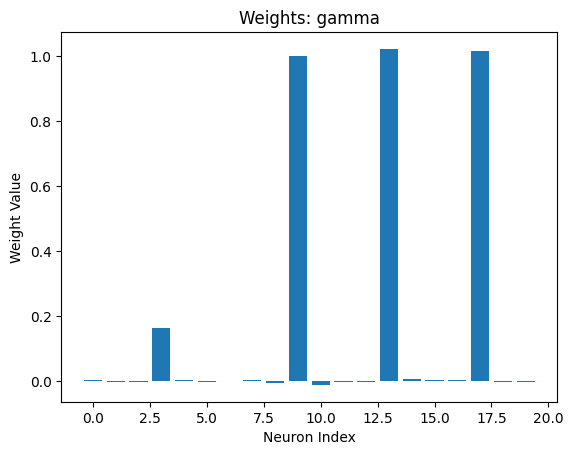

Testing: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Accuracy before binarizing gamma: 1.0


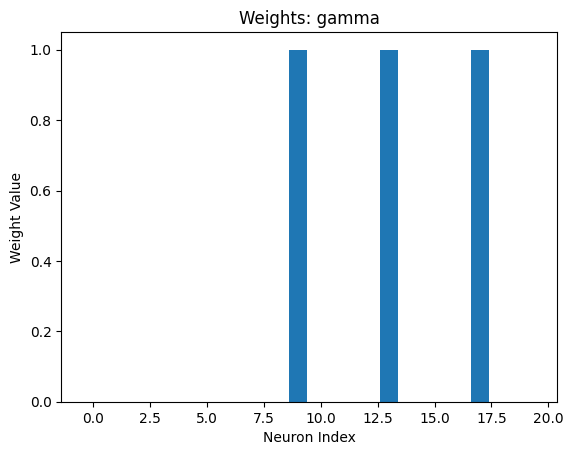

Testing: 100%|██████████| 1/1 [00:00<00:00, 26.62it/s]


Accuracy after binarizing gamma: 0.9900000095367432


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


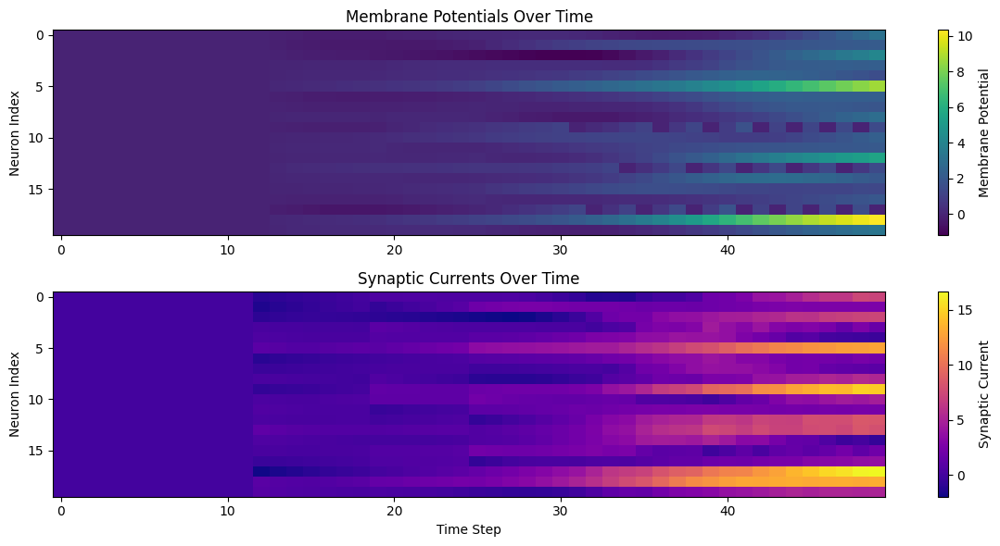

Neuron 0 is non-spiking.
Gamma value: 0.0


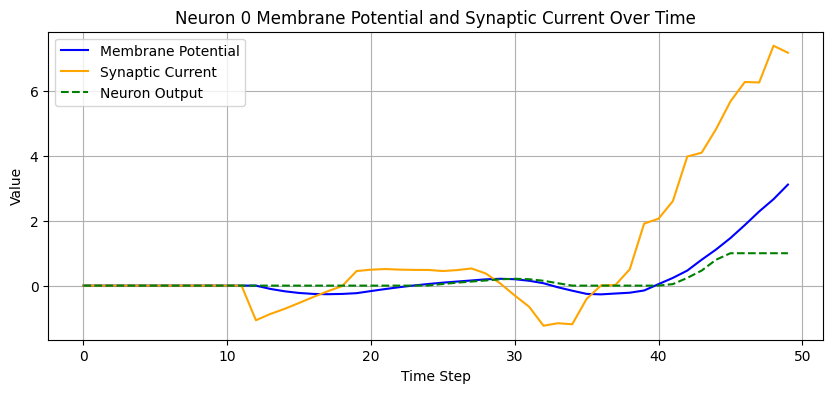

Neuron 1 is non-spiking.
Gamma value: 0.0


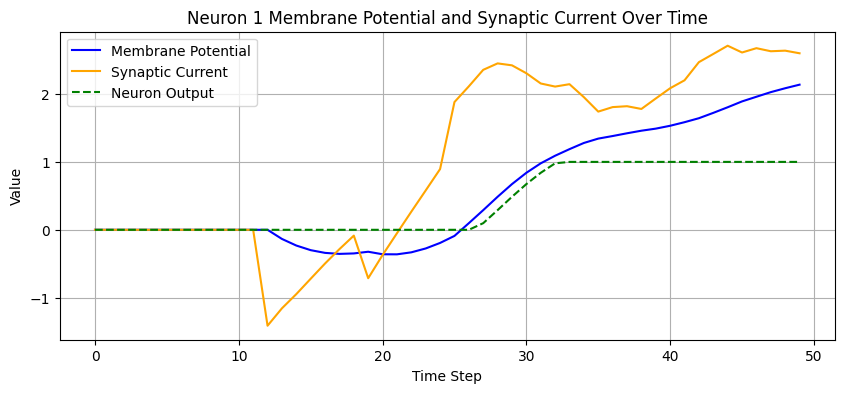

Neuron 2 is non-spiking.
Gamma value: 0.0


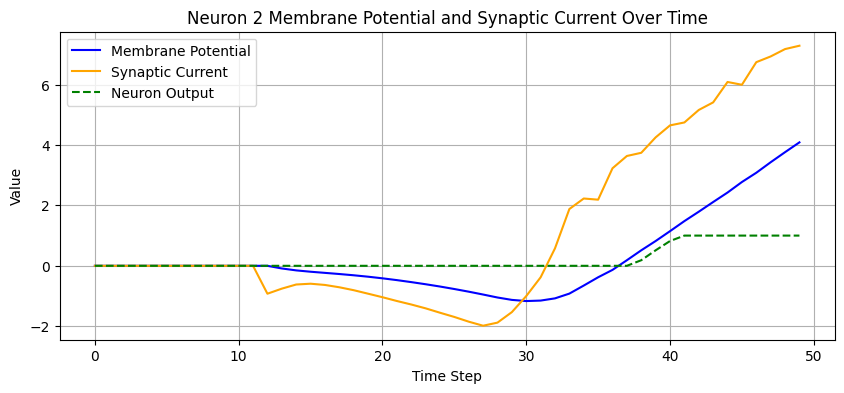

Neuron 3 is non-spiking.
Gamma value: 0.0


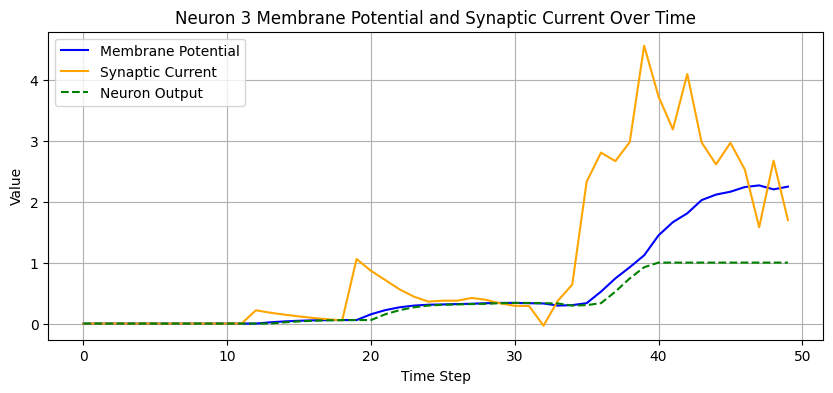

Neuron 4 is non-spiking.
Gamma value: 0.0


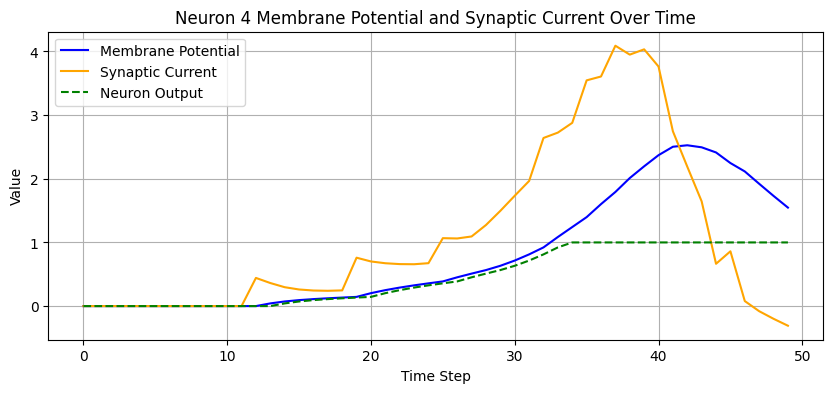

Neuron 5 is non-spiking.
Gamma value: 0.0


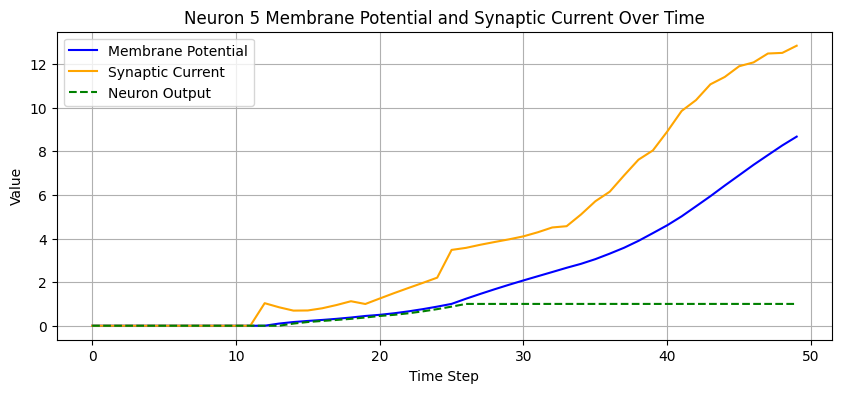

Neuron 6 is non-spiking.
Gamma value: 0.0


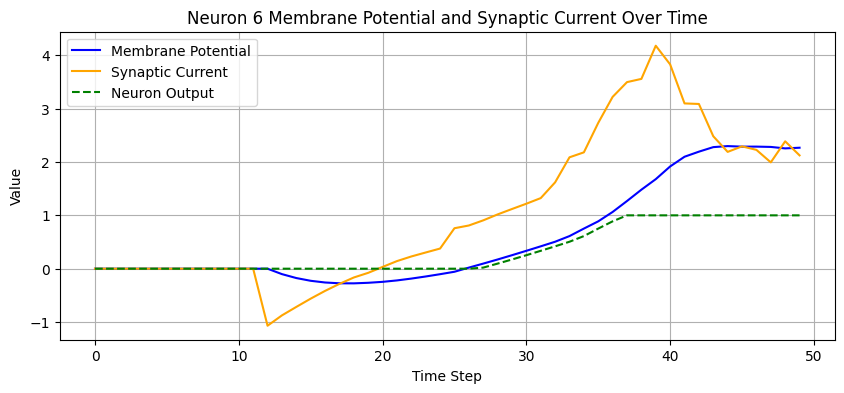

Neuron 7 is non-spiking.
Gamma value: 0.0


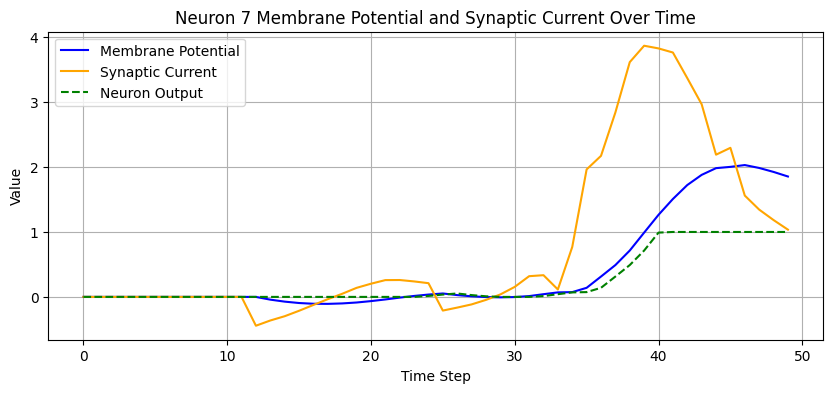

Neuron 8 is non-spiking.
Gamma value: 0.0


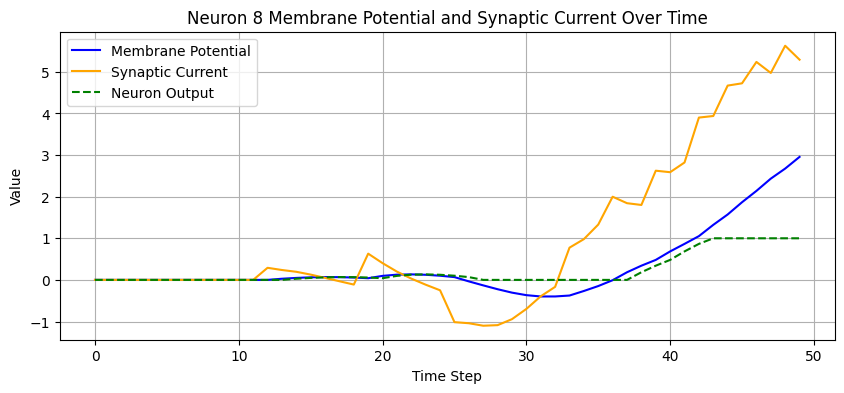

Neuron 9 is spiking.
Gamma value: 1.0


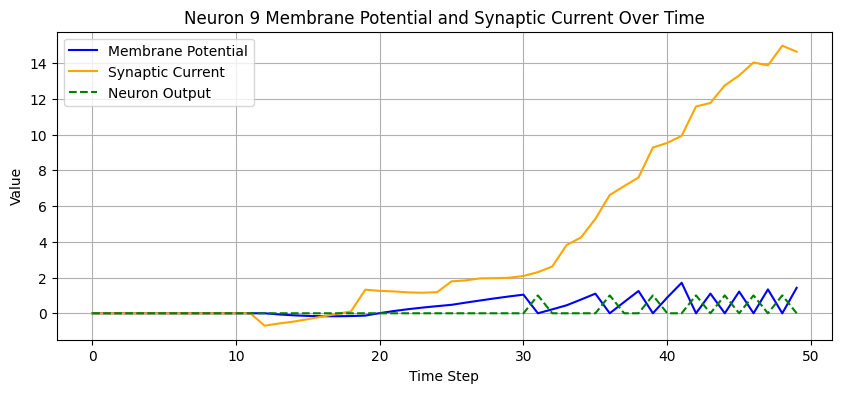

Neuron 10 is non-spiking.
Gamma value: 0.0


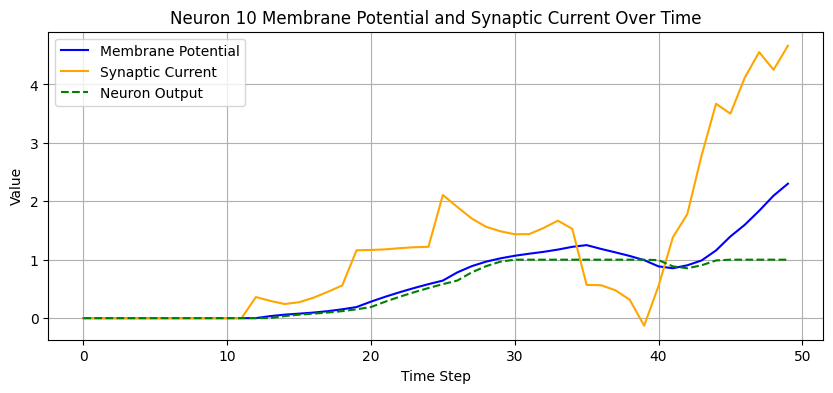

Neuron 11 is non-spiking.
Gamma value: 0.0


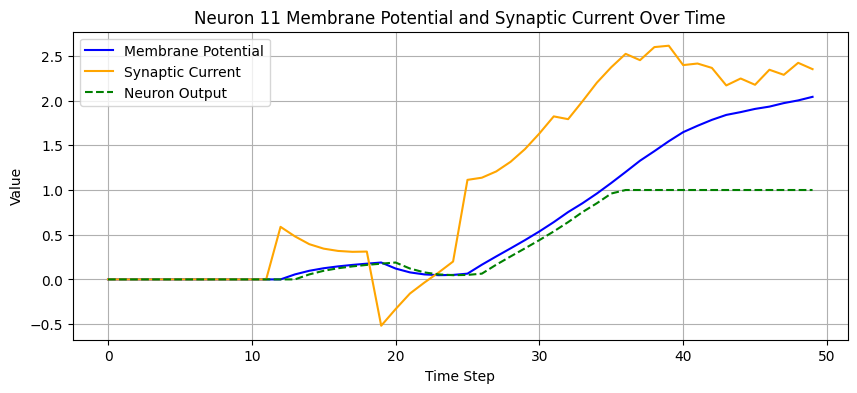

Neuron 12 is non-spiking.
Gamma value: 0.0


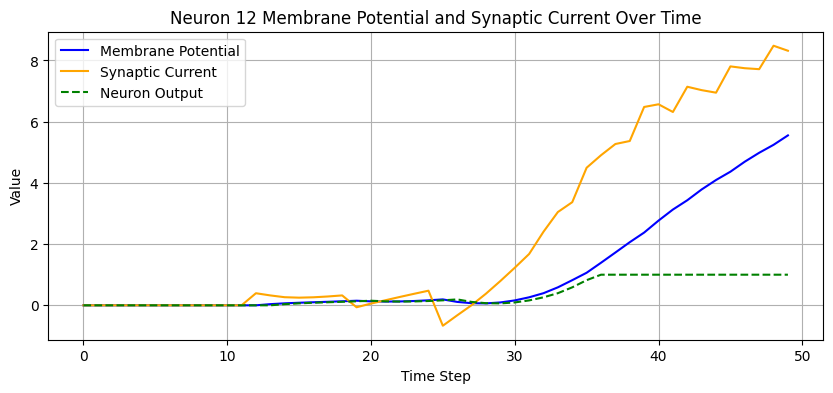

Neuron 13 is spiking.
Gamma value: 1.0


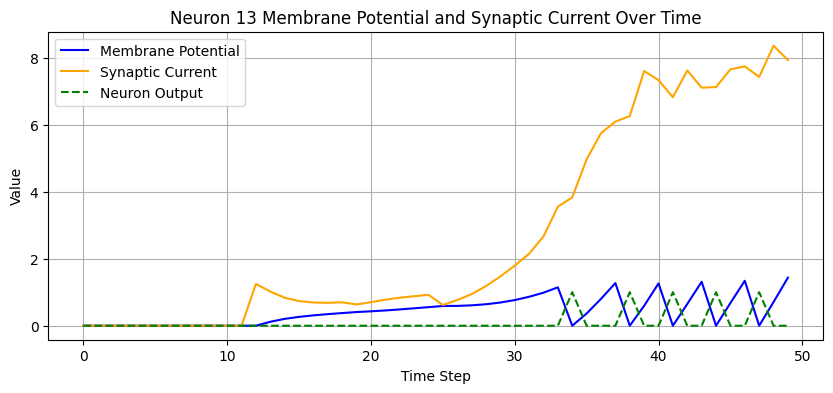

Neuron 14 is non-spiking.
Gamma value: 0.0


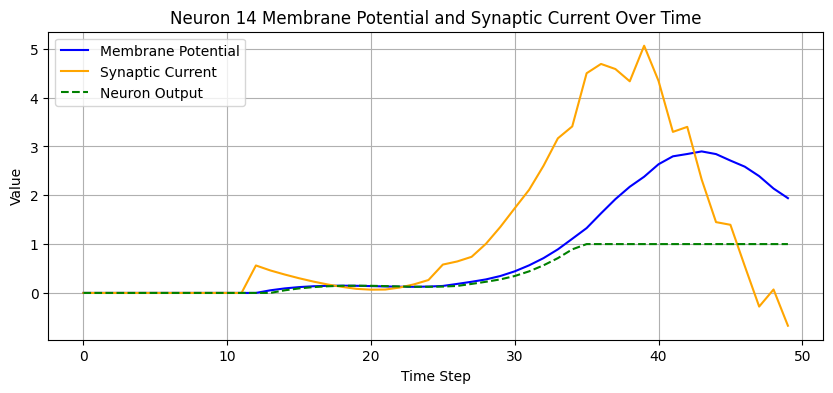

Neuron 15 is non-spiking.
Gamma value: 0.0


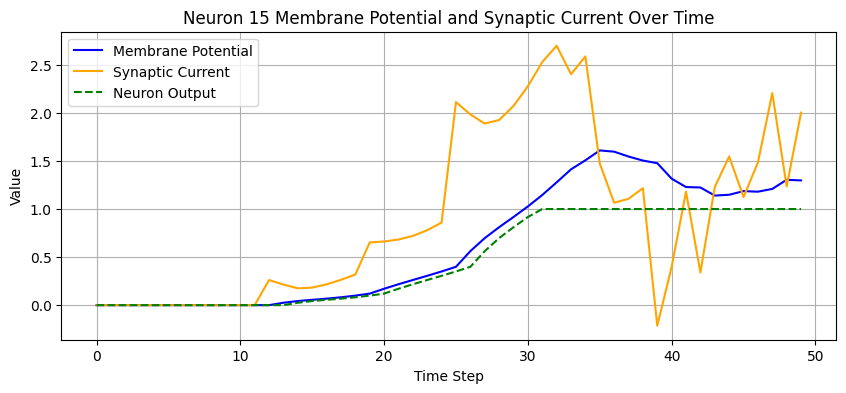

Neuron 16 is non-spiking.
Gamma value: 0.0


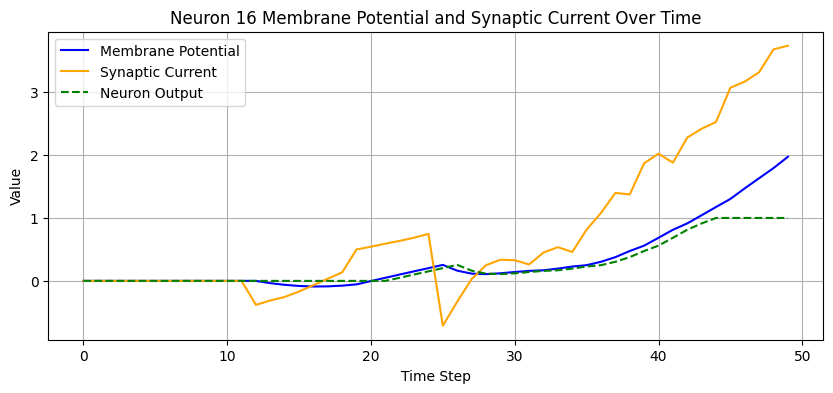

Neuron 17 is spiking.
Gamma value: 1.0


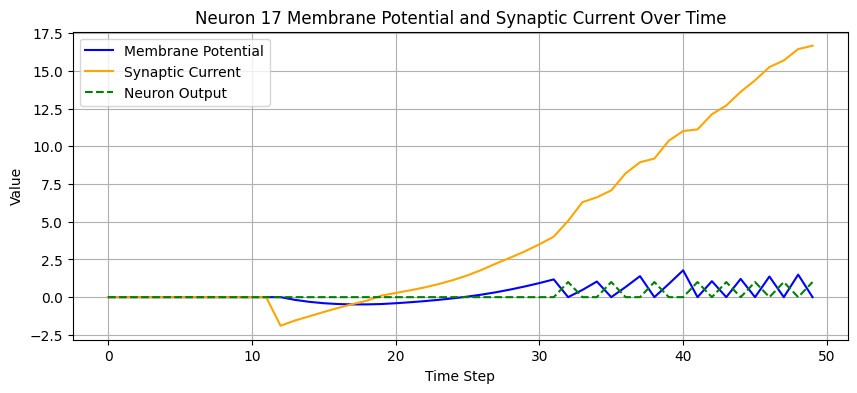

Neuron 18 is non-spiking.
Gamma value: 0.0


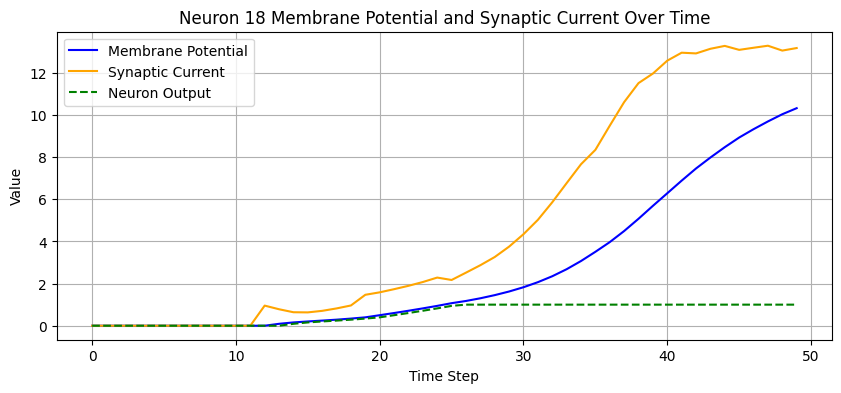

Neuron 19 is non-spiking.
Gamma value: 0.0


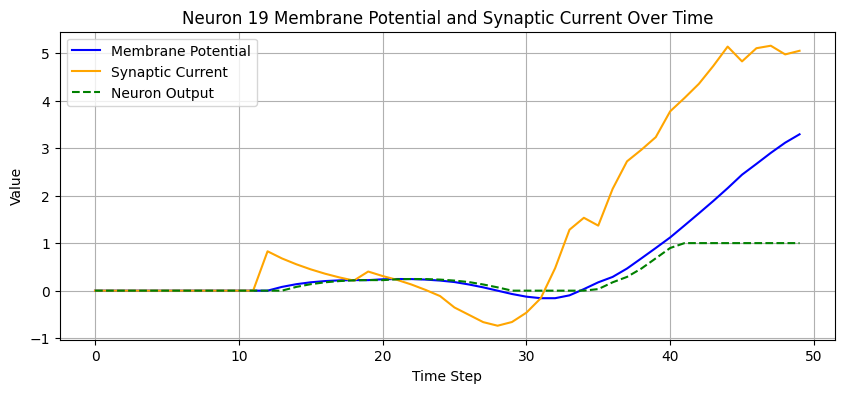

Seed: 2


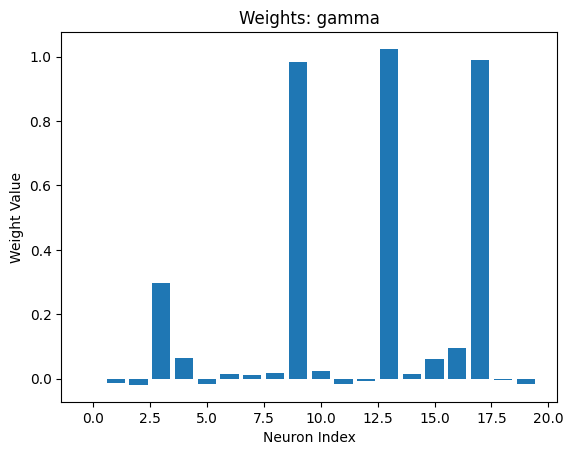

Testing: 100%|██████████| 1/1 [00:00<00:00, 21.92it/s]


Accuracy before binarizing gamma: 1.0


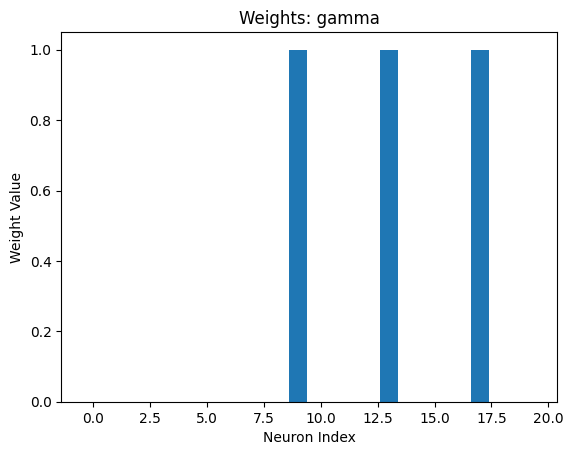

Testing: 100%|██████████| 1/1 [00:00<00:00, 25.15it/s]


Accuracy after binarizing gamma: 0.8475000262260437


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


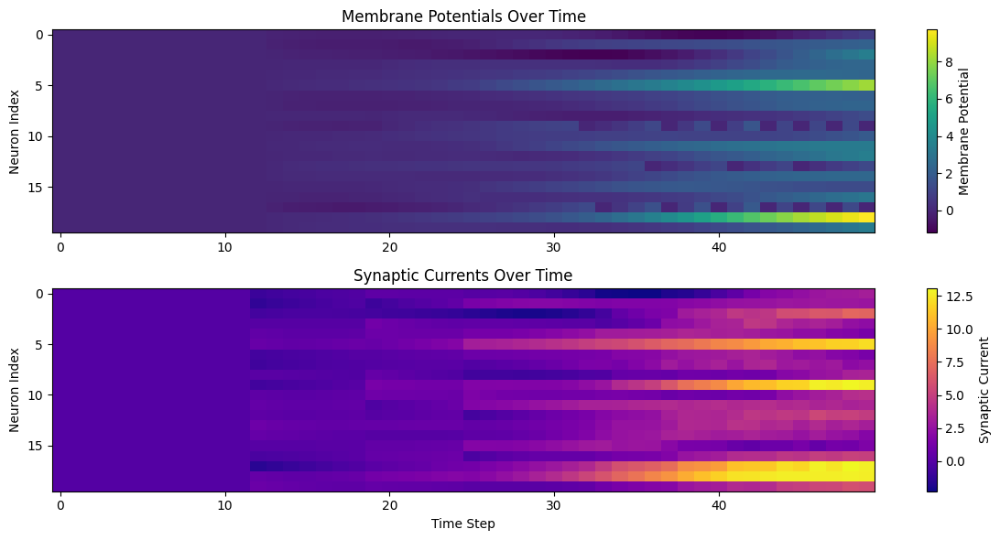

Neuron 0 is non-spiking.
Gamma value: 0.0


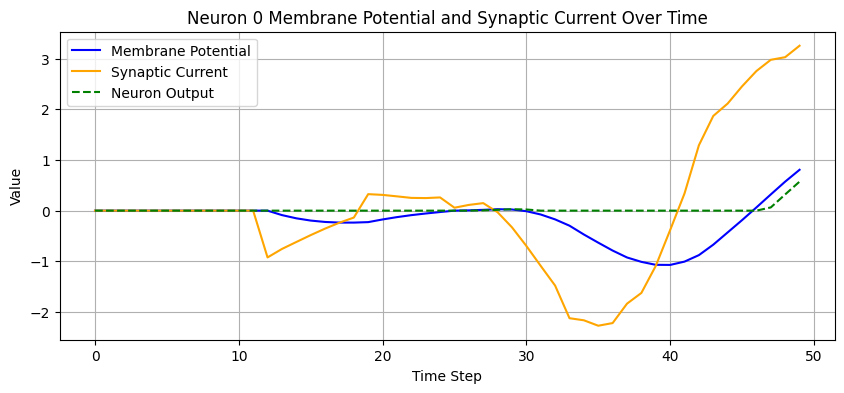

Neuron 1 is non-spiking.
Gamma value: 0.0


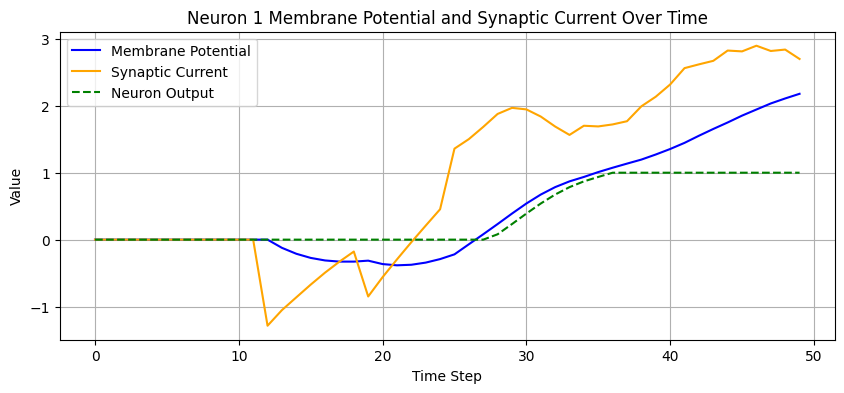

Neuron 2 is non-spiking.
Gamma value: 0.0


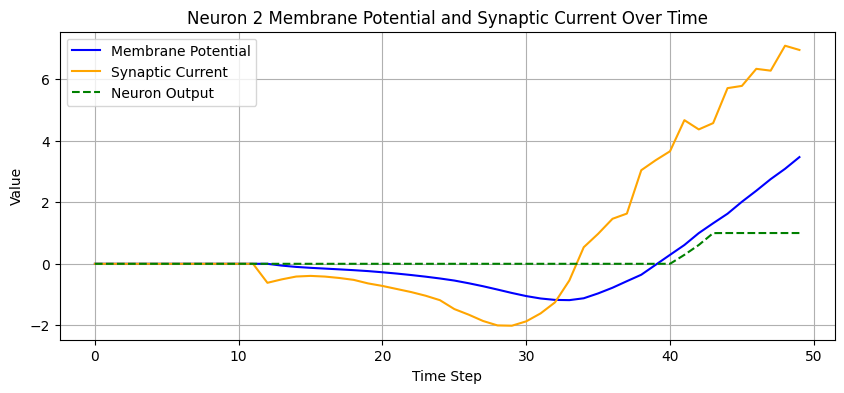

Neuron 3 is non-spiking.
Gamma value: 0.0


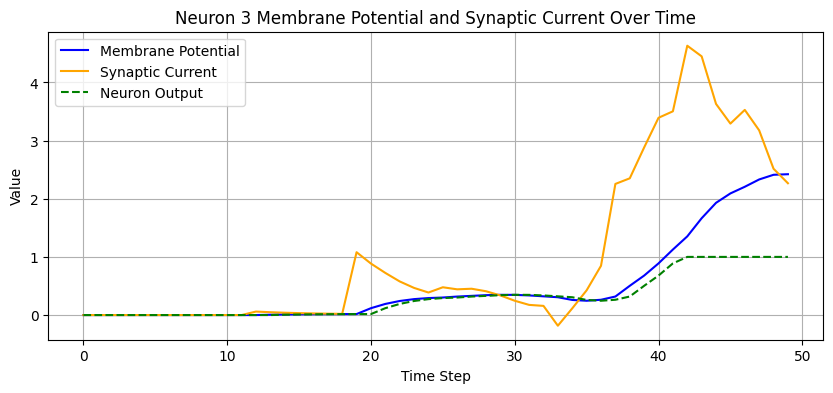

Neuron 4 is non-spiking.
Gamma value: 0.0


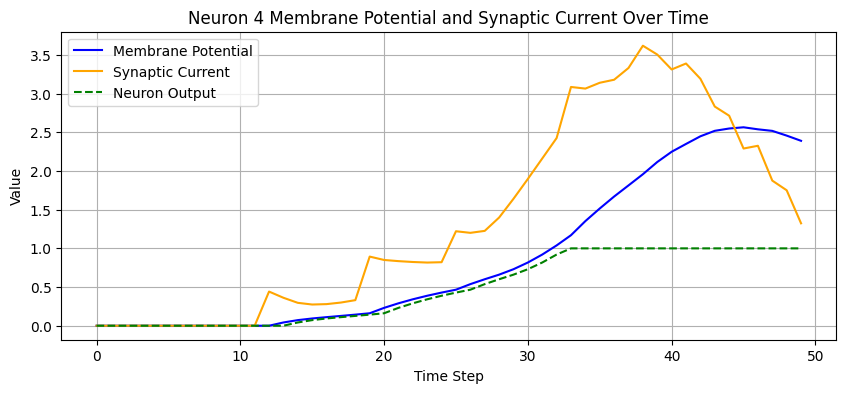

Neuron 5 is non-spiking.
Gamma value: 0.0


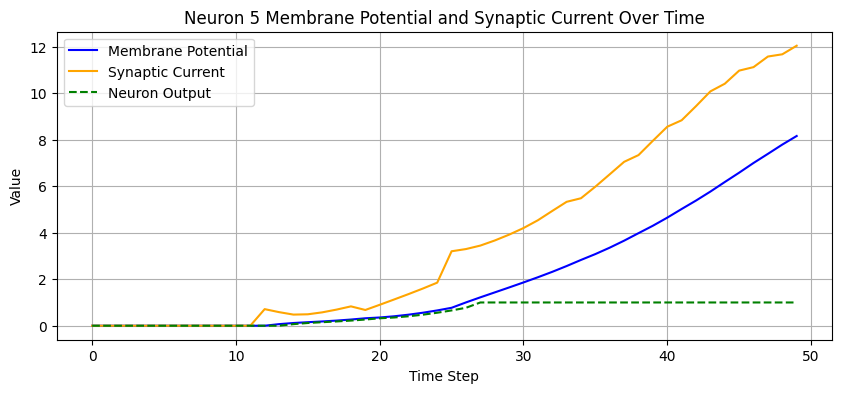

Neuron 6 is non-spiking.
Gamma value: 0.0


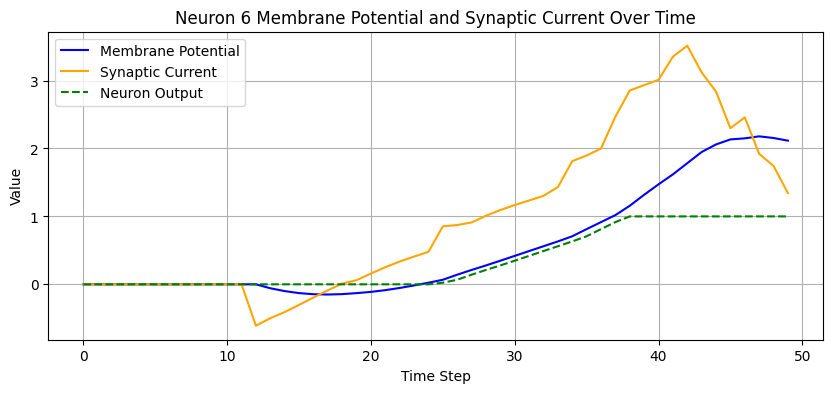

Neuron 7 is non-spiking.
Gamma value: 0.0


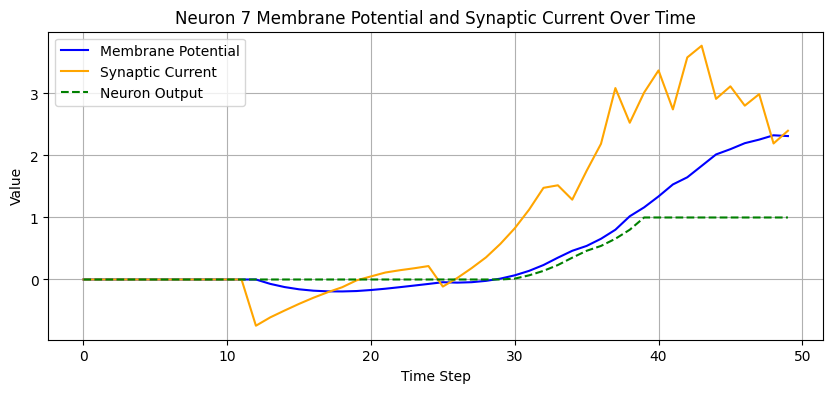

Neuron 8 is non-spiking.
Gamma value: 0.0


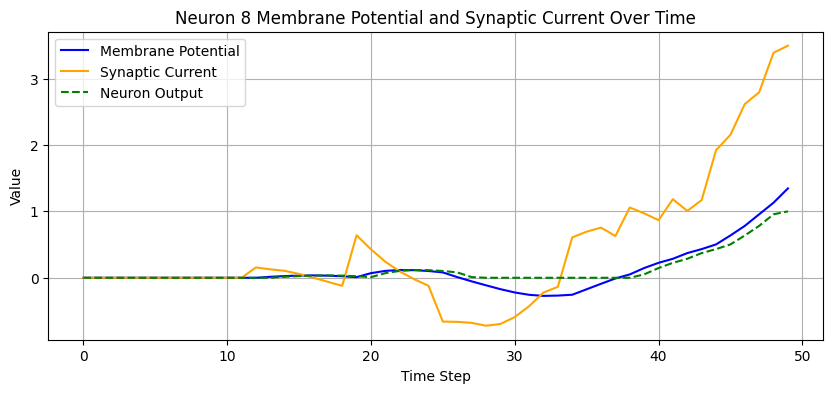

Neuron 9 is spiking.
Gamma value: 1.0


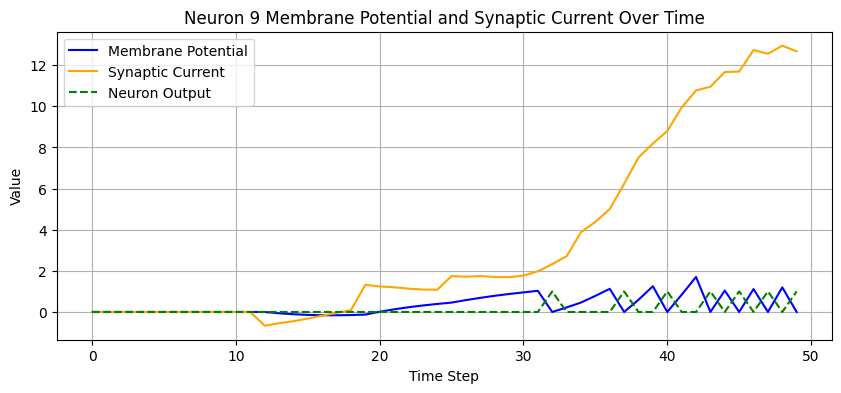

Neuron 10 is non-spiking.
Gamma value: 0.0


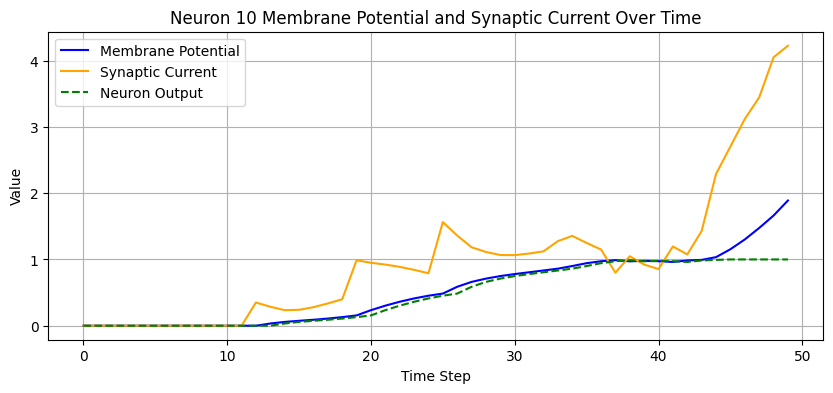

Neuron 11 is non-spiking.
Gamma value: 0.0


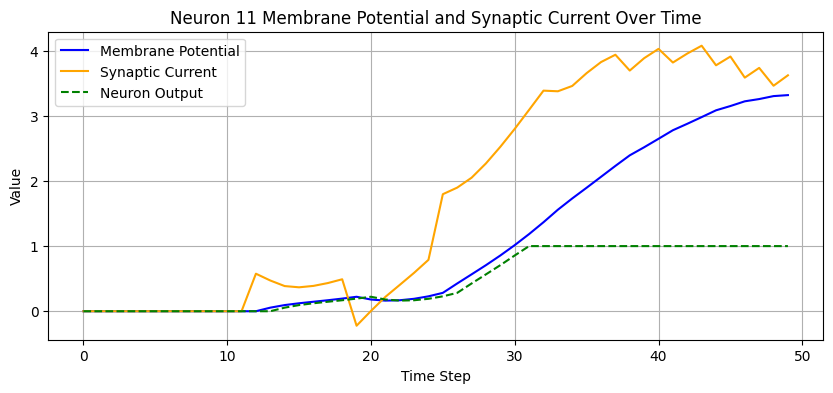

Neuron 12 is non-spiking.
Gamma value: 0.0


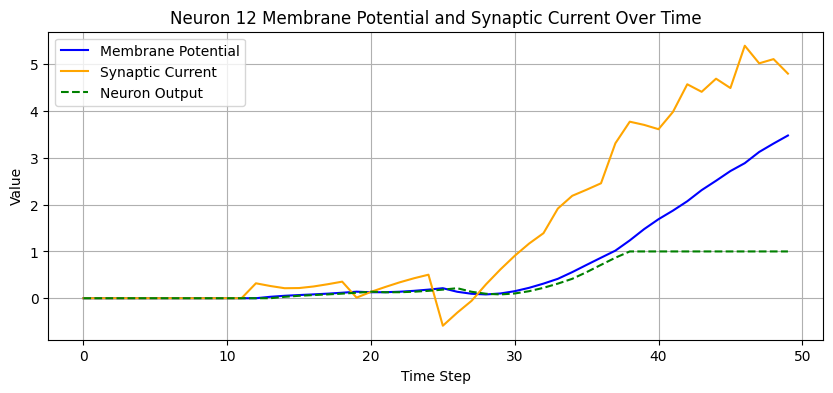

Neuron 13 is spiking.
Gamma value: 1.0


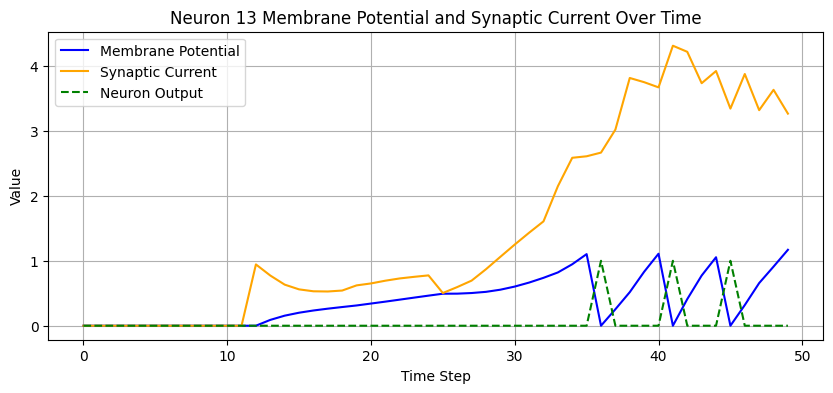

Neuron 14 is non-spiking.
Gamma value: 0.0


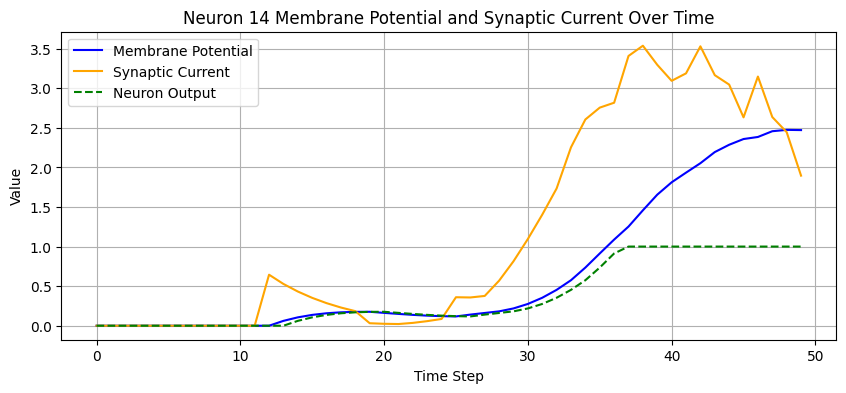

Neuron 15 is non-spiking.
Gamma value: 0.0


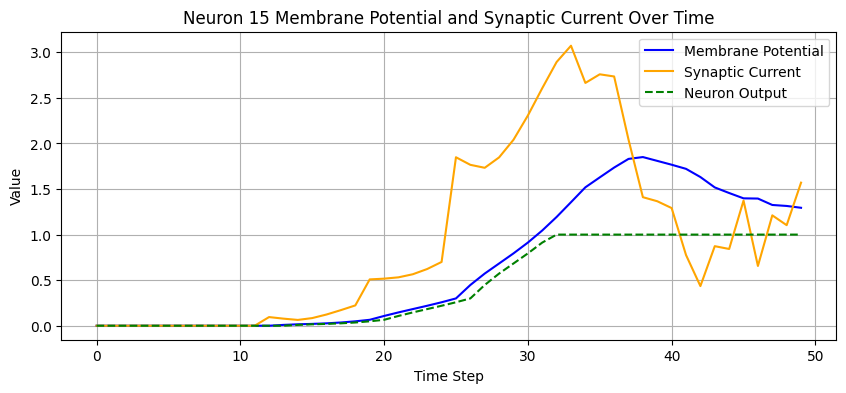

Neuron 16 is non-spiking.
Gamma value: 0.0


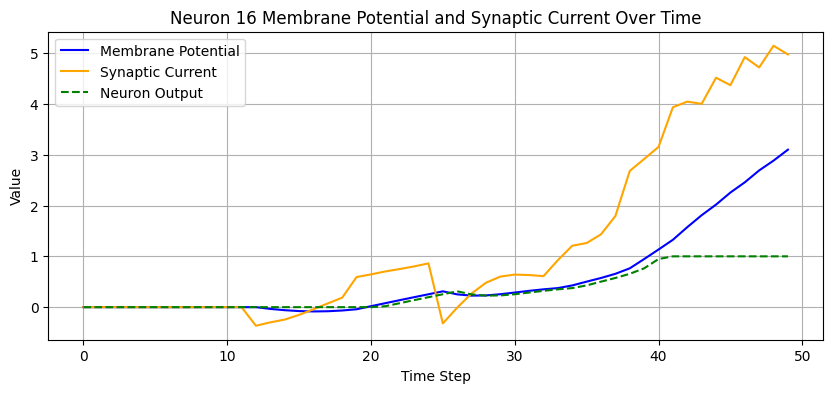

Neuron 17 is spiking.
Gamma value: 1.0


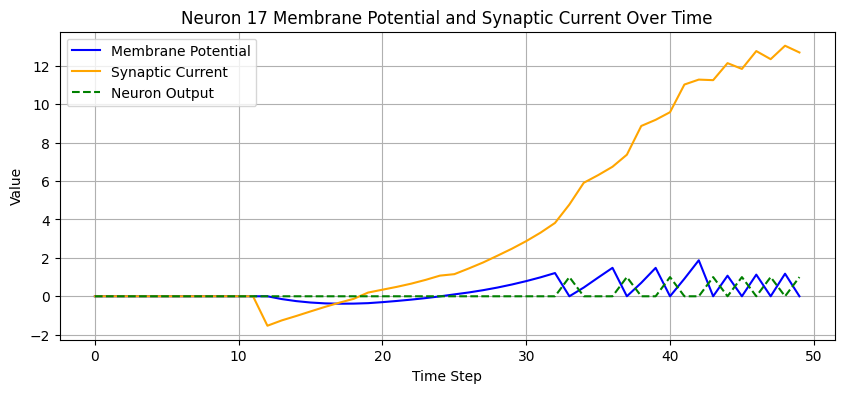

Neuron 18 is non-spiking.
Gamma value: 0.0


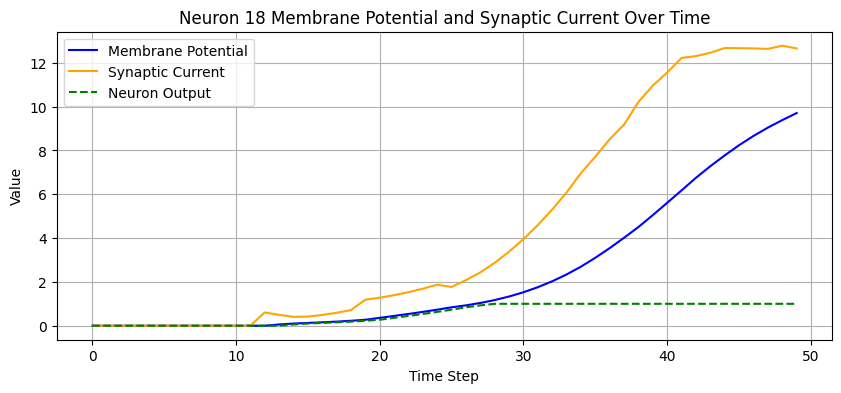

Neuron 19 is non-spiking.
Gamma value: 0.0


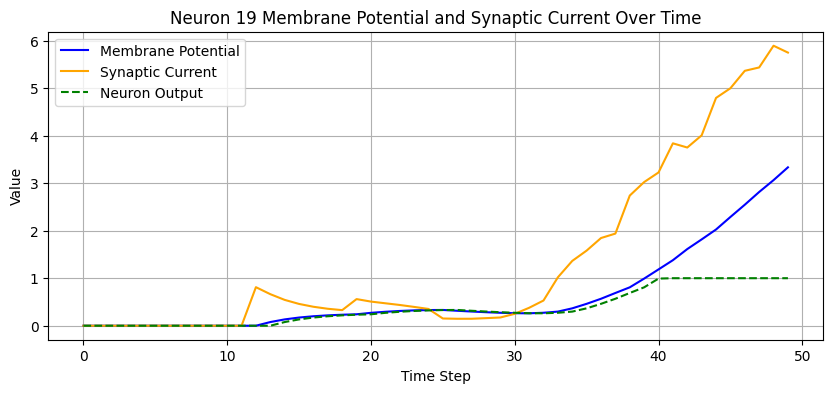

Seed: 3


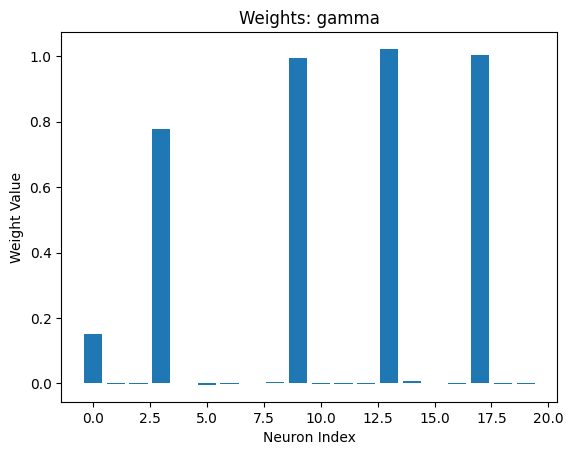

Testing: 100%|██████████| 1/1 [00:00<00:00, 25.81it/s]


Accuracy before binarizing gamma: 1.0


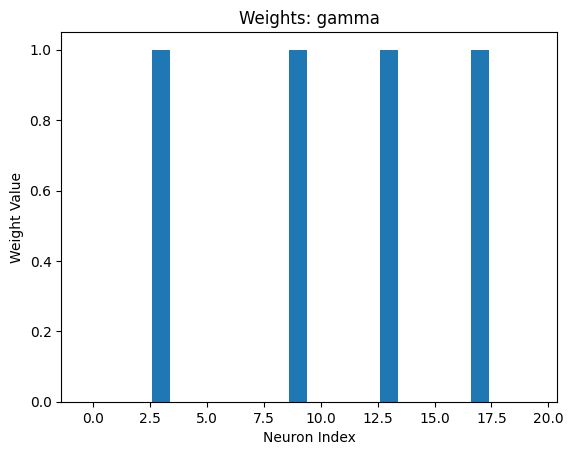

Testing: 100%|██████████| 1/1 [00:00<00:00, 26.12it/s]


Accuracy after binarizing gamma: 1.0


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


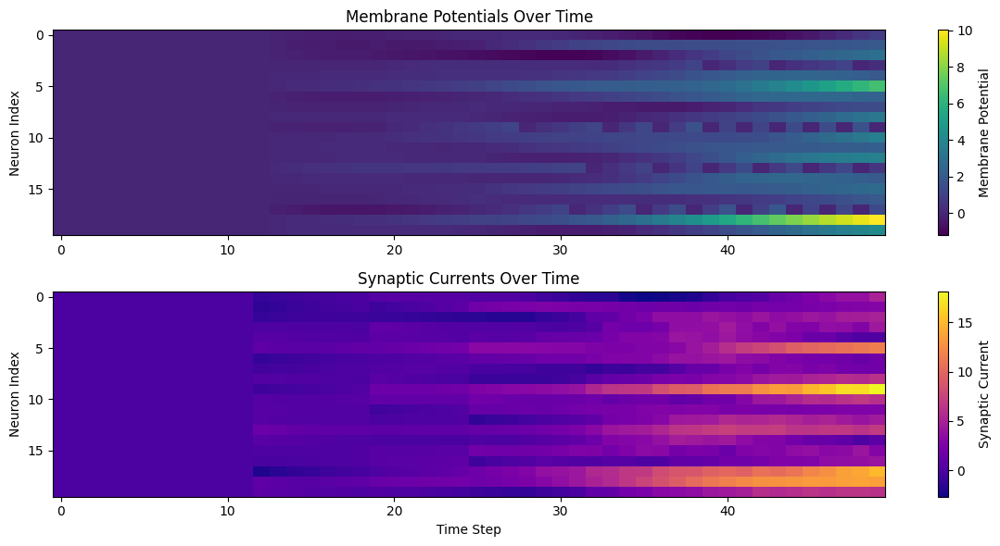

Neuron 0 is non-spiking.
Gamma value: 0.0


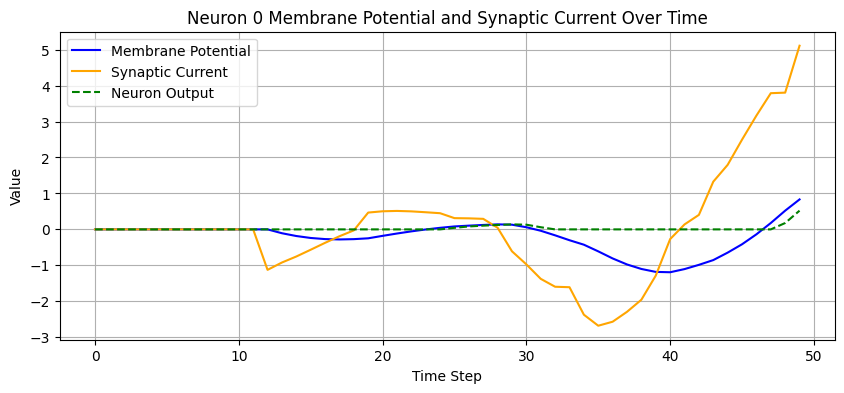

Neuron 1 is non-spiking.
Gamma value: 0.0


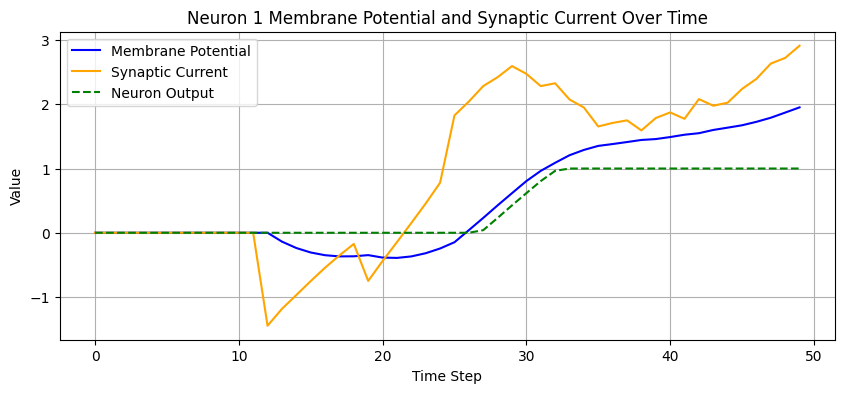

Neuron 2 is non-spiking.
Gamma value: 0.0


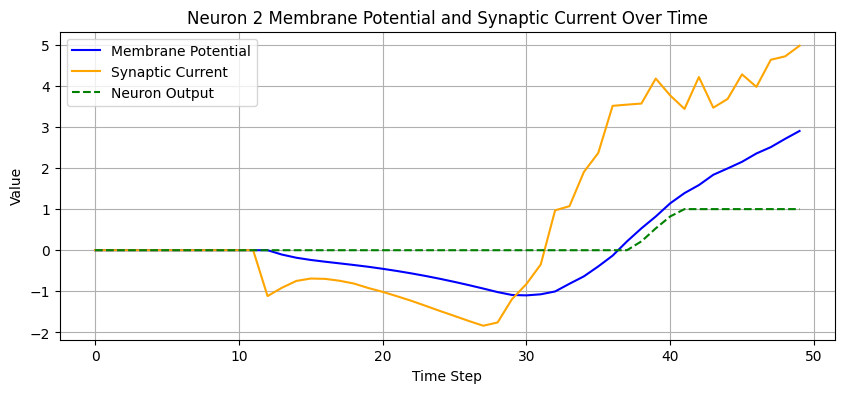

Neuron 3 is spiking.
Gamma value: 1.0


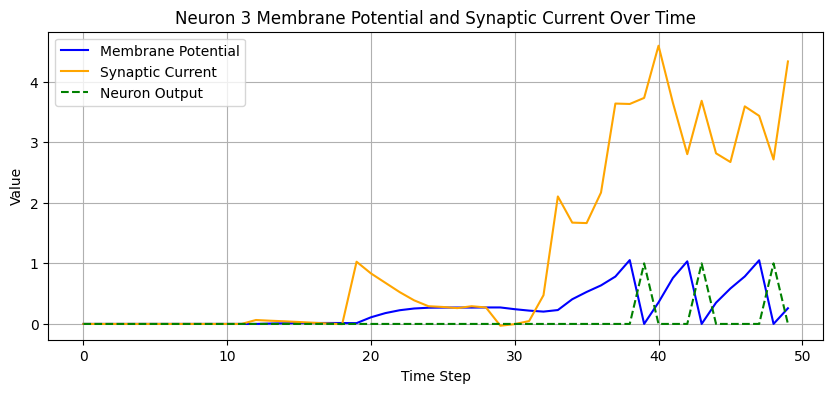

Neuron 4 is non-spiking.
Gamma value: 0.0


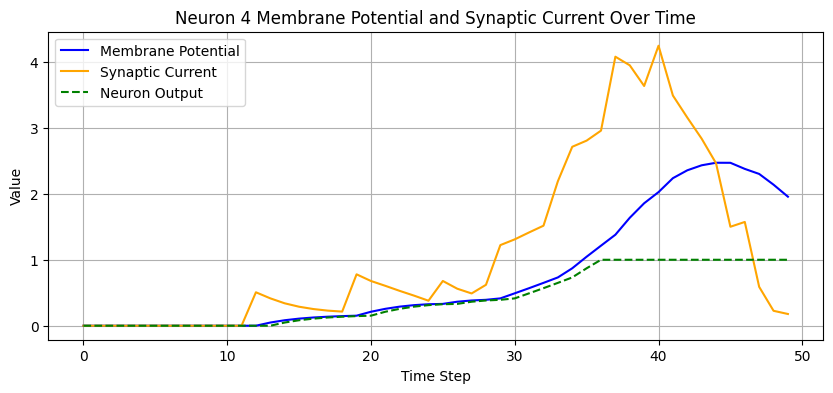

Neuron 5 is non-spiking.
Gamma value: 0.0


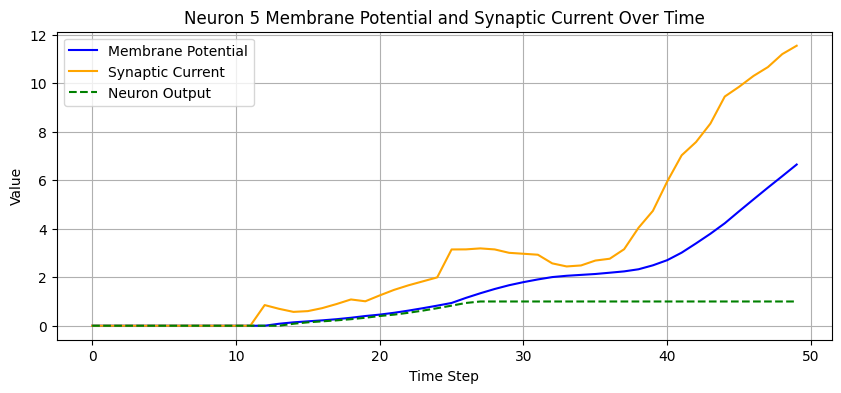

Neuron 6 is non-spiking.
Gamma value: 0.0


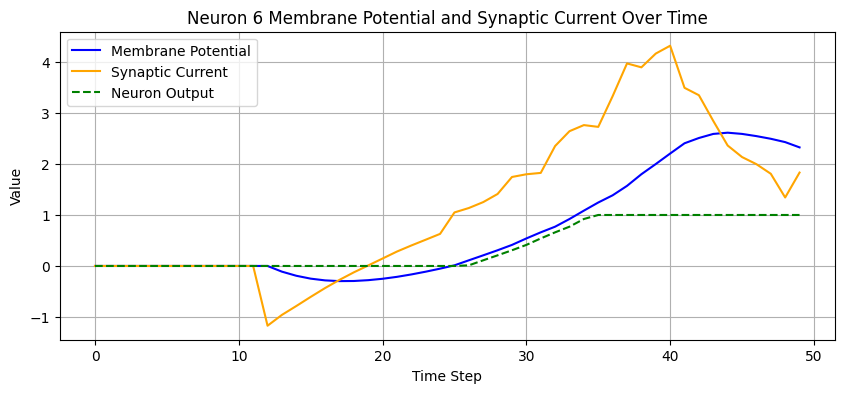

Neuron 7 is non-spiking.
Gamma value: 0.0


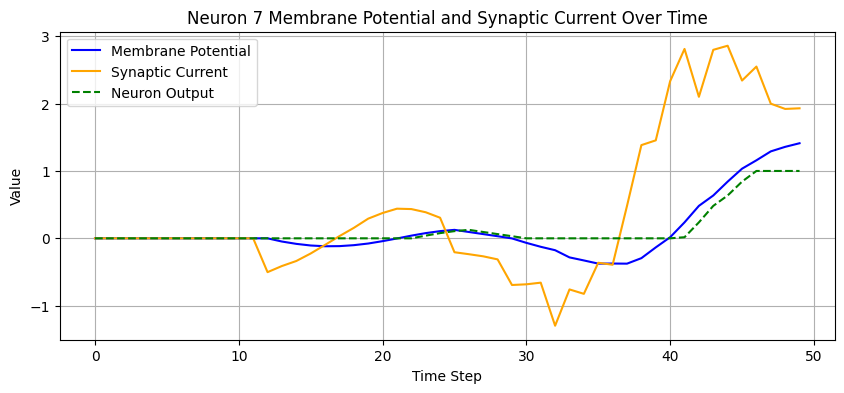

Neuron 8 is non-spiking.
Gamma value: 0.0


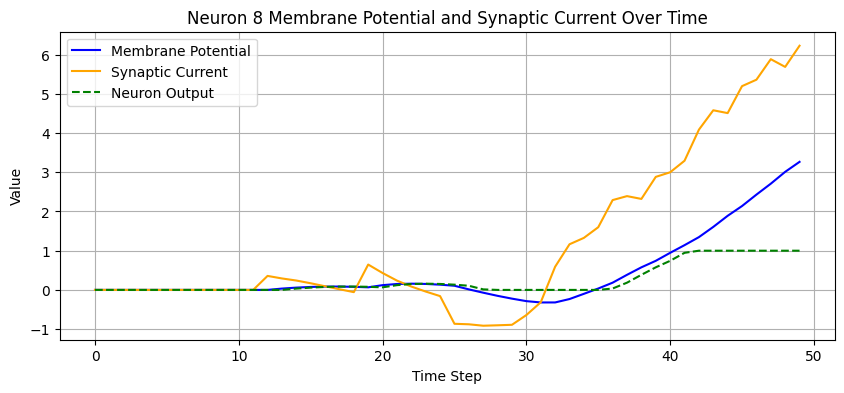

Neuron 9 is spiking.
Gamma value: 1.0


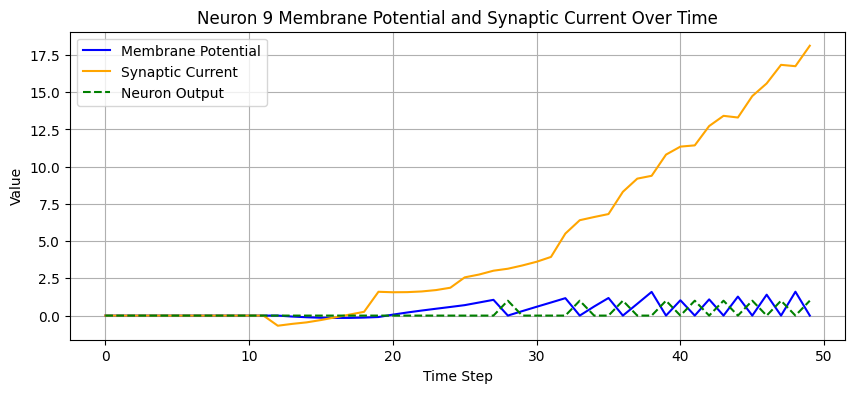

Neuron 10 is non-spiking.
Gamma value: 0.0


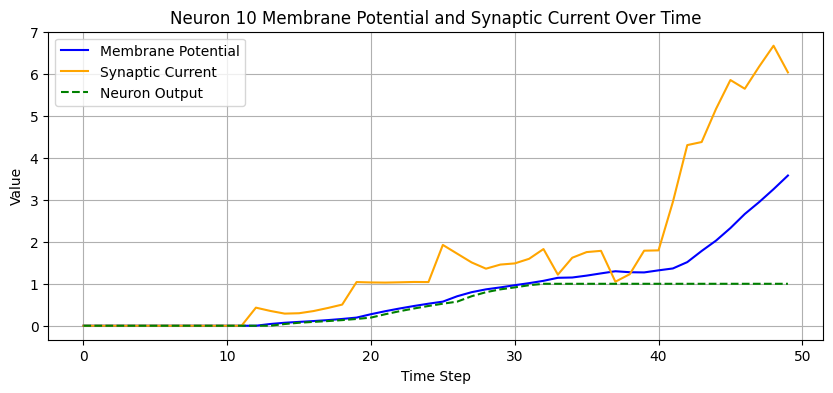

Neuron 11 is non-spiking.
Gamma value: 0.0


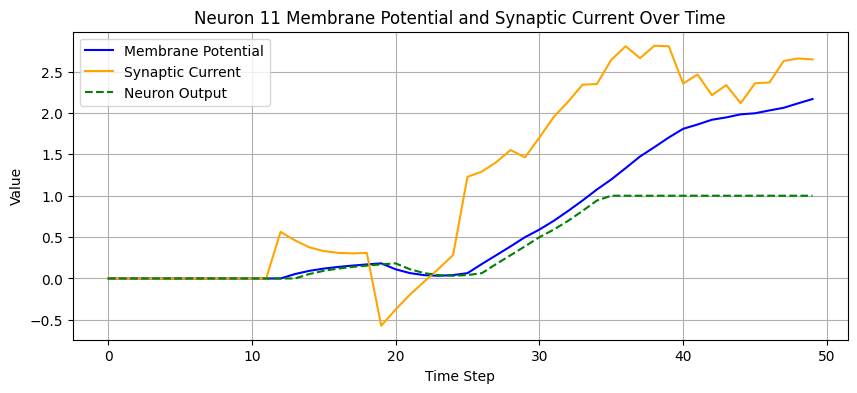

Neuron 12 is non-spiking.
Gamma value: 0.0


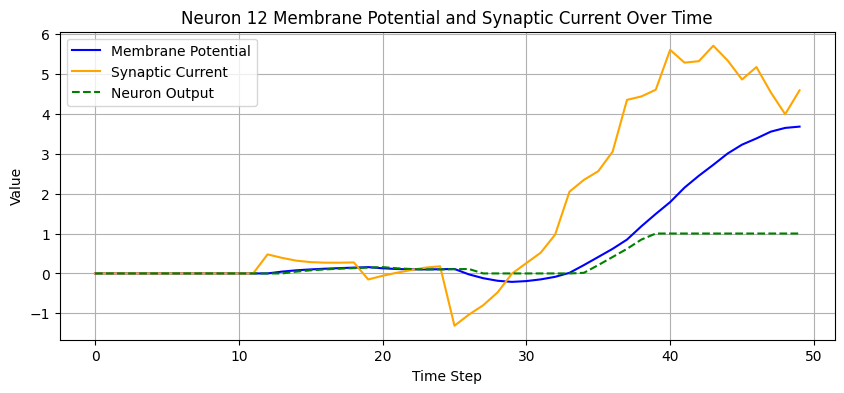

Neuron 13 is spiking.
Gamma value: 1.0


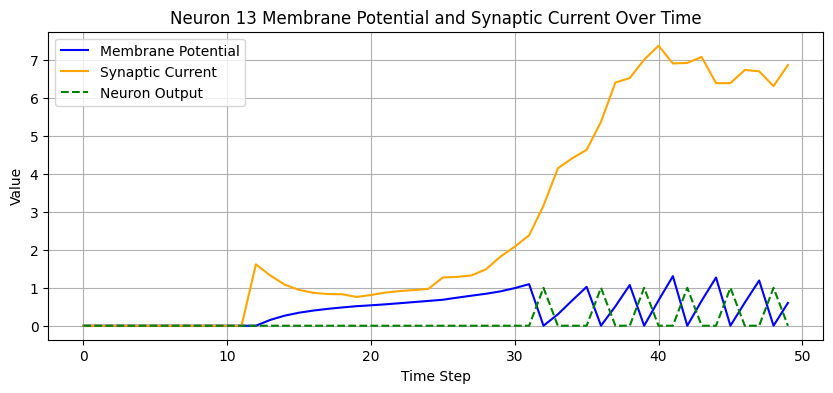

Neuron 14 is non-spiking.
Gamma value: 0.0


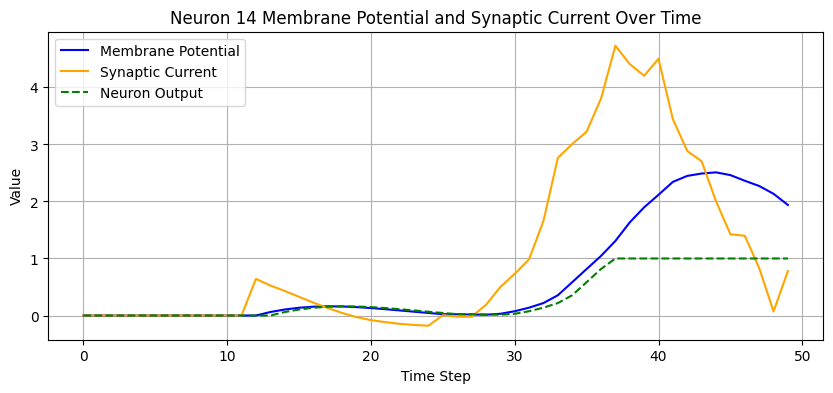

Neuron 15 is non-spiking.
Gamma value: 0.0


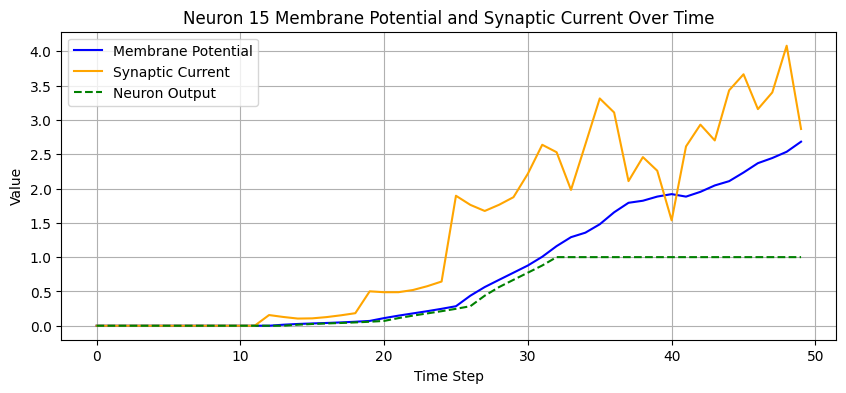

Neuron 16 is non-spiking.
Gamma value: 0.0


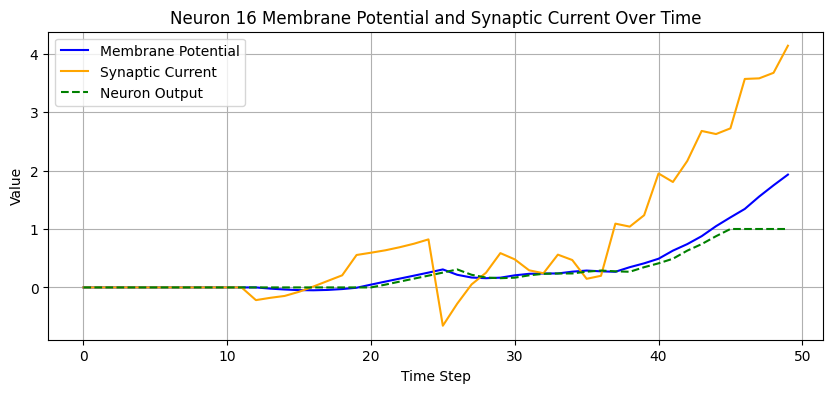

Neuron 17 is spiking.
Gamma value: 1.0


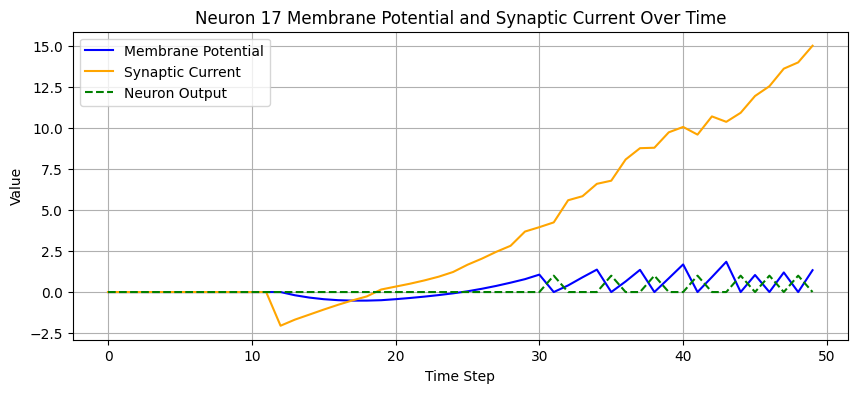

Neuron 18 is non-spiking.
Gamma value: 0.0


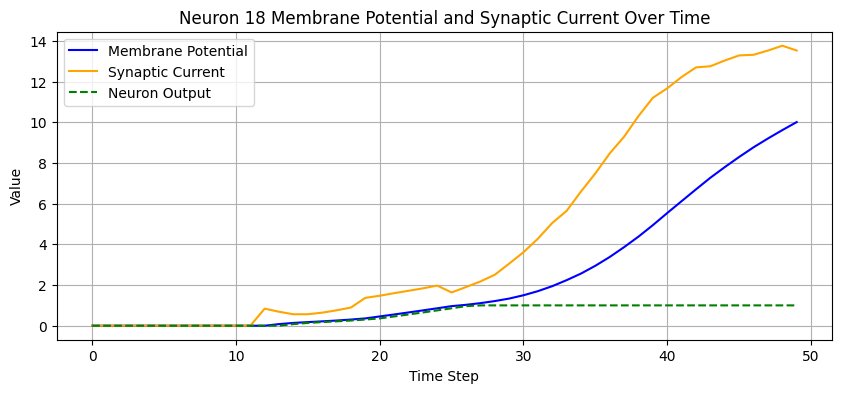

Neuron 19 is non-spiking.
Gamma value: 0.0


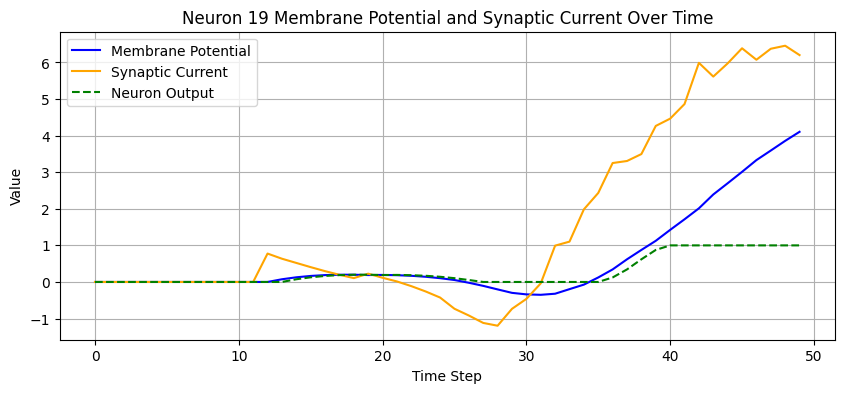

Seed: 4


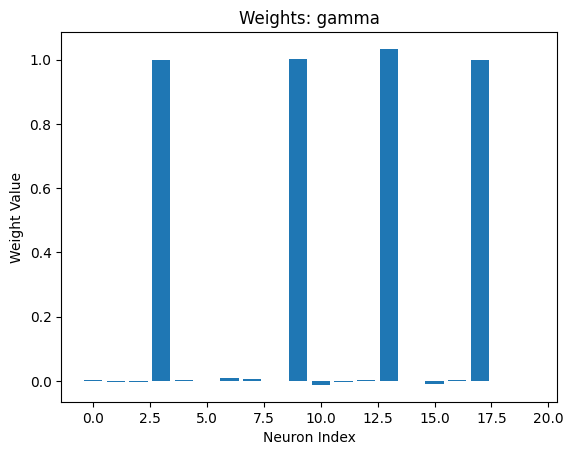

Testing: 100%|██████████| 1/1 [00:00<00:00, 25.30it/s]


Accuracy before binarizing gamma: 1.0


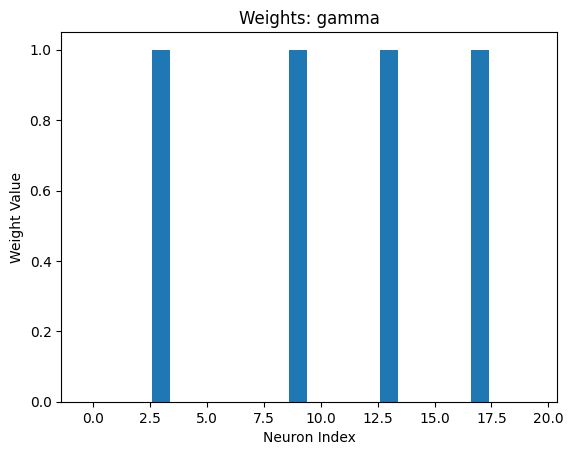

Testing: 100%|██████████| 1/1 [00:00<00:00, 25.63it/s]


Accuracy after binarizing gamma: 0.9975000023841858


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


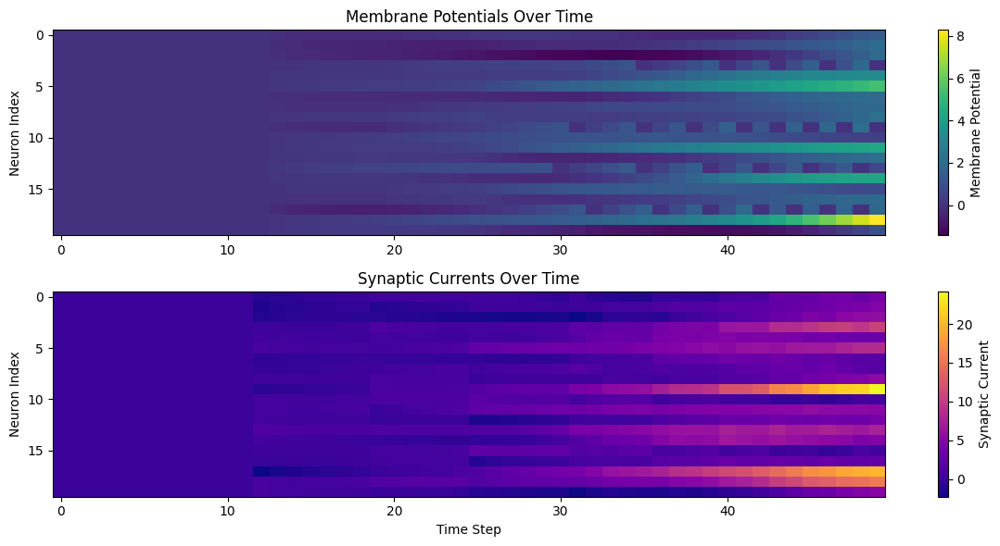

Neuron 0 is non-spiking.
Gamma value: 0.0


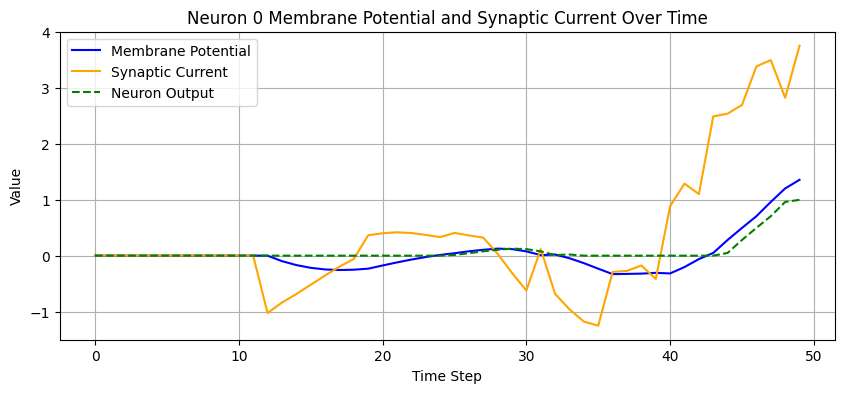

Neuron 1 is non-spiking.
Gamma value: 0.0


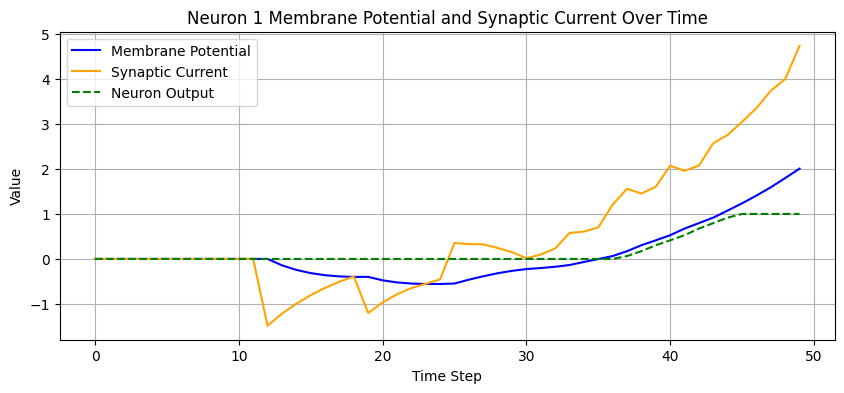

Neuron 2 is non-spiking.
Gamma value: 0.0


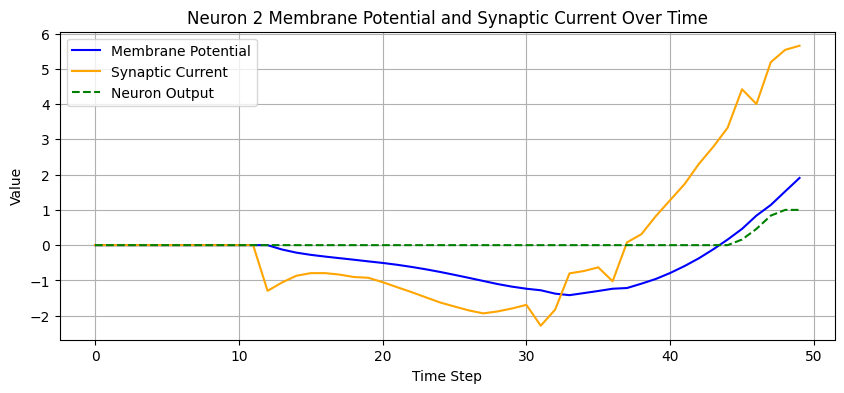

Neuron 3 is spiking.
Gamma value: 1.0


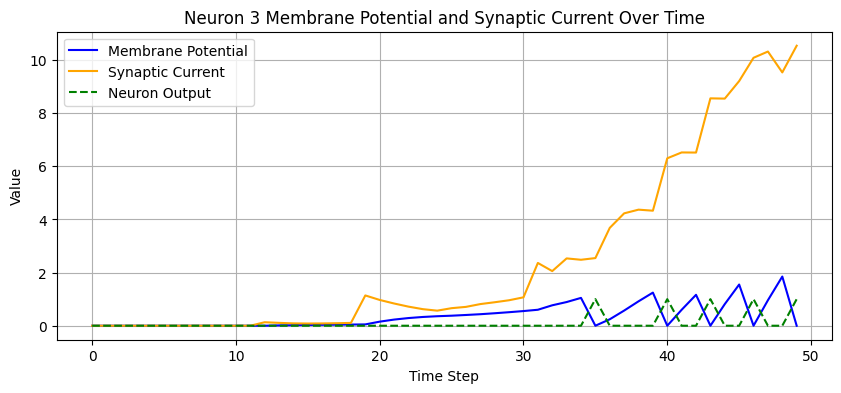

Neuron 4 is non-spiking.
Gamma value: 0.0


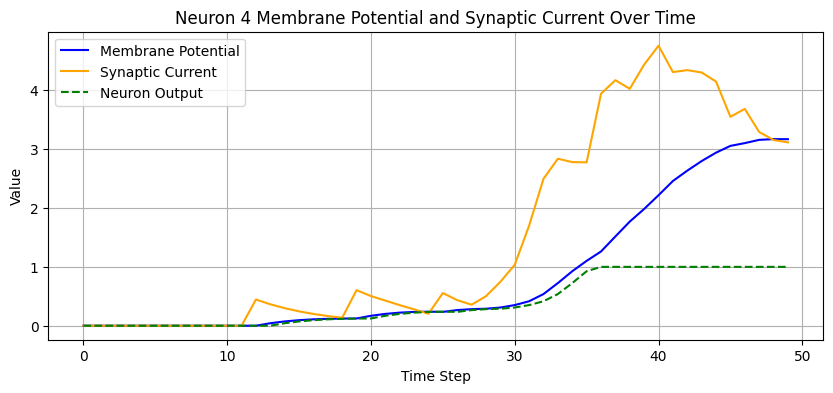

Neuron 5 is non-spiking.
Gamma value: 0.0


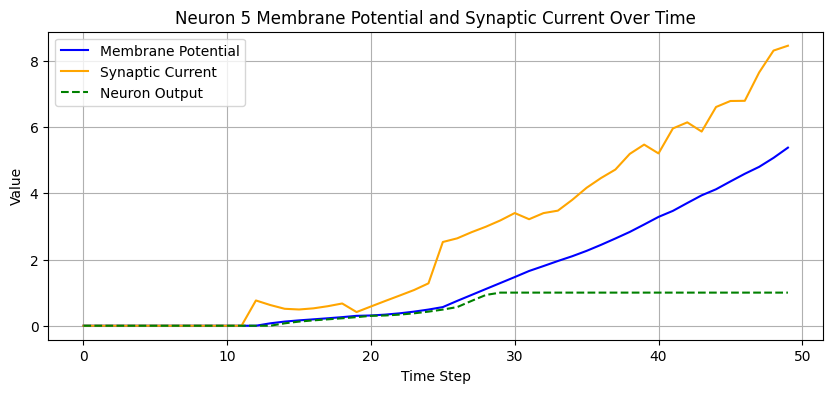

Neuron 6 is non-spiking.
Gamma value: 0.0


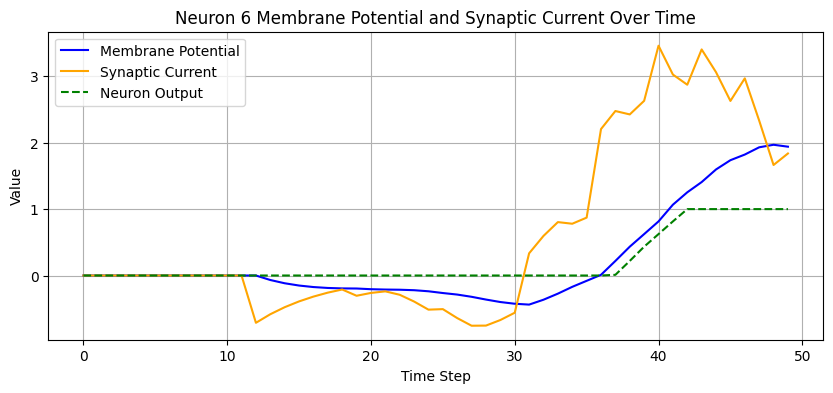

Neuron 7 is non-spiking.
Gamma value: 0.0


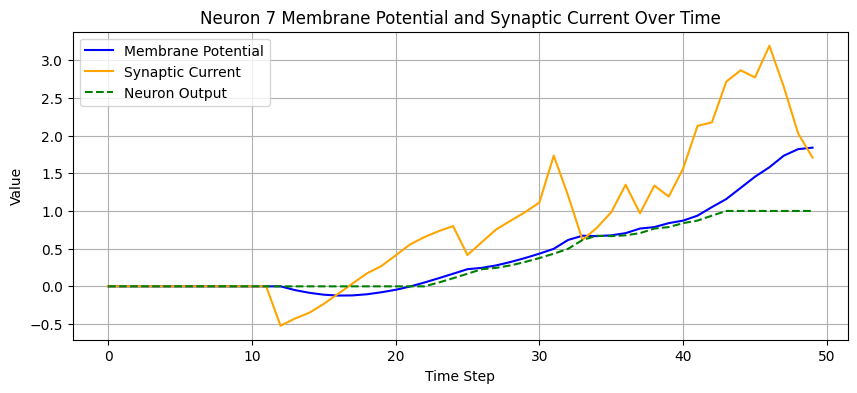

Neuron 8 is non-spiking.
Gamma value: 0.0


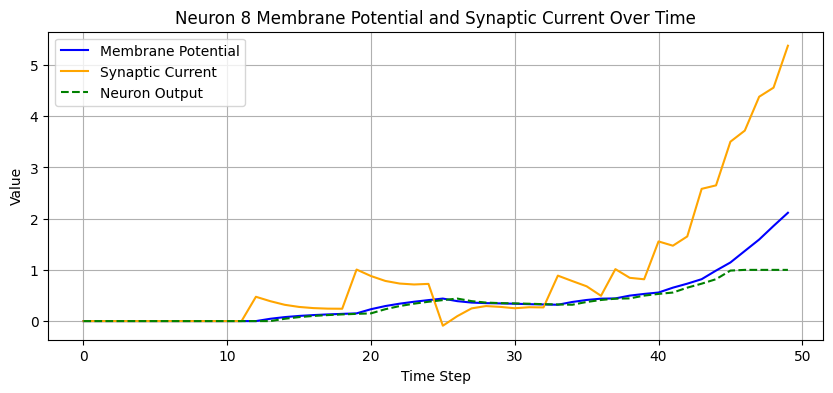

Neuron 9 is spiking.
Gamma value: 1.0


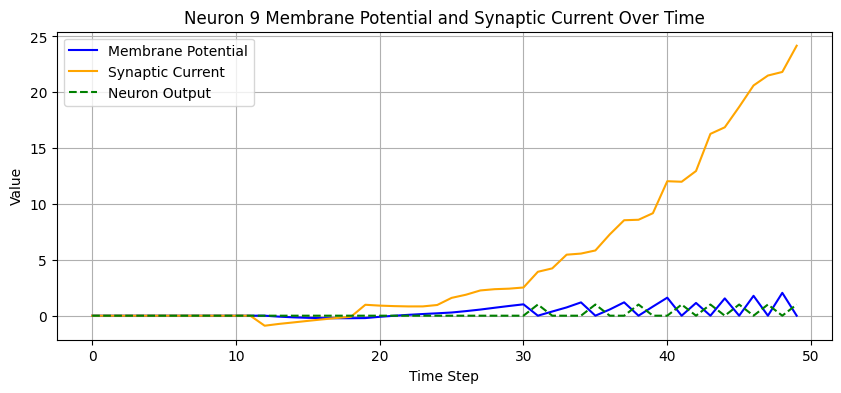

Neuron 10 is non-spiking.
Gamma value: 0.0


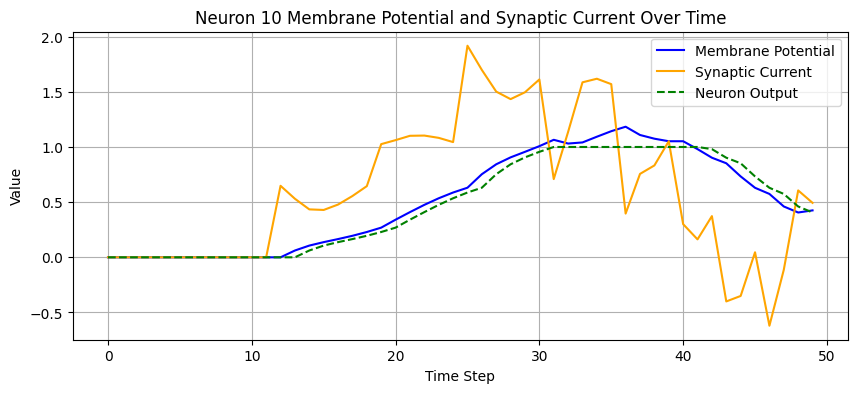

Neuron 11 is non-spiking.
Gamma value: 0.0


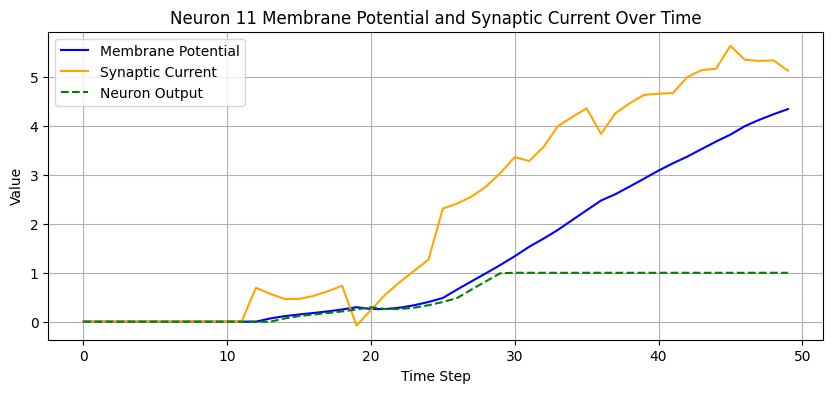

Neuron 12 is non-spiking.
Gamma value: 0.0


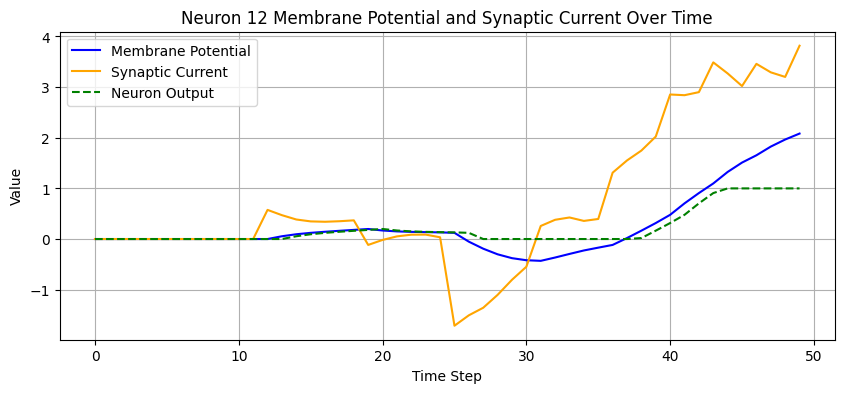

Neuron 13 is spiking.
Gamma value: 1.0


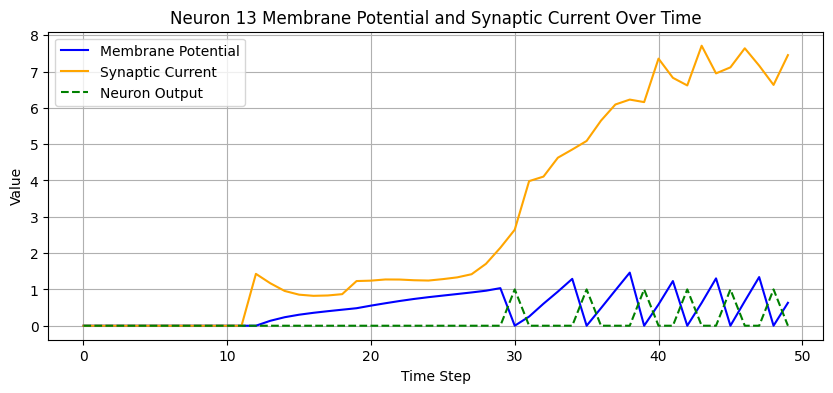

Neuron 14 is non-spiking.
Gamma value: 0.0


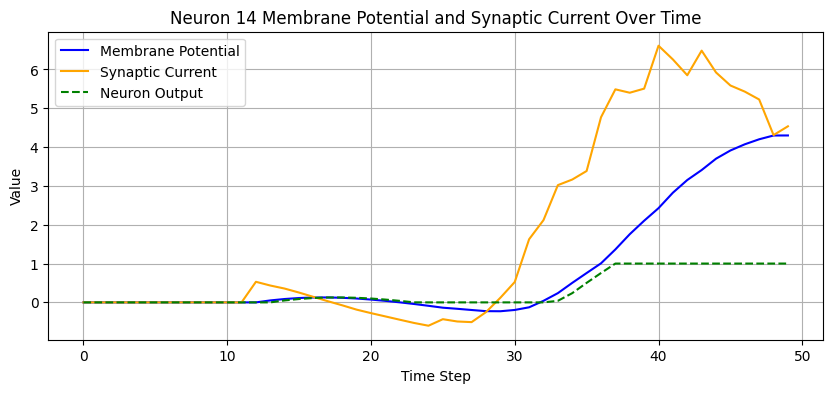

Neuron 15 is non-spiking.
Gamma value: 0.0


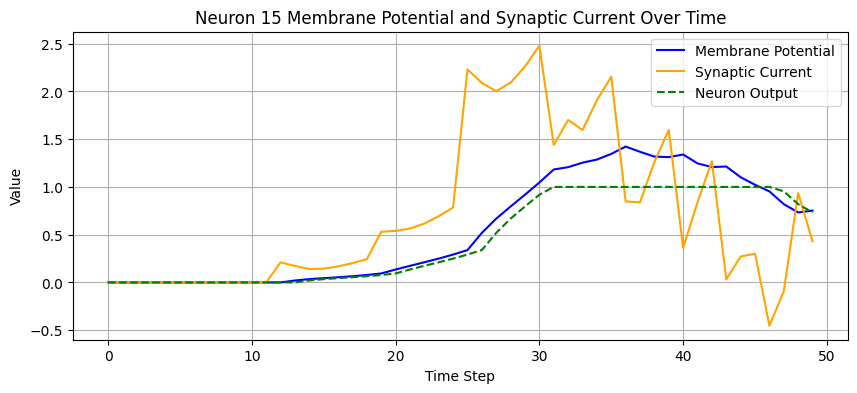

Neuron 16 is non-spiking.
Gamma value: 0.0


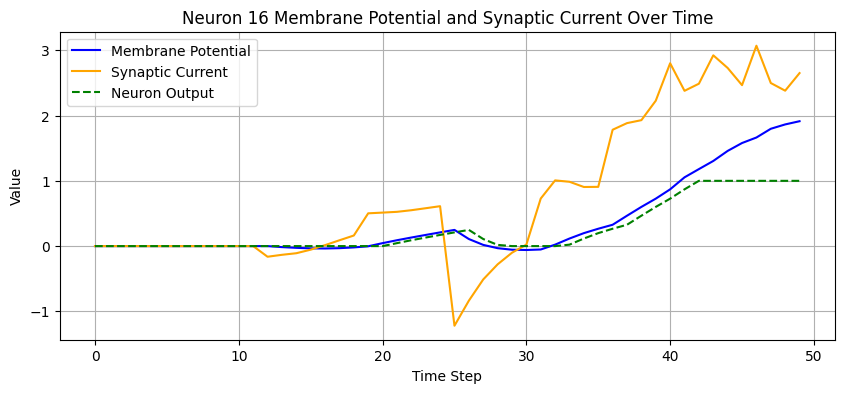

Neuron 17 is spiking.
Gamma value: 1.0


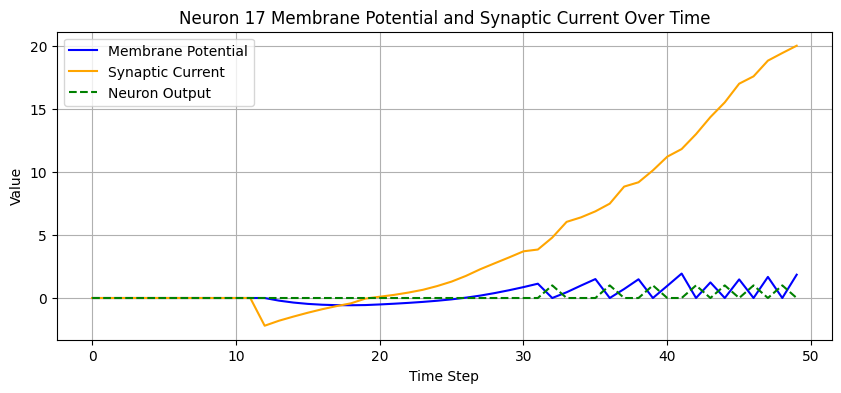

Neuron 18 is non-spiking.
Gamma value: 0.0


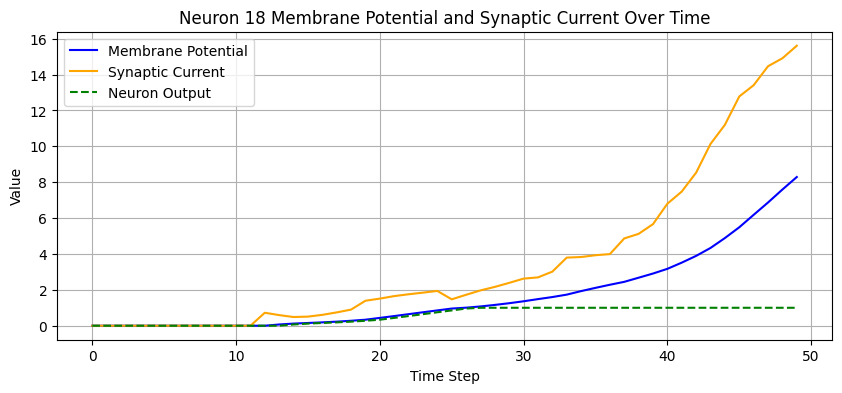

Neuron 19 is non-spiking.
Gamma value: 0.0


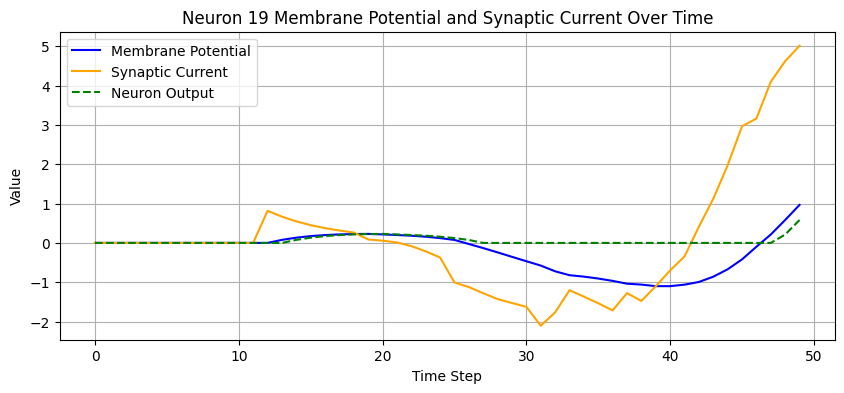

Seed: 5


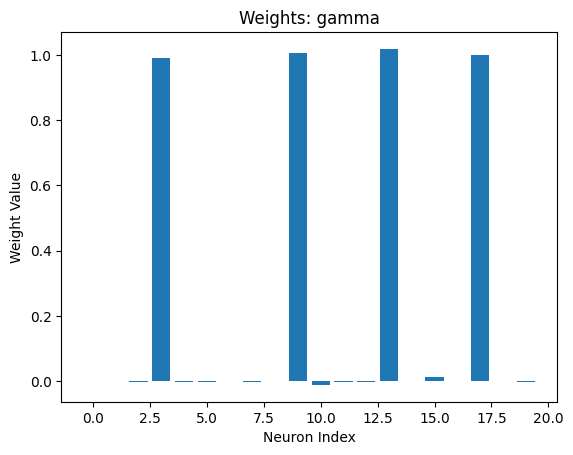

Testing: 100%|██████████| 1/1 [00:00<00:00, 25.87it/s]


Accuracy before binarizing gamma: 1.0


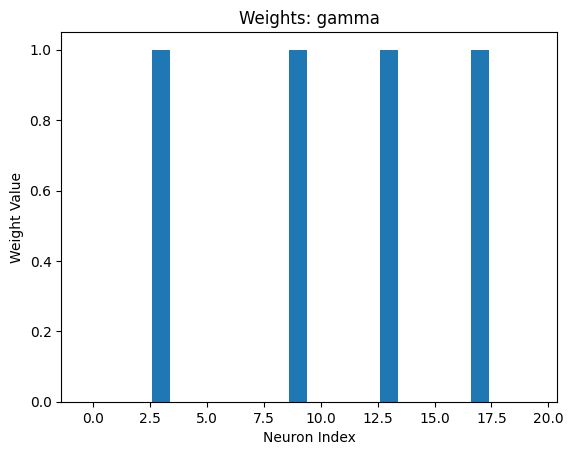

Testing: 100%|██████████| 1/1 [00:00<00:00, 26.47it/s]


Accuracy after binarizing gamma: 1.0


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


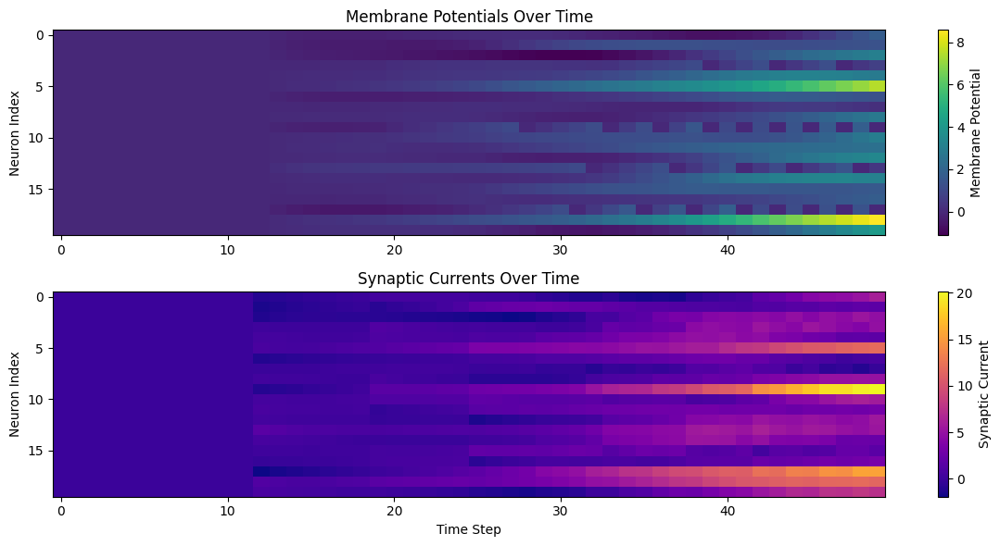

Neuron 0 is non-spiking.
Gamma value: 0.0


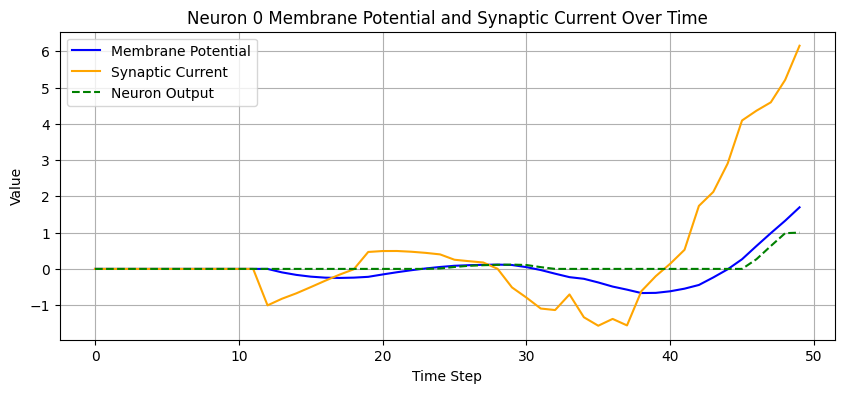

Neuron 1 is non-spiking.
Gamma value: 0.0


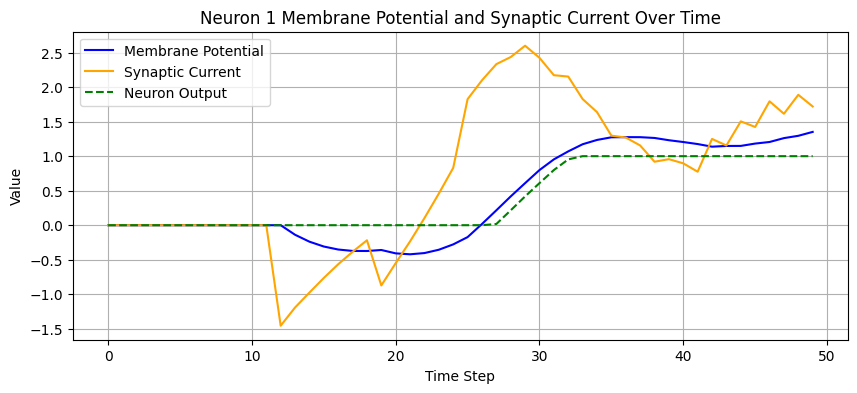

Neuron 2 is non-spiking.
Gamma value: 0.0


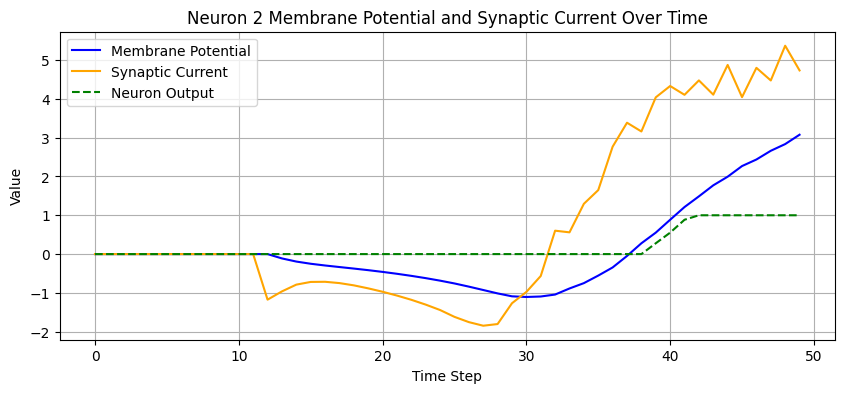

Neuron 3 is spiking.
Gamma value: 1.0


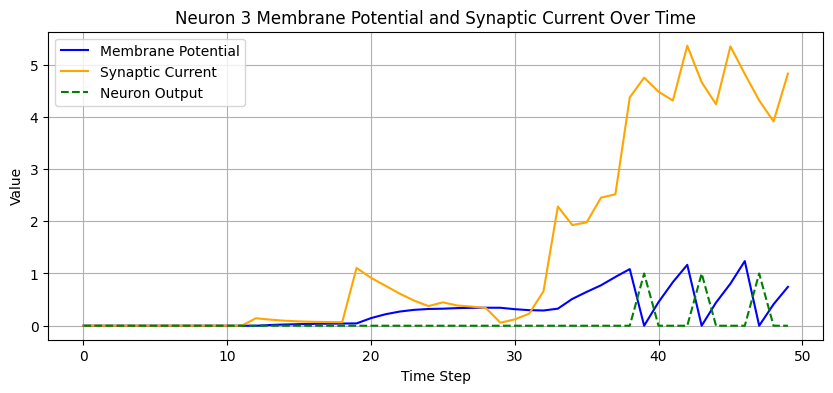

Neuron 4 is non-spiking.
Gamma value: 0.0


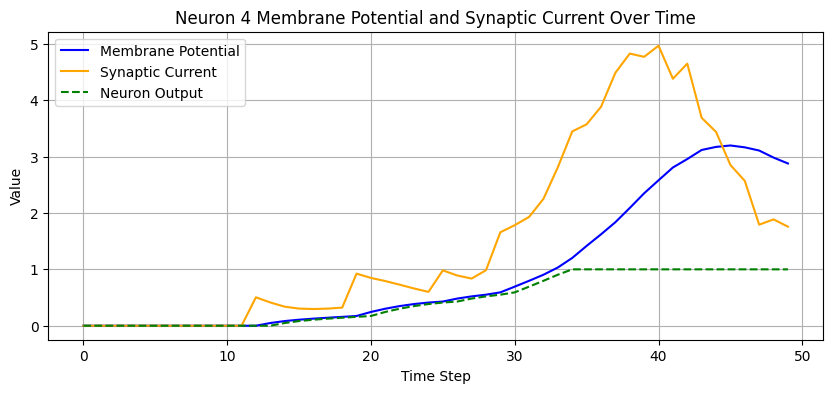

Neuron 5 is non-spiking.
Gamma value: 0.0


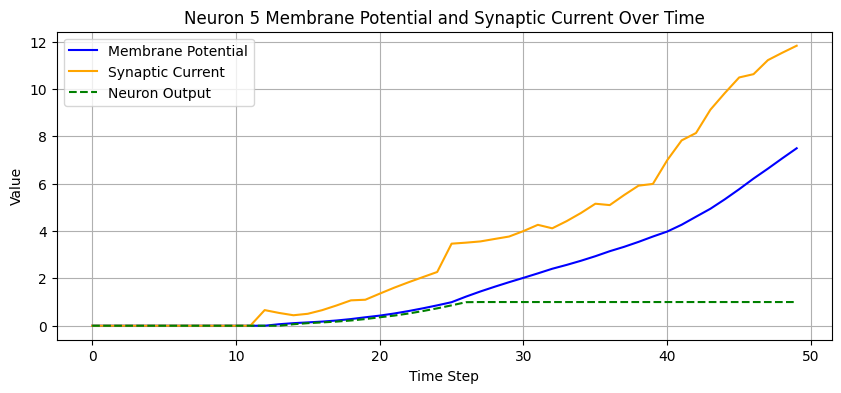

Neuron 6 is non-spiking.
Gamma value: 0.0


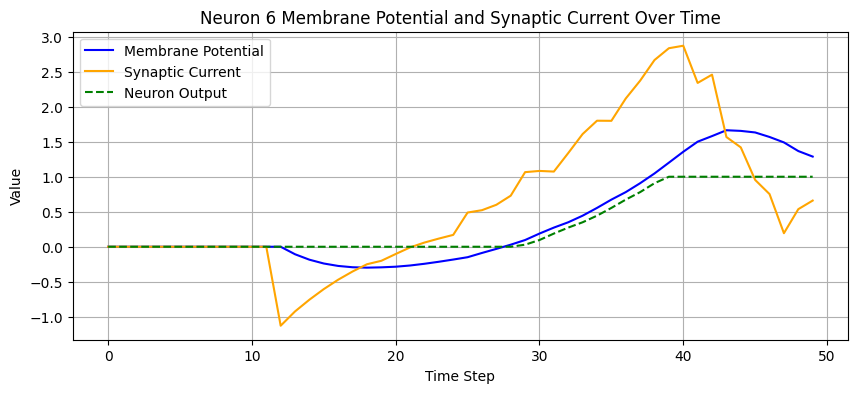

Neuron 7 is non-spiking.
Gamma value: 0.0


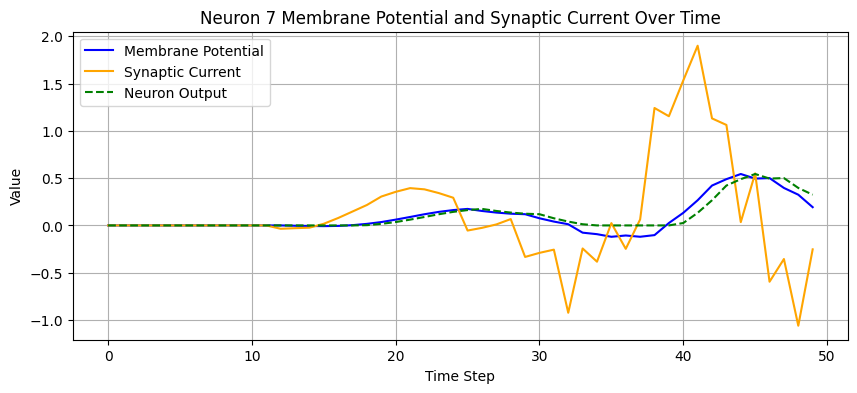

Neuron 8 is non-spiking.
Gamma value: 0.0


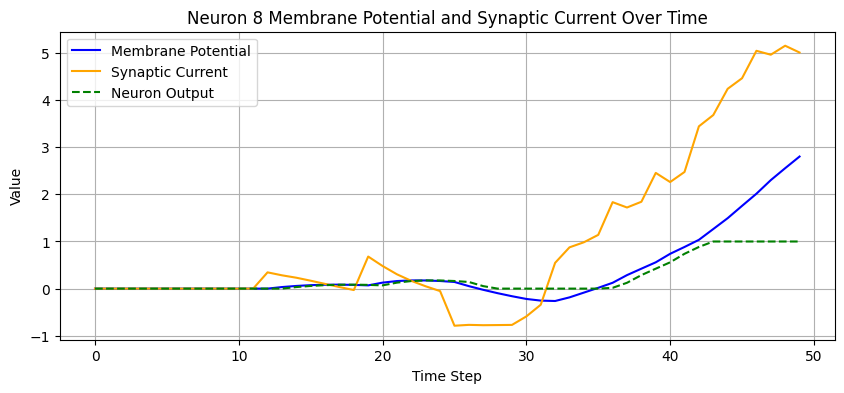

Neuron 9 is spiking.
Gamma value: 1.0


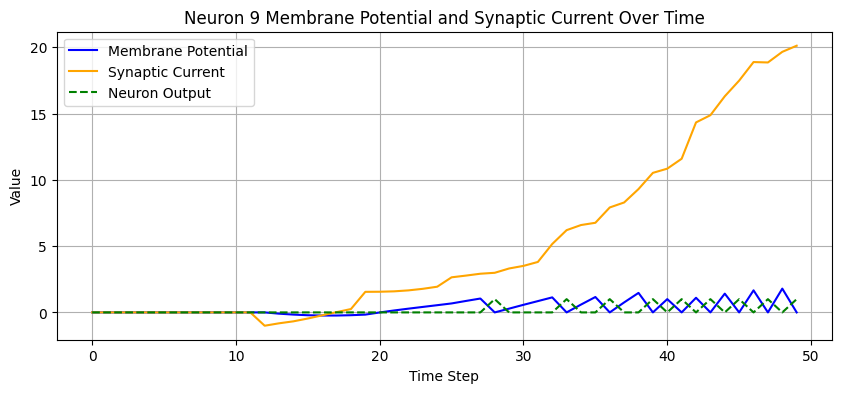

Neuron 10 is non-spiking.
Gamma value: 0.0


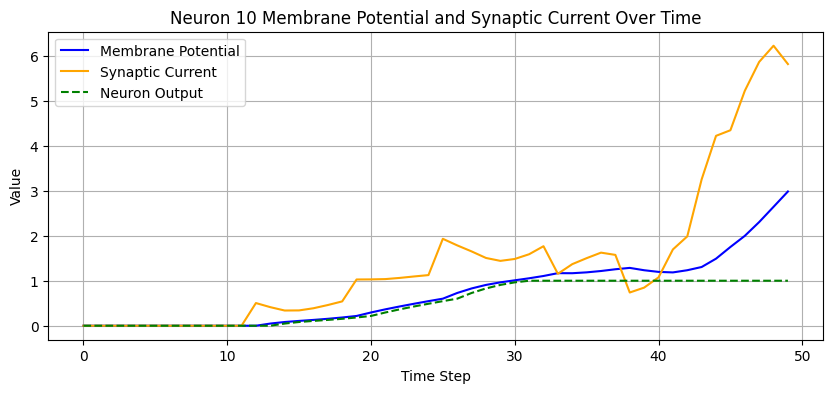

Neuron 11 is non-spiking.
Gamma value: 0.0


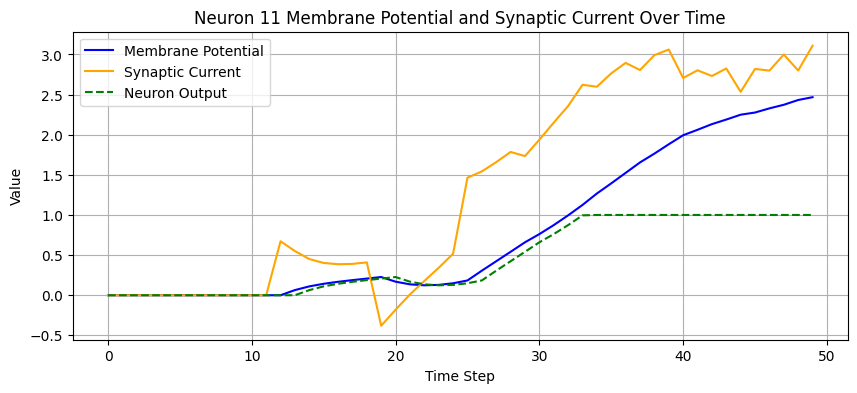

Neuron 12 is non-spiking.
Gamma value: 0.0


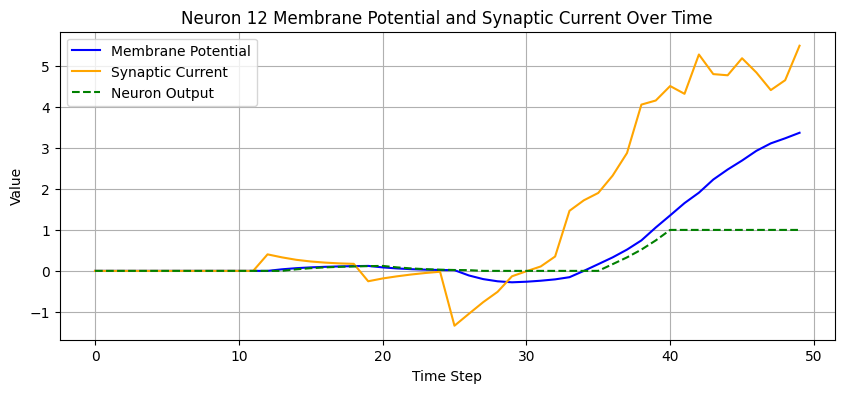

Neuron 13 is spiking.
Gamma value: 1.0


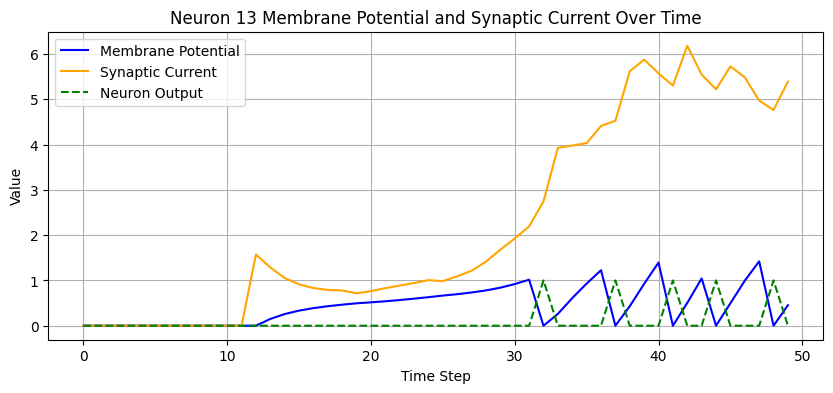

Neuron 14 is non-spiking.
Gamma value: 0.0


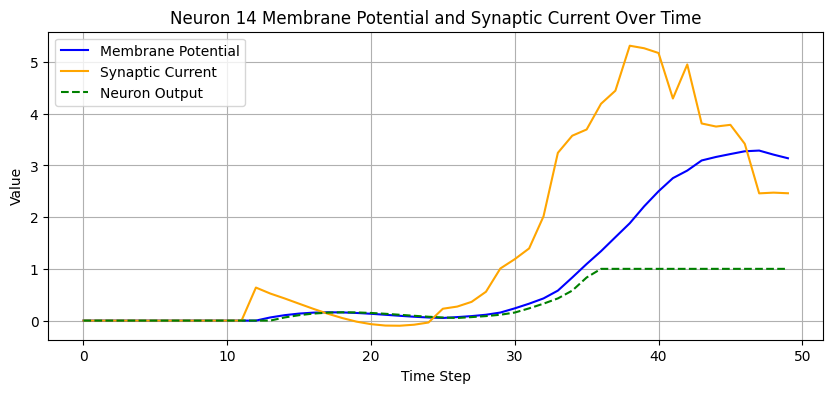

Neuron 15 is non-spiking.
Gamma value: 0.0


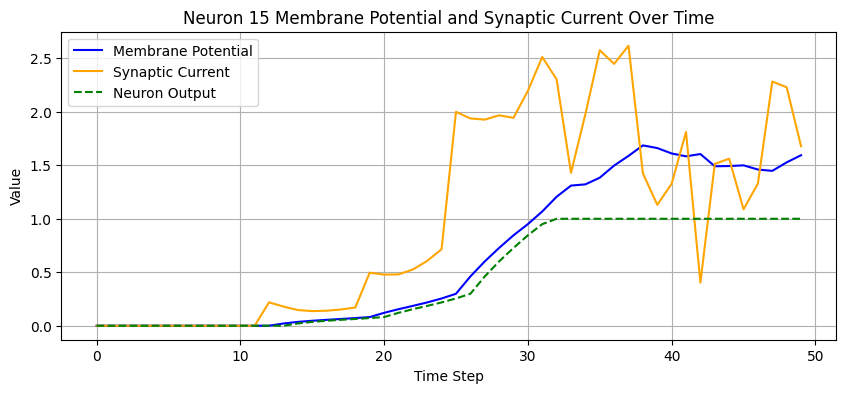

Neuron 16 is non-spiking.
Gamma value: 0.0


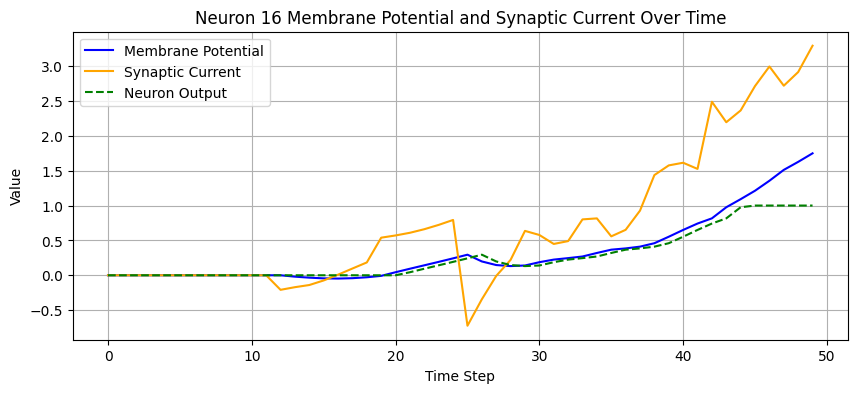

Neuron 17 is spiking.
Gamma value: 1.0


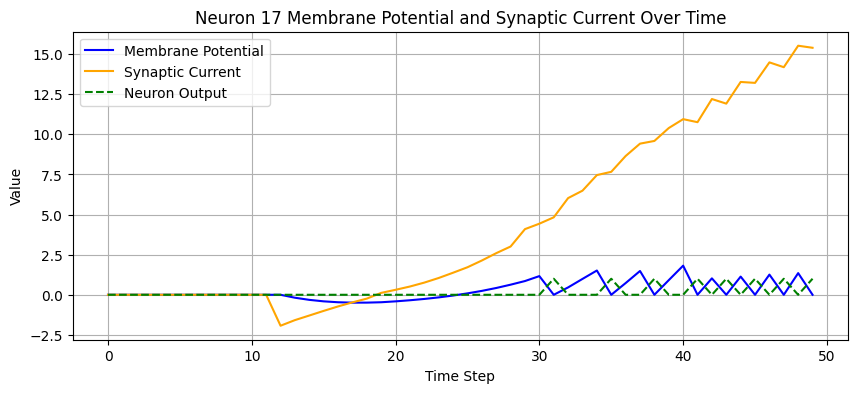

Neuron 18 is non-spiking.
Gamma value: 0.0


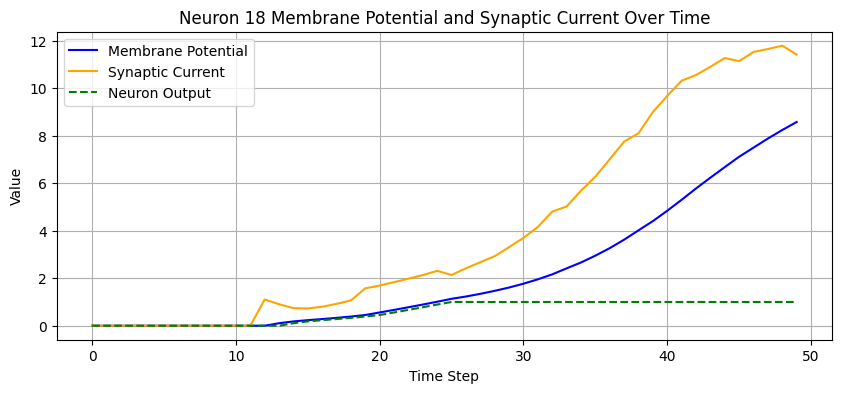

Neuron 19 is non-spiking.
Gamma value: 0.0


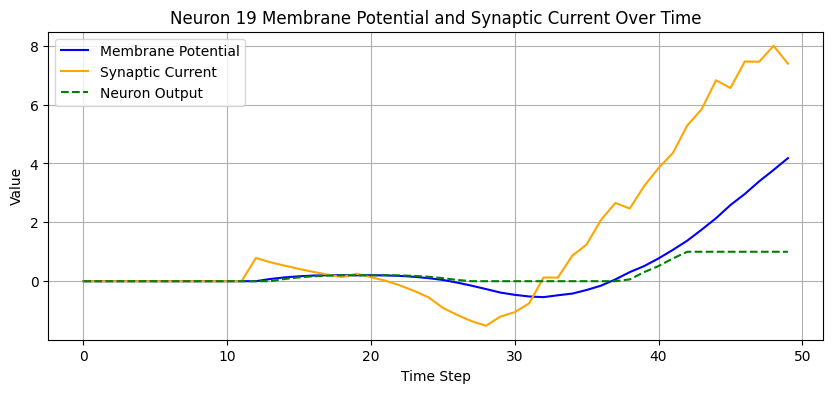

In [5]:
# Now let's compare accuracy with binarized gamma values vs. without binarized gamma values
from test_visualizations.utils import compute_accuracy
accuracy_comparison = {}
for seed in range(1,6):
    accuracy_comparison[seed] = {}
    print(f"Seed: {seed}")
    path = f"/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/20_hidden/1.0_pct_data/None_percent_snn/rand_gamma_init/gamma_fixed_False/reset_nsn_False/best_model_of_study.ckpt"
    model = load_model("Hybrid_NSN_SNN_V1_Flexible_Spiking", path)
    weights = return_weights(model)
    visualize_weights({"gamma": weights["gamma_param"]})
    accuracy = compute_accuracy(model, test_loader)
    accuracy_comparison[seed]['before_binarization'] = accuracy
    print(f"Accuracy before binarizing gamma: {accuracy}")
    
    model.binarize_gamma()  # Binarize gamma values 
    weights_after = return_weights(model)
    visualize_weights({"gamma": weights_after["gamma_param"]})
    gamma_param = weights_after["gamma_param"]
    accuracy_after = compute_accuracy(model, test_loader)
    accuracy_comparison[seed]['after_binarization'] = accuracy_after
    print(f"Accuracy after binarizing gamma: {accuracy_after}")
    auxiliary_outputs, hidden_out_t = get_membrane_potentials(model, test_loader)
    membrane_potentials = auxiliary_outputs['membrane_potentials'] # Something weird is happening here?
    synaptic_currents = auxiliary_outputs['synaptic_currents']
    graph_membrane_potentials_and_synaptic_currents(membrane_potentials.cpu().detach().numpy(), synaptic_currents.cpu().detach().numpy(), example_idx=0)
    neuron_idx = 0
    for neuron_idx in range(membrane_potentials.shape[2]):
        if gamma_param[neuron_idx] > 0.5:
            print(f"Neuron {neuron_idx} is spiking.")
        else:
            print(f"Neuron {neuron_idx} is non-spiking.")
        print(f"Gamma value: {gamma_param[neuron_idx].item()}")
        single_mem_and_syn_potential(membrane_potentials.cpu().detach().numpy(), synaptic_currents.cpu().detach().numpy(), hidden_out_t.cpu().detach().numpy(), neuron_idx, example_idx=0)
    # Identify if the neuron is spiking or nonspiking using gamma


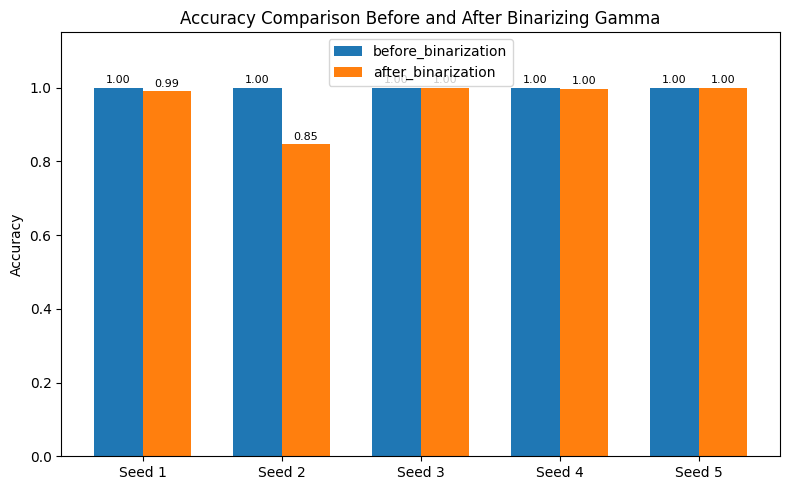

In [6]:
# TO DO: Replace with TPE optimized form
# Plot all accuracies for all seeds in a single grouped bar chart
import numpy as np
def plot_grouped_bar_chart(accuracy_comparison, tlabel = "Accuracy"):
    labels = list(next(iter(accuracy_comparison.values())).keys())
    seeds = list(accuracy_comparison.keys())
    n_labels = len(labels)
    n_seeds = len(seeds)

    bar_width = 0.35
    x = np.arange(n_seeds)

    # Prepare data for each label
    values_per_label = []
    for label in labels:
        values_per_label.append([accuracy_comparison[seed][label] for seed in seeds])

    # Dynamically set y-axis limit based on max value
    max_val = max([max(values) for values in values_per_label])
    y_max = max_val * 1.15 if max_val > 0 else 1

    plt.figure(figsize=(8, 5))
    for i, (label, values) in enumerate(zip(labels, values_per_label)):
        plt.bar(x + i * bar_width, values, width=bar_width, label=label)

    plt.xticks(x + bar_width / 2, [f"Seed {seed}" for seed in seeds])
    plt.ylabel(tlabel)
    plt.ylim(0, y_max)
    plt.title(f"{tlabel} Comparison Before and After Binarizing Gamma")
    plt.legend()
    for i in range(n_labels):
        for j, v in enumerate(values_per_label[i]):
            plt.text(j + i * bar_width, v + y_max*0.01, f"{v:.2f}", ha='center', fontsize=8)
    plt.tight_layout()
    plt.show()
plot_grouped_bar_chart(accuracy_comparison)

Seed: 1
Seed: 2
Seed: 3
Seed: 4
Seed: 5


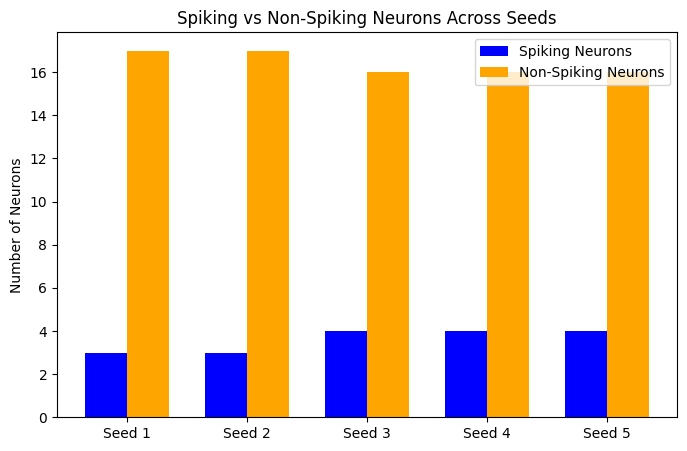

In [7]:
# Go through the models and show the % of spiking vs. non-spiking neurons
spiking_stats = {}
for seed in range(1,6):
    accuracy_comparison[seed] = {}
    print(f"Seed: {seed}")
    path = f"/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/20_hidden/1.0_pct_data/None_percent_snn/rand_gamma_init/gamma_fixed_False/reset_nsn_False/best_model_of_study.ckpt"
    model = load_model("Hybrid_NSN_SNN_V1_Flexible_Spiking", path)
    weights = return_weights(model)
    gamma_param = weights["gamma_param"]
    n_spiking = (gamma_param > 0.5).sum().item()
    n_non_spiking = (gamma_param <= 0.5).sum().item()
    total = n_spiking + n_non_spiking
    spiking_stats[seed] = {
        "n_spiking": n_spiking,
        "n_non_spiking": n_non_spiking,
        "total": total,
        "percent_spiking": (n_spiking / total * 100) if total > 0 else 0
    }

# Plot the spiking stats
labels = list(spiking_stats.keys())
n_spiking = [spiking_stats[seed]['n_spiking'] for seed in labels]
n_non_spiking = [spiking_stats[seed]['n_non_spiking'] for seed in labels]
x = np.arange(len(labels))
bar_width = 0.35
plt.figure(figsize=(8, 5))
plt.bar(x - bar_width/2, n_spiking, width=bar_width, label='Spiking Neurons', color='blue')
plt.bar(x + bar_width/2, n_non_spiking, width=bar_width, label='Non-Spiking Neurons', color='orange')
plt.xticks(x, [f"Seed {seed}" for seed in labels])
plt.ylabel('Number of Neurons')
plt.title('Spiking vs Non-Spiking Neurons Across Seeds')
plt.legend()

# Do spiking neurons generalize better?

Thoughts:
- Maybe partially due to hyperparameters?

In [8]:
def get_spikes(model, test_loader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.test_accuracy.reset()
    model.to(device)
    model.zero_grad()
    spikes = []
    for inputs, targets in tqdm(test_loader, desc="Testing"):
        inputs, targets = inputs.to(device), targets.to(device)
        _, auxiliary_outputs, _, _ = model(inputs)
        spikes.append(auxiliary_outputs['spikes'])
    return spikes

def percent_neurons_spiking(spikes, gamma_param):
    values = []
    for spike in spikes:
        neuron_level_agg = spike.sum(dim=[0, 1])
        neuron_level_agg = (neuron_level_agg > 0).float()
        values.append((neuron_level_agg.sum()/gamma_param.sum()).cpu().item())
    return np.mean(values)

def average_spikes_per_neuron(spikes, gamma_param):
    values = []
    for spike in spikes:
        # Sum across time
        total_spikes_across_time = spike.sum(dim=[1])
        # Take mean across batch (neuron level retained)
        mean_spikes_per_batch = total_spikes_across_time.mean(dim=[0])
        # Then just take mean across all spiking neurons
        values.append((mean_spikes_per_batch.sum().cpu().item())/gamma_param.sum().cpu().item())
    return np.mean(values)


Seed: 1


Testing: 100%|██████████| 1/1 [00:00<00:00, 25.05it/s]

Seed: 2



Testing: 100%|██████████| 1/1 [00:00<00:00, 26.37it/s]


Seed: 3


Testing: 100%|██████████| 1/1 [00:00<00:00, 26.84it/s]


Seed: 4


Testing: 100%|██████████| 1/1 [00:00<00:00, 25.90it/s]


Seed: 5


Testing: 100%|██████████| 1/1 [00:00<00:00, 26.27it/s]


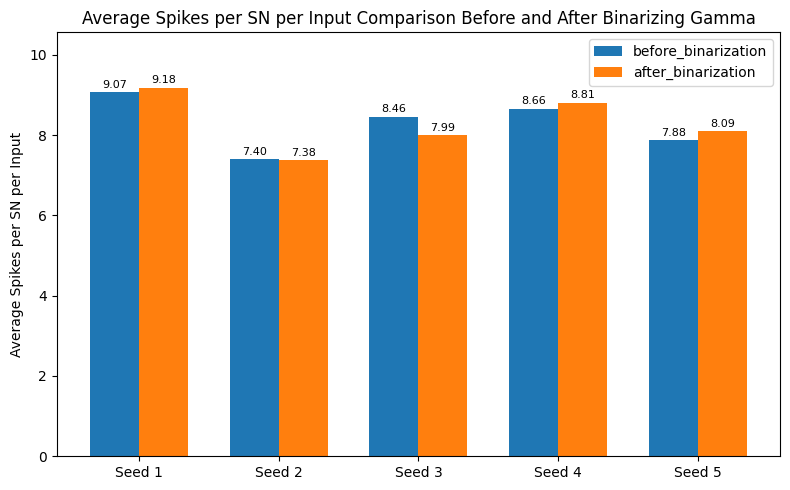

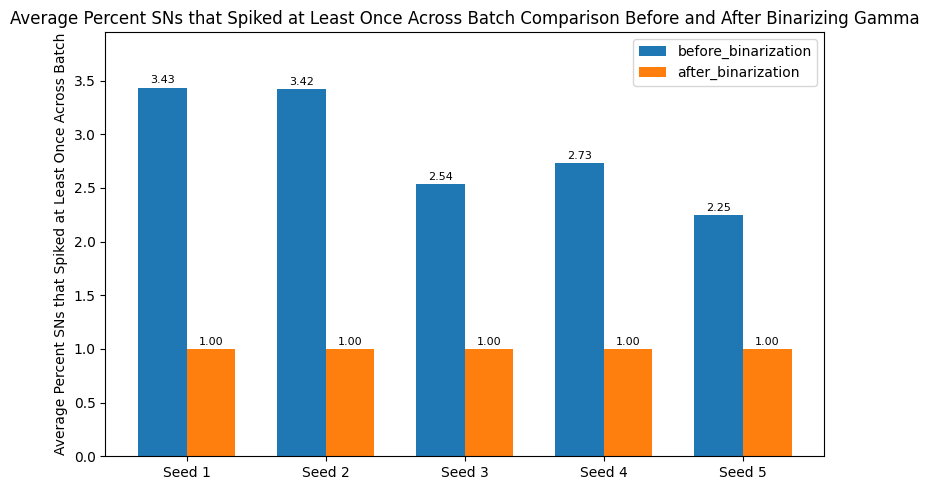

In [9]:
percent_neurons_spiking_d = {}
average_spikes_per_neuron_d = {}
for seed in range(1,6):
    percent_neurons_spiking_d[seed] = {}
    average_spikes_per_neuron_d[seed] = {}
    print(f"Seed: {seed}")
    path = f"/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/20_hidden/1.0_pct_data/None_percent_snn/rand_gamma_init/gamma_fixed_False/reset_nsn_False/best_model_of_study.ckpt"
    model = load_model("Hybrid_NSN_SNN_V1_Flexible_Spiking", path)
    weights = return_weights(model)
    gamma_param = weights["gamma_param"]
    spikes = get_spikes(model, test_loader)
    percent_neurons_spiking_d[seed]["before_binarization"] = percent_neurons_spiking(spikes, gamma_param)
    average_spikes_per_neuron_d[seed]["before_binarization"] = average_spikes_per_neuron(spikes, gamma_param)
    model.binarize_gamma()  # Binarize gamma values
    weights_after = return_weights(model)
    gamma_param = weights_after["gamma_param"]
    spikes = get_spikes(model, test_loader)
    percent_neurons_spiking_d[seed]["after_binarization"] = percent_neurons_spiking(spikes, gamma_param)
    average_spikes_per_neuron_d[seed]["after_binarization"] = average_spikes_per_neuron(spikes, gamma_param)
plot_grouped_bar_chart(average_spikes_per_neuron_d, "Average Spikes per SN per Input")
plot_grouped_bar_chart(percent_neurons_spiking_d, "Average Percent SNs that Spiked at Least Once Across Batch")



In [10]:
# Next -> visualize first a